In [1]:
# COMPLETE

# Basic Libraries
import numpy as np # for math computation, array/data prep
import pandas as pd # for importing data and wrangling
import matplotlib.pyplot as plt # for plotting/charts

#Plot styling
import seaborn as sns; sns.set()  # for plot styling
from datetime import datetime  #to convert string to datetime

# for Encoding
from sklearn.preprocessing import LabelEncoder # for nominal categorical column
from sklearn.preprocessing import OrdinalEncoder # for ordinal categorical column

# Needed to connect to the database
import pyodbc
from sqlalchemy import create_engine

# for oversampling of minority class

from sklearn.utils import resample

from sklearn.feature_selection import RFE   # For feature selection

In [2]:
# Machine Learning Modules from sklearn 
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, precision_score, recall_score, classification_report
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.pipeline import FeatureUnion, make_pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import model_selection
import matplotlib.pyplot as plt

import joblib # to save model
from sklearn.cluster import KMeans # import the algorithm for the unsupervised learning
import plotly.express as px # for 3d visuals
import plotly.graph_objects as go # for 3d visuals

In [3]:
# import libraries 

import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse import csr_matrix
import pyodbc   # # Connection to SQL server
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse import csr_matrix
import pyodbc
from sqlalchemy import create_engine
from sklearn.model_selection import train_test_split # for engine evaluation
from sklearn.metrics import mean_squared_error # for engine evaluation
from sqlalchemy import create_engine
from sklearn.model_selection import train_test_split # for engine evaluation
from sklearn.metrics import mean_squared_error # for engine evaluation

In [4]:
## Function

In [5]:
# Establish a connection to my SQL Server database and also deriving a fn to fetch sql table:
def fetch_sql_table(table_name):
    
    conn = pyodbc.connect('Driver={SQL Server};'
                     'SERVER=DESKTOP-PMHMTM1;'
                      'Database=AdventureWorksDW2022;'
                      'Trusted_Connection=yes;'
                     )
    # Get our Table

    sql_for_df = f"Select dc.CustomerKey, fi.SalesOrderNumber, dc.YearlyIncome, DateDiff(yy,dc.BirthDate, '2014-12-31') as Age, dc.MaritalStatus, dc.Gender,dc.EnglishEducation as Education, dc.EnglishOccupation as Occupation, Case When dc.YearlyIncome between 10000 and 50000 then 'Low Income' When dc.YearlyIncome between 50001 and 100000 then 'Mid Income' When dc.YearlyIncome > 100000 then 'High Income' End as 'Income Segment', Case When dc.TotalChildren < 1 then 'No kids' When dc.TotalChildren between 1 and 2 then '1-2 kids' When dc.TotalChildren >2 then '3-5 kids' End as 'TotalChildren', Case When DateDiff(yy,dc.BirthDate, '2014-12-31') between 20 and 30 then '21-30' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 31 and 40 then '31-40' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 41 and 50 then '41-50' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 51 and 60 then '51-60' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 61 and 70 then '61-70' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 71 and 80 then '71-80' When DateDiff(yy,dc.BirthDate, '2014-12-31') between 81 and 90 then '81-90' End as 'Age Group', dc.NumberChildrenAtHome, fi.SalesAmount, fi.OrderDate, fi.OrderQuantity from DimCustomer as dc left join FactInternetSales as fi on dc.CustomerKey = fi.CustomerKey"
                                
    #two parameters: 1. the dataset to extract
    #                2. the connection we created
    df = pd.read_sql(sql_for_df, conn)
    conn.close()
    
    
    return df


# Checking for missing values:

def missingValFinder(dataset):
    
    MissingReprt = []
    df = dataset
    cols = df.columns.tolist()
    MissingRecs = df.isnull().sum()
    
    for col, rec in zip(cols, MissingRecs):
        
        if rec > 0:
            MissingReprt.append(f'{col} has {rec} missing records')
        else:
            MissingReprt.append(f'{col} has no missing records')
            
            
    return MissingReprt



#Functions for Supervised Classification Performance Metrics

def plot_roc_curve(y_true, y_score):
    from sklearn.metrics import roc_curve, auc
    
    fpr, tpr, _ = roc_curve(y_true=y_true, y_score=y_score)
    roc_auc = auc(fpr, tpr)
    
    plt.figure(figsize=(9, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC (auc = {:0.2}'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")




def plot_confusion_matrix(cm, class_names):
    import itertools
   
    # commenting out the relative conf.matrix represntation
    cm = cm.astype(int)  / cm.sum(axis=1)[:, np.newaxis]
 
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix')
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)
    
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        color = "white" if cm[i, j] > cm.max() / 2 else "black"
        plt.text(j, i, format(cm[i, j], '.2f'), horizontalalignment="center", color=color)
        
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
   
    plt.show()

In [6]:
# Using the function created above to call DimCustomer table:

table_name = 'DimCustomer'

df = fetch_sql_table(table_name)

df.head()

C:\Users\iife\AppData\Local\Temp\ipykernel_8904\495886944.py:15: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(sql_for_df, conn)


,CustomerKey,SalesOrderNumber,YearlyIncome,Age,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,NumberChildrenAtHome,SalesAmount,OrderDate,OrderQuantity
0,11000,SO43793,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,3399.99,2011-01-19,1
1,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2319.99,2013-01-18,1
2,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,21.98,2013-01-18,1
3,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2384.07,2013-05-03,1
4,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,28.99,2013-05-03,1


In [7]:
## Understanding the dataset

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60398 entries, 0 to 60397
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   CustomerKey           60398 non-null  int64         
 1   SalesOrderNumber      60398 non-null  object        
 2   YearlyIncome          60398 non-null  float64       
 3   Age                   60398 non-null  int64         
 4   MaritalStatus         60398 non-null  object        
 5   Gender                60398 non-null  object        
 6   Education             60398 non-null  object        
 7   Occupation            60398 non-null  object        
 8   Income Segment        60398 non-null  object        
 9   TotalChildren         60398 non-null  object        
 10  Age Group             60358 non-null  object        
 11  NumberChildrenAtHome  60398 non-null  int64         
 12  SalesAmount           60398 non-null  float64       
 13  OrderDate       

In [8]:
## information about the number of rows and columns in the DataFrame.

df.shape

(60398, 15)

In [9]:
## Exploring the Dataset to get the statistical summary of the DataFrame.

df.describe()

,CustomerKey,YearlyIncome,Age,NumberChildrenAtHome,SalesAmount,OrderDate,OrderQuantity
count,60398.000000,60398.000000,60398.000000,60398.000000,60398.000000,60398,60398.0
mean,18841.685420,59715.056790,45.098199,1.080317,486.086911,2013-06-09 12:21:38.903937024,1.0
min,11000.000000,10000.000000,28.000000,0.000000,2.290000,2010-12-29 00:00:00,1.0
25%,14003.000000,30000.000000,36.000000,0.000000,7.950000,2013-04-03 00:00:00,1.0
50%,18143.000000,60000.000000,43.000000,0.000000,29.990000,2013-07-14 00:00:00,1.0
75%,23429.750000,80000.000000,53.000000,2.000000,539.990000,2013-10-18 00:00:00,1.0
max,29483.000000,170000.000000,98.000000,5.000000,3578.270000,2014-01-28 00:00:00,1.0
std,5432.430404,33065.426837,11.343832,1.585964,928.489892,NaN,0.0


In [10]:
## find all the unique values in the DataFrame

df['Gender'].unique()

array(['M', 'F'], dtype=object)

In [11]:
df['MaritalStatus'].unique()

array(['M', 'S'], dtype=object)

In [12]:
df['YearlyIncome'].unique()

array([ 90000.,  60000.,  70000.,  80000., 100000.,  30000.,  20000.,
        40000.,  10000., 160000., 170000., 120000., 130000., 110000.,
       150000.,  50000.])

In [13]:
df['Occupation'].unique()

array(['Professional', 'Management', 'Skilled Manual', 'Clerical',
       'Manual'], dtype=object)

In [14]:
df['Education'].unique()

array(['Bachelors', 'Partial College', 'High School',
       'Partial High School', 'Graduate Degree'], dtype=object)

In [15]:
df['Income Segment'].unique()

array(['Mid Income', 'Low Income', 'High Income'], dtype=object)

In [16]:
df['Age Group'].unique()

array(['41-50', '31-40', '21-30', '61-70', '51-60', '71-80', '81-90',
       None], dtype=object)

In [17]:
df['MaritalStatus'].unique()

array(['M', 'S'], dtype=object)

In [18]:
df['TotalChildren'].unique()

array(['1-2 kids', '3-5 kids', 'No kids'], dtype=object)

<Axes: >

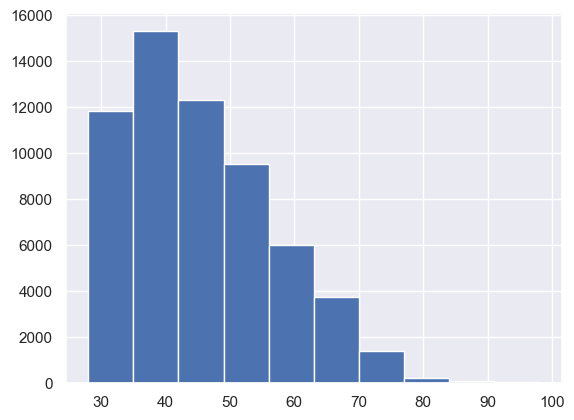

In [19]:
# A histogram representation that shows the distribution of age

df['Age'].hist()

<Axes: >

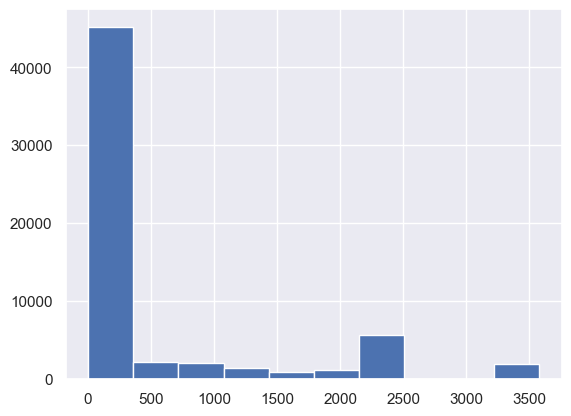

In [20]:
## histogram providing a visual representation of how SalesAmount distribution.

df['SalesAmount'].hist()

<Axes: >

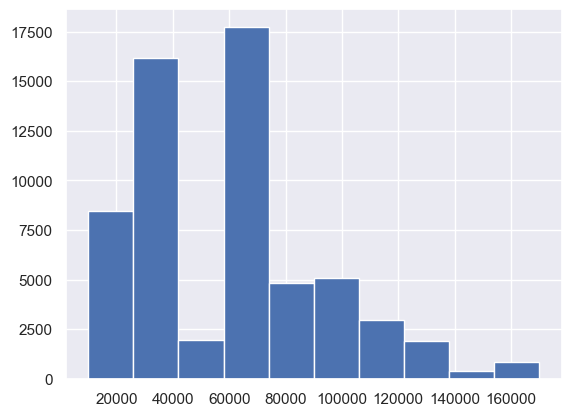

In [21]:
# the distribution of YearlyIncome:

df['YearlyIncome'].hist()

In [22]:
# Function to Detect Missing Values in the dataset

missingValFinder(df)

['CustomerKey has no missing records',
 'SalesOrderNumber has no missing records',
 'YearlyIncome has no missing records',
 'Age has no missing records',
 'MaritalStatus has no missing records',
 'Gender has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Income Segment has no missing records',
 'TotalChildren has no missing records',
 'Age Group has 40 missing records',
 'NumberChildrenAtHome has no missing records',
 'SalesAmount has no missing records',
 'OrderDate has no missing records',
 'OrderQuantity has no missing records']

In [23]:
## Summary of statistics for categorical columns in a DataFrame

df.describe(include=object)

,SalesOrderNumber,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group
count,60398,60398,60398,60398,60398,60398,60398,60358
unique,27659,2,2,5,5,3,3,7
top,SO58845,M,M,Bachelors,Professional,Mid Income,1-2 kids,31-40
freq,8,33273,30381,18144,18995,27683,23846,21239


In [24]:
#### To handle the missing values in the Age Group column, we will be replacing them with the mode (most frequently occurring value)

# Calculate the mode of the 'Age Group' column
mode_value = df['Age Group'].mode()[0]
print("\nMode of 'Age Group' column:", mode_value)

# Replace missing values with the mode
# df['Age Group'].fillna(mode_value, inplace=True)

df.fillna({'Age Group': '31-40'}, inplace=True)

# Display the updated DataFrame
print(df)


Mode of 'Age Group' column: 31-40
       CustomerKey SalesOrderNumber  YearlyIncome  Age MaritalStatus Gender  \
0            11000          SO43793       90000.0   43             M      M   
1            11000          SO51522       90000.0   43             M      M   
2            11000          SO51522       90000.0   43             M      M   
3            11000          SO57418       90000.0   43             M      M   
4            11000          SO57418       90000.0   43             M      M   
...            ...              ...           ...  ...           ...    ...   
60393        29480          SO62341       30000.0   37             S      F   
60394        29480          SO62341       30000.0   37             S      F   
60395        29481          SO45427       30000.0   49             S      M   
60396        29482          SO49746       30000.0   50             M      M   
60397        29483          SO49665       30000.0   49             M      M   

             Edu

In [25]:
## checking again to ensure there are no missing values in the Age Group column.

missingValFinder(df)

['CustomerKey has no missing records',
 'SalesOrderNumber has no missing records',
 'YearlyIncome has no missing records',
 'Age has no missing records',
 'MaritalStatus has no missing records',
 'Gender has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Income Segment has no missing records',
 'TotalChildren has no missing records',
 'Age Group has no missing records',
 'NumberChildrenAtHome has no missing records',
 'SalesAmount has no missing records',
 'OrderDate has no missing records',
 'OrderQuantity has no missing records']

In [26]:
#creating a list of categorical columns from the DataFrame

#create a list of categorical columns
cat_cols = [i for i in df.columns if df[i].dtype==object]


## displaying the name of each column and its value counts in a DataFrame.

for i in cat_cols:
	print('Column Name: ', i)
	print(df[i].value_counts())
	print('--------------------')

Column Name:  SalesOrderNumber
SalesOrderNumber
SO58845    8
SO70714    8
SO72656    8
SO74869    7
SO61412    7
          ..
SO70429    1
SO60790    1
SO72021    1
SO58440    1
SO49665    1
Name: count, Length: 27659, dtype: int64
--------------------
Column Name:  MaritalStatus
MaritalStatus
M    33273
S    27125
Name: count, dtype: int64
--------------------
Column Name:  Gender
Gender
M    30381
F    30017
Name: count, dtype: int64
--------------------
Column Name:  Education
Education
Bachelors              18144
Partial College        16623
Graduate Degree        10603
High School            10320
Partial High School     4708
Name: count, dtype: int64
--------------------
Column Name:  Occupation
Occupation
Professional      18995
Skilled Manual    14261
Management        10594
Clerical           9624
Manual             6924
Name: count, dtype: int64
--------------------
Column Name:  Income Segment
Income Segment
Mid Income     27683
Low Income     26632
High Income     6083
Nam

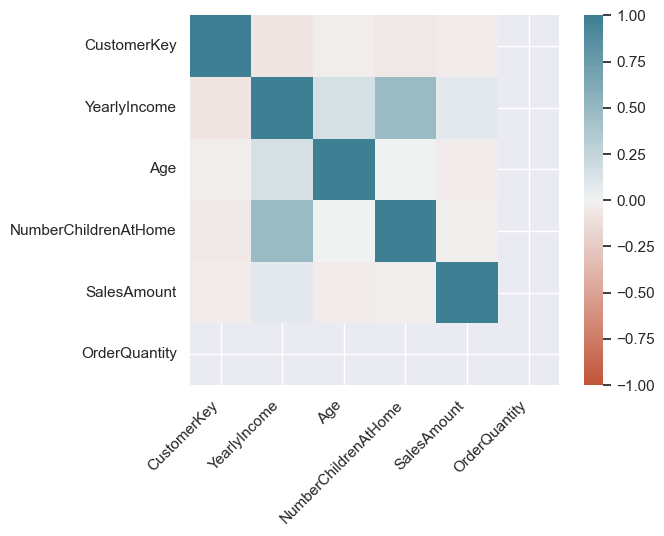

In [27]:
## Computing and visualizing the correlation matrix of numerical features in a DataFrame using a heatmap

# Calculating the Correlation Matrix for Feature Relationships:

corr = df.select_dtypes(include=np.number).corr() # correlation values in our imported data

# Generate a heatmap for Feature Correlation:
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

# Adding labelling to the chart
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [28]:
# looking at the  of the dataset

df.head()

,CustomerKey,SalesOrderNumber,YearlyIncome,Age,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,NumberChildrenAtHome,SalesAmount,OrderDate,OrderQuantity
0,11000,SO43793,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,3399.99,2011-01-19,1
1,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2319.99,2013-01-18,1
2,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,21.98,2013-01-18,1
3,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2384.07,2013-05-03,1
4,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,28.99,2013-05-03,1


#### EDA to Profile Churners Using Demographic, Transactional, and Attitudinal Data
the dataset lacks a natural target or label, a synthetic target can be created based on defined business logic. Here, churn is defined as no transactions made within 8 months prior to the last recorded order date.

In [29]:
# Remove duplicates based on all columns
df = df.drop_duplicates()
df.shape

(59990, 15)

In [30]:
## To find the last date in the OrderDate column of the dataframe
max_date = df['OrderDate'].max()

max_date

Timestamp('2014-01-28 00:00:00')

In [31]:
## To find the earliest date in the OrderDate column of the dataframe

df['OrderDate'].min()

Timestamp('2010-12-29 00:00:00')

In [32]:
## We will calculate the churnFlag based on the 8th month before the last order date (2013-05-28 00:00:00).

# String to be converted
date_string = '2013-05-28 00:00:00'

# Convert string to datetime object
churn_date = datetime.strptime(date_string, '%Y-%m-%d %H:%M:%S')

In [33]:
## calculating the number of days between the max_date (last transaction date in the dataset) and the churn_date (the cutoff date defined as 8 months before the max_date).

(max_date - churn_date).days 

245

In [34]:
## To determine the churnFlag, any customer who has not placed an order after the date 2013-05-28 00:00:00 is considered to have churned.
## Specifically, if the difference between a customer's last order date and the maximum date in the dataset exceeds the 
## difference between the maximum date in the dataset and the defined churn date (2013-05-28 00:00:00), the customer is flagged as churned (1). Otherwise, they are not churned (0).

df["ChurnFlag"] = df['OrderDate'].map(lambda orderdate: 1 if (max_date - orderdate).days > (max_date - churn_date).days else 0)
df.head()

,CustomerKey,SalesOrderNumber,YearlyIncome,Age,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,NumberChildrenAtHome,SalesAmount,OrderDate,OrderQuantity,ChurnFlag
0,11000,SO43793,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,3399.99,2011-01-19,1,1
1,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2319.99,2013-01-18,1,1
2,11000,SO51522,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,21.98,2013-01-18,1,1
3,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,2384.07,2013-05-03,1,1
4,11000,SO57418,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,0,28.99,2013-05-03,1,1


In [35]:
# calculates the total number of customers who have churned.

df['ChurnFlag'].sum()

22423

In [36]:
# Computing the churn rate using a simple calculation:

total_customers_beginning = len(df)
churned_customers = df['ChurnFlag'].sum()  # Since customers who churned is represented with 1
simple_churn_rate = (churned_customers / total_customers_beginning) * 100

print(f'The percentage of customers who have churned is {simple_churn_rate}')

The percentage of customers who have churned is 37.37789631605268


### Exploratory Data Analysis (EDA) for the Age Group. 
##### In this section, we will perform an exploratory data analysis (EDA) to gain insights into the Age Group column:

##### Distribution of Age Groups: We will visualize how customers are distributed across different age groups.
##### Churn Analysis by Age Group: We'll investigate the churn rates within each age group to identify patterns or trends in customer behavior based on age.
##### Comparing Churn Rates: We will compare the churn rates across age groups to determine which group has the highest and lowest churn.
##### This will help us understand how age might influence customer retention and churn patterns.

In [37]:
# # now drop the OrderDate column
# df.drop("OrderDate", axis = 1, inplace = True)
# df.head() # check

In [38]:
# To identify the age group with the highest churn.

churn_agegroup = df.groupby('Age Group')['ChurnFlag'].sum()
churn_agegroup

Age Group
21-30    1385
31-40    8046
41-50    6461
51-60    4003
61-70    2061
71-80     432
81-90      35
Name: ChurnFlag, dtype: int64

In [39]:
# Using the Age Group column, we aim to determine which age group has the highest and lowest churn.

highest_churn = churn_agegroup.idxmax() # the index with the highest (max)
 
lowest_churn = churn_agegroup.idxmin() # the index with the lowest (min)
 
print(f'The age group with the highest churn is {highest_churn} \nThe age group with the lowest churn is {lowest_churn}')

The age group with the highest churn is 31-40 
The age group with the lowest churn is 81-90


C:\Users\iife\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\iife\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Text(0.5, 1.0, 'Churn')

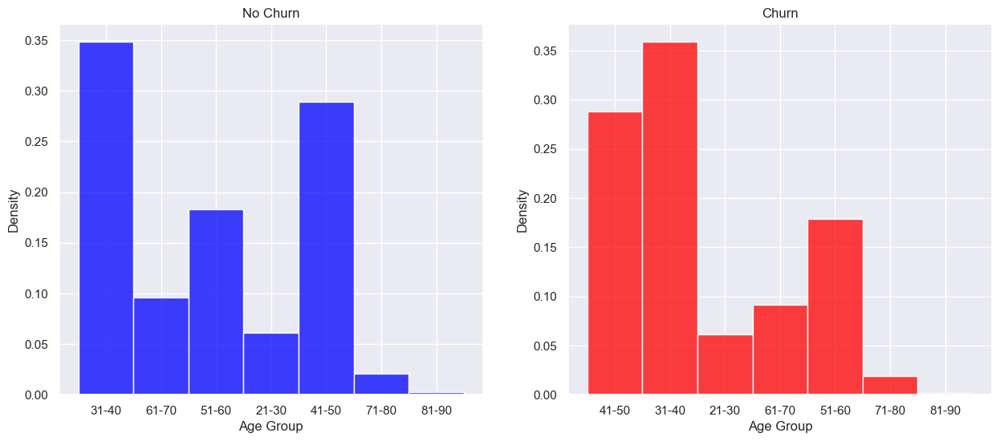

In [40]:
## Identifying the Age Group with the Highest Churn
## The following plots display the distribution of age groups among customers who have not churned (ChurnFlag = 0) and those who have churned (ChurnFlag = 1).

## Left Plot: Shows the density distribution of age groups for customers who have not churned (in blue).
## Right Plot: Shows the density distribution of age groups for customers who have churned (in red).
## This visualization helps us identify which age group is most likely to churn.

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Plotting the histogram for our no Churn (represented by 0)
ax1 = sns.histplot(x='Age Group', data=df[df['ChurnFlag'] == 0],
                  stat='density', ax=ax1, color='blue') 

# Plotting the histogram for Churn (represented by 1)
ax2 = sns.histplot(x='Age Group', data=df[df['ChurnFlag'] == 1],
                  stat='density',  ax=ax2, color='red') 

ax1.set_title('No Churn')
ax2.set_title('Churn')

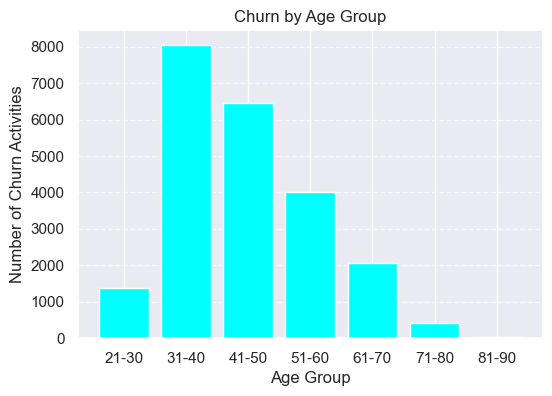

In [41]:
# Visualizing Churn by Age Group Using a Barchart.
# The following bar chart represents the number of churn activities for each age group:
# It provides a clear view of which age group has the most and least churn, helping identify trends across age groups.
 
plt.figure(figsize=(6, 4))
plt.bar(churn_agegroup.index, churn_agegroup.values, color='cyan')
plt.xlabel('Age Group')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Age Group')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Analyzing Customer Behavior by Income Segment

##### In this section, we will perform an Exploratory Data Analysis (EDA) on the Income Segment column to gain insights into the distribution and characteristics of customers based on their income groups:

##### Distribution of Income Segments: We will explore how customers are distributed across different income segments to understand the general spread of income groups.

##### Churn Analysis by Income Segment: We will investigate churn rates within each income segment to see if income influences customer retention or the likelihood of churn.

##### Comparing Churn Rates: We will compare the churn rates across different income segments to identify which income group has the highest and lowest churn.

##### This analysis helps us understand whether income plays a significant role in customer behavior and churn patterns.

In [42]:
## Identifying the Income Segment with the Most Churn

churn_Income_Segment = df.groupby('Income Segment')['ChurnFlag'].sum()
churn_Income_Segment

Income Segment
High Income     2309
Low Income      9839
Mid Income     10275
Name: ChurnFlag, dtype: int64

In [43]:
# Using the Income Segment column, we aim to determine which income segment has the highest and lowest churn.

highest_churn_income = churn_Income_Segment.idxmax()  # the index with the highest (max)

lowest_churn_income = churn_Income_Segment.idxmin()  # the index with the lowest (min)

print(f'The income segment with the highest churn is {highest_churn_income} \nThe income segment with the lowest churn is {lowest_churn_income}')

The income segment with the highest churn is Mid Income 
The income segment with the lowest churn is High Income


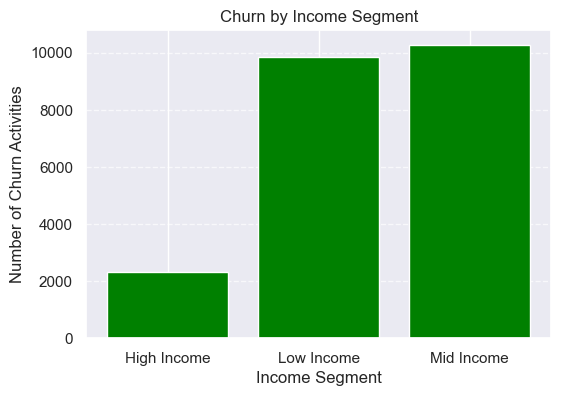

In [44]:
# The chart allowing us to explore how churn varies across income segments and identify trends.
# Barchart representation - matplotlib
 
plt.figure(figsize=(6, 4))
plt.bar(churn_Income_Segment.index, churn_Income_Segment.values, color='green')
plt.xlabel('Income Segment')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Income Segment')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Exploring the Impact of Total Children on Customer Behavior
##### In this section, we will perform an Exploratory Data Analysis (EDA) on the Total Children column to understand its effect on customer behavior:

##### Distribution of Total Children: Analyze how the total number of children is spread across the dataset.

##### Churn Analysis by Total Children: Examine how the presence of children correlates with churn behavior.

##### Churn Rate Comparison: Compare churn rates for customers with different numbers of children to uncover any significant trends.

##### This analysis will help determine if the number of children plays a role in customer retention and churn.

In [45]:
# Grouping by TotalChildren and calculating the churn sum for each group
churn_TotalChildren = df.groupby('TotalChildren')['ChurnFlag'].sum()

# Displaying the churn data by TotalChildren
churn_TotalChildren

TotalChildren
1-2 kids    9046
3-5 kids    6918
No kids     6459
Name: ChurnFlag, dtype: int64

In [46]:
# Grouping by TotalChildren and calculating the churn sum for each group
churn_by_total_children = df.groupby('TotalChildren')['ChurnFlag'].sum()

# Finding the TotalChildren category with the highest churn
highest_churn_children = churn_by_total_children.idxmax()  # the index with the highest (max)

# Finding the TotalChildren category with the lowest churn
lowest_churn_children = churn_by_total_children.idxmin()  # the index with the lowest (min)

# Displaying the results
print(f'The TotalChildren category with the highest churn rate is {highest_churn_children}.')
print(f'The TotalChildren category with the lowest churn rate is {lowest_churn_children}.')

The TotalChildren category with the highest churn rate is 1-2 kids.
The TotalChildren category with the lowest churn rate is No kids.


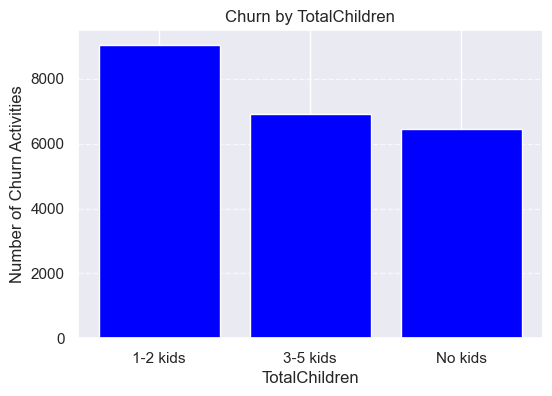

In [47]:
# Visualizing Churn Distribution by Total Children
# Bar Chart representation

plt.figure(figsize=(6, 4)) 
plt.bar(churn_TotalChildren.index, churn_TotalChildren.values, color='blue')
plt.xlabel('TotalChildren')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by TotalChildren')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Analyzing Churn Across Education Levels
##### In this section, we do an exploratory analysis on how education level impacts churn and customer behavior, including:

##### Education Level Distribution: Understanding the spread of customers across education levels.

##### Churn Analysis by Education Level: Investigating if churn rates differ among education groups.

##### Comparing Churn Rates: Identifying patterns in churn based on education levels.

In [48]:
# Identifying Education Levels with the Highest Churn

# Grouping by Education and calculating the churn sum for each group
churn_Education = df.groupby('Education')['ChurnFlag'].sum()

# Display the churn data by Education
churn_Education

Education
Bachelors              6849
Graduate Degree        4092
High School            3747
Partial College        6013
Partial High School    1722
Name: ChurnFlag, dtype: int64

In [49]:
# while using our Education column, we want to know the Education per customer that has the least and the most Churn

# Grouping by Education and calculating the churn sum for each group
highest_churn = churn_Education.idxmax() # the index with the highest (max)

# Finding the Education level with the lowest churn
lowest_churn = churn_Education.idxmin() # the index with the lowest (min)

# Displaying the results
print(f'The highest churn by Education of customer is {highest_churn} \nWhile the lowest churn by Education of customer is {lowest_churn}')

The highest churn by Education of customer is Bachelors 
While the lowest churn by Education of customer is Partial High School


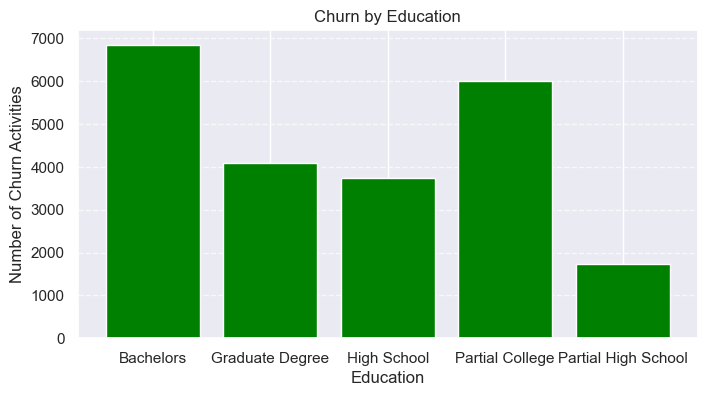

In [50]:
# Visualizing Churn Distribution by Education Level
# Bar chart representation - Matplotlib

plt.figure(figsize=(8, 4))
plt.bar(churn_Education.index, churn_Education.values, color='green')
plt.xlabel('Education')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Education')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Exploring Churn Patterns Across Genders
##### In this section, we will perform an Exploratory Data Analysis (EDA) on the Gender column to analyze how gender may impact churn:

##### Gender Distribution: Assess how customers are distributed across different gender categories.

##### Churn Analysis by Gender: Examine whether churn rates vary between genders.

##### Churn Rate Comparison: Compare churn rates for different genders to identify any significant patterns.

##### This analysis will help us understand if gender influences customer retention and churn behavior.

In [51]:
# To identify the gender with the most churn

# Grouping by Gender and calculating the churn sum for each group
churn_Gender = df.groupby('Gender')['ChurnFlag'].sum()

# Display the churn data by Gender
churn_Gender

Gender
F    11175
M    11248
Name: ChurnFlag, dtype: int64

In [52]:
## displaying the gender categories with the highest and lowest churn rates.

# Grouping by Gender and calculating the churn sum for each group
churn_by_gender = df.groupby('Gender')['ChurnFlag'].sum()

# Finding the gender with the highest churn
highest_churn_gender = churn_by_gender.idxmax()  # the index with the highest churn

# Finding the gender with the lowest churn
lowest_churn_gender = churn_by_gender.idxmin()  # the index with the lowest churn

# Displaying the results
print(f'The gender with the highest churn rate is {highest_churn_gender}.')
print(f'The gender with the lowest churn rate is {lowest_churn_gender}.')

The gender with the highest churn rate is M.
The gender with the lowest churn rate is F.


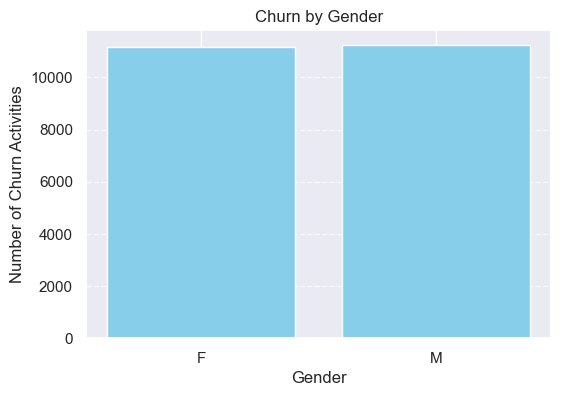

In [53]:
# Visualizing Churn Distribution by Gender
# Bar chart representation

plt.figure(figsize=(6, 4))
plt.bar(churn_Gender.index, churn_Gender.values, color='skyblue') 
plt.xlabel('Gender')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Gender')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Occupation and Its Impact on Customer Churn
##### In this section, we will explore how occupation influences churn behavior, focusing on:

##### Occupation Distribution: Understanding how customers are distributed across different occupations.

##### Churn Analysis by Occupation: Investigating if churn rates vary between different occupation categories.

##### Comparing Churn Rates: Identifying which occupation groups exhibit higher or lower churn rates.

##### This analysis will reveal if occupation impacts churn and highlight which occupations have higher retention or churn rates.

In [54]:
## Identifying Occupations with the Highest Churn

# Grouping by Occupation and calculating the churn sum for each group
churn_Occupation = df.groupby('Occupation')['ChurnFlag'].sum()

# Display the churn data by Occupation
print(churn_Occupation)

Occupation
Clerical          3596
Management        3952
Manual            2484
Professional      6945
Skilled Manual    5446
Name: ChurnFlag, dtype: int64


In [55]:
# Analyzing Occupations with the Most and Least Churn

# Grouping by Occupation and calculating the churn sum for each group
churn_Occupation = df.groupby('Occupation')['ChurnFlag'].sum()

# Finding the occupation with the highest churn
highest_churn = churn_Occupation.idxmax()  # the occupation with the highest churn

# Finding the occupation with the lowest churn
lowest_churn = churn_Occupation.idxmin()  # the occupation with the lowest churn

# Displaying the results
print(f'The occupation with the highest churn is {highest_churn}.')
print(f'While the occupation with the lowest churn is {lowest_churn}.')

The occupation with the highest churn is Professional.
While the occupation with the lowest churn is Manual.


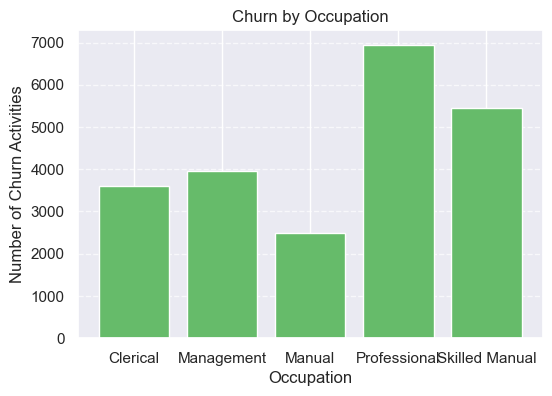

In [56]:
# Visualizing Churn Distribution by Occupation
# Bar chart representation - Matplotlib

plt.figure(figsize=(6, 4))
plt.bar(churn_Occupation.index, churn_Occupation.values, color='#66BB6A')  # A different shade of green
plt.xlabel('Occupation')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by Occupation')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### Examining Churn Across Different Marital Statuses
##### This section will explore how marital status relates to customer churn and behavior, including:

##### Distribution of Marital Status: Understanding the spread of customers across marital status categories.

##### Churn Analysis by Marital Status: Analyzing churn patterns based on marital status.

##### Comparing Churn Rates: Looking at how churn rates differ between various marital status groups.

In [57]:
# To determine the MaritalStatus with the most churn,

churn_MaritalStatus = df.groupby('MaritalStatus')['ChurnFlag'].sum()
churn_MaritalStatus

MaritalStatus
M    12168
S    10255
Name: ChurnFlag, dtype: int64

In [58]:
## To analyze the MaritalStatus column, we aim to identify the marital status category with the highest and lowest churn rates per customer.

# Grouping by MaritalStatus and calculating the churn sum for each group
churn_MaritalStatus = df.groupby('MaritalStatus')['ChurnFlag'].sum()

# Finding the marital status with the highest churn
highest_churn = churn_MaritalStatus.idxmax()  # the index with the highest churn

# Finding the marital status with the lowest churn
lowest_churn = churn_MaritalStatus.idxmin()  # the index with the lowest churn

# Displaying the results
print(f'The highest churn by Marital status of customer is {highest_churn}')
print(f'The lowest churn by Marital status of customer is {lowest_churn}')

The highest churn by Marital status of customer is M
The lowest churn by Marital status of customer is S


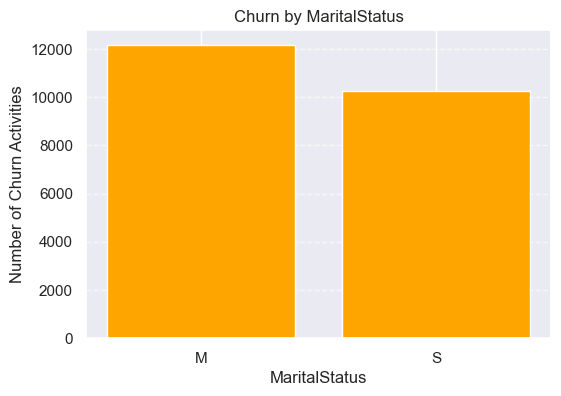

In [59]:
# Visualizing Churn Distribution by Education Level
# Bar chart representation - Matplotlib

plt.figure(figsize=(6, 4))
plt.bar(churn_MaritalStatus.index, churn_MaritalStatus.values, color='orange')  # Color set to orange
plt.xlabel('MaritalStatus')
plt.ylabel('Number of Churn Activities')
plt.title('Churn by MaritalStatus')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

### RFM Analysis (Recency, Frequency, Monetary)
##### RFM analysis is a method used to segment customers based on their purchasing behavior. It evaluates three key metrics:

##### Recency (R): Measures how recently a customer made a purchase. Recent customers are more likely to engage.
##### Frequency (F): Measures how often a customer makes a purchase. Frequent buyers are typically more loyal.
#### Monetary (M): Measures how much money a customer spends. High spenders are often more valuable.


#### Steps in RFM Analysis:
##### Data Preparation: Extract data on customer transactions (e.g., date of purchase, total spend).
##### Scoring: Assign scores (usually from 1 to 5) based on Recency, Frequency, and Monetary values.
##### Segmentation: Group customers into segments (e.g., High Value, Low Value) based on their scores.


#### Benefits:
##### Helps identify high-value customers.
##### Targets at-risk customers who may churn.
##### Improves marketing strategies by focusing on the right segments.
##### By applying RFM analysis, businesses can effectively improve customer retention, optimize marketing efforts, and drive sales growth.

In [60]:
## Preparing Data for RFM Analysis

## display the needed columns of the DataFrame. 
df_rfm = df[['CustomerKey','SalesOrderNumber','OrderDate', 'SalesAmount']]

## result
df_rfm.head()

,CustomerKey,SalesOrderNumber,OrderDate,SalesAmount
0,11000,SO43793,2011-01-19,3399.99
1,11000,SO51522,2013-01-18,2319.99
2,11000,SO51522,2013-01-18,21.98
3,11000,SO57418,2013-05-03,2384.07
4,11000,SO57418,2013-05-03,28.99


In [61]:
# To know our earliest and latest date in our dataset

df_rfm['OrderDate'].min(),df_rfm['OrderDate'].max()

(Timestamp('2010-12-29 00:00:00'), Timestamp('2014-01-28 00:00:00'))

In [62]:
## Defining the Present Date and Converting Order Date to Datetime Format

# Converting String to Datetime for Present Date
present_date_string = '2014-01-29 00:00:00'

# Setting the Present Date and Converting Order Date to Datetime Format
PRESENT = datetime.strptime(present_date_string, '%Y-%m-%d %H:%M:%S')

# Transforming 'OrderDate' to Datetime Format
df_rfm['OrderDate'] = pd.to_datetime(df_rfm['OrderDate'])

## output
df_rfm.head()

C:\Users\iife\AppData\Local\Temp\ipykernel_8904\616650573.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rfm['OrderDate'] = pd.to_datetime(df_rfm['OrderDate'])


,CustomerKey,SalesOrderNumber,OrderDate,SalesAmount
0,11000,SO43793,2011-01-19,3399.99
1,11000,SO51522,2013-01-18,2319.99
2,11000,SO51522,2013-01-18,21.98
3,11000,SO57418,2013-05-03,2384.07
4,11000,SO57418,2013-05-03,28.99


In [63]:
## Calculating RFM Metrics for Each Customer

rfm= df_rfm.groupby('CustomerKey').agg({'OrderDate': lambda date: (PRESENT - date.max()).days,
                                        'SalesOrderNumber': lambda num: len(num),
                                        'SalesAmount': lambda price: price.sum()})

In [64]:
## returning the columns representing the aggregated RFM metrics for each customer:

rfm.columns

Index(['OrderDate', 'SalesOrderNumber', 'SalesAmount'], dtype='object')

In [65]:
# Transforming the name of columns 

rfm.columns=['recency', 'frequency', 'monetary'] 

In [66]:
rfm.head()

,recency,frequency,monetary
CustomerKey,,,
11000,271,8,8248.99
11001,50,11,6383.88
11002,340,4,8114.04
11003,264,9,8139.29
11004,273,6,8196.01


#### Calculating RFM Quantiles for Customer Segmentation
To identify top customers, we calculate the quantiles of RFM values, with customers having the lowest recency, highest frequency, and highest monetary values considered as top customers.

The qcut() function is used for quantile-based discretization. It divides the data into bins based on sample quantiles. For example, applying qcut to 1000 values with 4 quantiles would create a categorical object indicating the quantile membership for each customer.

In [67]:
## Assigning RFM Quantiles to Each Customer

rfm['r_quartile'] = pd.qcut(rfm['recency'], 4, ['1','2','3','4'])
rfm['f_quartile'] = pd.qcut(rfm['frequency'], 4, ['4','3','2','1'])
rfm['m_quartile'] = pd.qcut(rfm['monetary'], 4, ['4','3','2','1'])

In [68]:
## function displays the first 10 rows of the RFM DataFrame, showing RFM metrics and assigned quartiles for each customer.

rfm.head(10)

,recency,frequency,monetary,r_quartile,f_quartile,m_quartile
CustomerKey,,,,,,
11000,271,8,8248.99,4,1,1
11001,50,11,6383.88,1,1,1
11002,340,4,8114.04,4,2,1
11003,264,9,8139.29,3,1,1
11004,273,6,8196.01,4,1,1
11005,272,6,8121.33,4,1,1
11006,260,5,8119.03,3,1,1
11007,316,8,8211.00,4,1,1
11008,333,7,8106.31,4,1,1


In [69]:
### creating an RFM_Score by combining the recency, frequency, and monetary quartile values for each customer

rfm['RFM_Score'] = rfm.r_quartile.astype(str)+ rfm.f_quartile.astype(str) + rfm.m_quartile.astype(str)
rfm.head()

,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score
CustomerKey,,,,,,,
11000,271,8,8248.99,4,1,1,411
11001,50,11,6383.88,1,1,1,111
11002,340,4,8114.04,4,2,1,421
11003,264,9,8139.29,3,1,1,311
11004,273,6,8196.01,4,1,1,411


In [70]:
## Identifying best customers based on the RFM metrics.

# Sorting the customers by their 'RFM_Score' in descending order (highest RFM score first)
rfm_sorted = rfm.sort_values(by='RFM_Score', ascending=False)

# Displaying the top 5 customers with the highest RFM score
rfm_sorted.head()

,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score
CustomerKey,,,,,,,
15476,363,2,7.28,4,4,4,444
13610,314,2,44.98,4,4,4,444
22265,325,1,21.98,4,4,4,444
13596,353,1,9.99,4,4,4,444
22244,299,1,29.99,4,4,4,444


In [71]:
## Arranging Customers by Highest Monetary Value

# Sorting the customers by their 'monetary' value (highest monetary value first)
rfm_sorted = rfm.sort_values(by='monetary', ascending=False)

# Displaying the top 5 customers with the highest monetary value
rfm_sorted.head()

,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score
CustomerKey,,,,,,,
12301,70,13,13295.38,1,1,1,111
12132,104,14,13294.27,2,1,1,211
12308,71,14,13269.27,1,1,1,111
12131,111,11,13265.99,2,1,1,211
12300,104,10,13242.70,2,1,1,211


In [72]:
# Outputting the best customers who have the highest frequency, highest monetary value, and the most recent purchases

## Identifying the Best Customers Based on RFM Quartiles
best_customers = rfm[(rfm['r_quartile'] == '1') & (rfm['f_quartile'] == '4') & (rfm['m_quartile'] == '4')]

## display
best_customers.head()

,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score
CustomerKey,,,,,,,
11130,51,2,37.29,1,4,4,144
11209,7,2,37.29,1,4,4,144
11354,57,2,13.98,1,4,4,144
11418,43,2,39.98,1,4,4,144
11435,25,1,34.99,1,4,4,144


In [73]:
%matplotlib inline
# plots charts inline as we run the code

plt.rcParams['figure.figsize'] = (10, 7) # inches
plt.style.use('ggplot') # formatting borrowed from the R programming language

In [74]:
## Extracting Relevant Features for Clustering (RFM Data)

# rfm contains the data with recency, frequency, and monetary columns
rfm_data = rfm[['recency', 'frequency', 'monetary']]  # Extract relevant columns

rfm_data.head()

,recency,frequency,monetary
CustomerKey,,,
11000,271,8,8248.99
11001,50,11,6383.88
11002,340,4,8114.04
11003,264,9,8139.29
11004,273,6,8196.01


In [75]:
X = rfm_data.values # big "X" as our features
#NB this needs to be dataset.values as we apply a numpy technique below

In [76]:
#Using the elbow method to find the optimum number of clusters



wcss = [] # within cluster sum of squares WE WANT TO MINIMISE THIS

# for k = 1 to 10
for i in range(1,11):
    # defining the Unsupervised model (KMeans) with i clusters
    # n-init is like K-Folds CV - will randomly assign cluster centres (centroids) 10*
    km=KMeans(n_clusters=i,init='k-means++', max_iter=300, n_init=10, random_state=0)
    km.fit(X) # fit the model to our data X
    wcss.append(km.inertia_) # gather up the calculated within cluster sum of squares

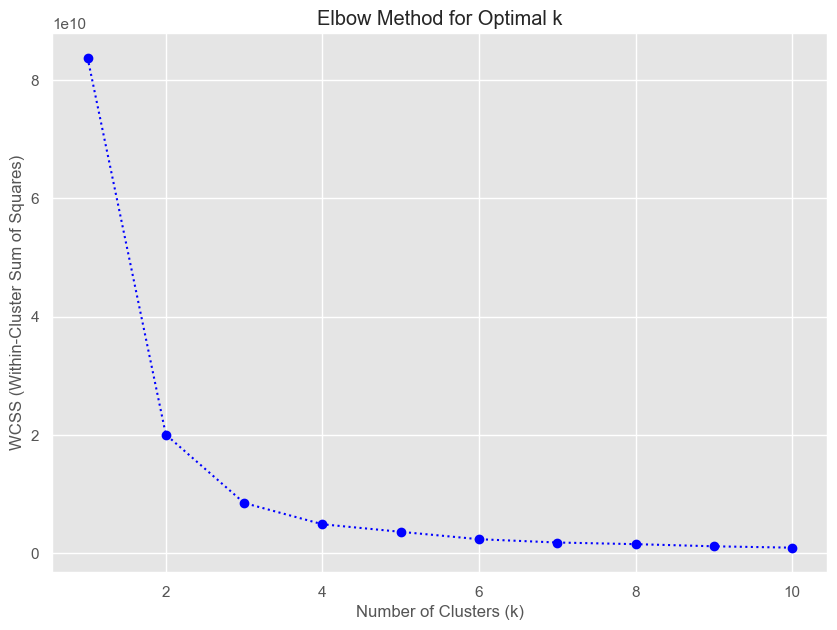

In [77]:
## Elbow Method for Determining Optimal Clusters

# Plotting the variation of WCSS for k = 1 to 10
plt.plot(range(1, 11), wcss, linestyle='dotted', marker='o', color='blue')
plt.title('Elbow Method for Optimal k')  # Adding a heading
plt.xlabel('Number of Clusters (k)')  # Label for the x-axis
plt.ylabel('WCSS (Within-Cluster Sum of Squares)')  # Label for the y-axis
plt.grid(True)  # Optional: Adds a grid for better visualization
plt.show()

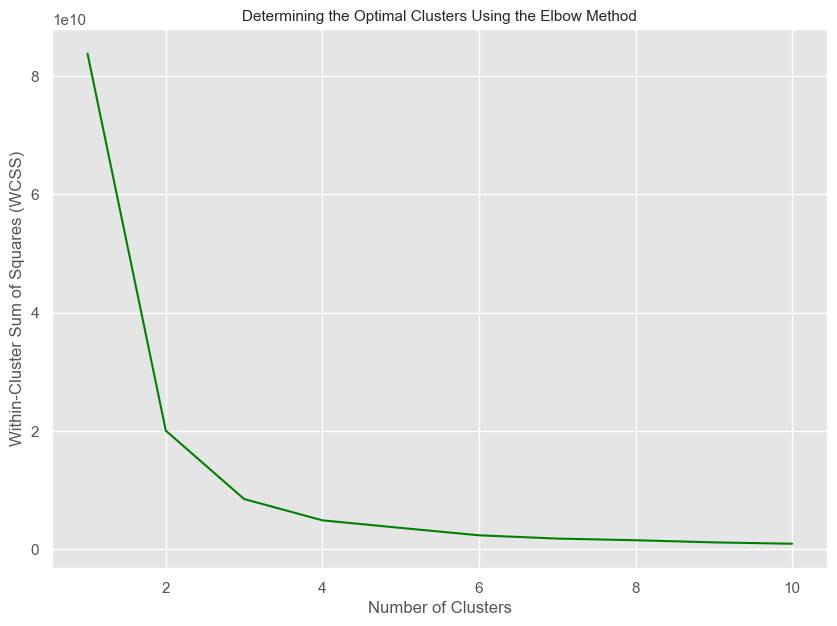

In [78]:
## Elbow Method for Optimal Number of Clusters

# Improved plot for the Elbow Method
plt.plot(range(1, 11), wcss, color='green')  # Line color set to green

plt.title("Determining the Optimal Clusters Using the Elbow Method", 
          fontdict={'fontsize': 11})  # Updated title

plt.xlabel("Number of Clusters")
plt.ylabel("Within-Cluster Sum of Squares (WCSS)")
plt.show()

We use the Elbow Method to find the optimal number of clusters for K-Means. It plots WCSS (Within-Cluster Sum of Squares) for 
𝑘
k values from 1 to 10. The "elbow" point on the plot, where WCSS decreases at a slower rate, indicates the optimal number of clusters. The plot includes:

A dotted line with markers for clarity.
Labels for the x-axis ("Number of Clusters") and y-axis ("WCSS").
A title and grid for better readability.

In [79]:
## Customer Segmentation Using K-Means Clustering on RFM Data
## fitting the model

# Step 1: Standardize the RFM Data
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm_data)

# Display the standardized RFM data
print("\nStep 1: Standardized RFM Data:")
print(rfm_scaled)

# Step 2: Perform K-Means Clustering (k=3 based on elbow plot)
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(rfm_scaled)

# Step 3: Retrieve Cluster Labels
labels = kmeans.labels_

# Display the cluster labels
print("\nStep 3: Cluster Labels Assigned by K-Means:")
print(labels)

# Step 4: Add Cluster Labels to the Original DataFrame
rfm['Cluster'] = labels

# Display the updated DataFrame with cluster labels
print("\nStep 4: DataFrame with Assigned Cluster Labels:")
print(rfm)



Step 1: Standardized RFM Data:
[[ 0.55144188  1.83271725  3.13581115]
 [-0.95931003  2.98912967  2.2577469 ]
 [ 1.02312461  0.29083401  3.07227883]
 ...
 [ 4.85127426 -0.86557841  0.84120913]
 [ 2.10320969 -0.86557841  0.21700027]
 [ 2.16473352 -0.86557841  0.21700027]]


C:\Users\iife\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Step 3: Cluster Labels Assigned by K-Means:
[0 0 0 ... 2 1 2]

Step 4: DataFrame with Assigned Cluster Labels:
             recency  frequency   monetary r_quartile f_quartile m_quartile  \
CustomerKey                                                                   
11000            271          8  8248.9900          4          1          1   
11001             50         11  6383.8800          1          1          1   
11002            340          4  8114.0400          4          2          1   
11003            264          9  8139.2900          3          1          1   
11004            273          6  8196.0100          4          1          1   
...              ...        ...        ...        ...        ...        ...   
29479            512          1  2049.0982          4          4          2   
29480            196          4  2433.0400          3          2          2   
29481            900          1  3374.9900          4          4          1   
29482            49

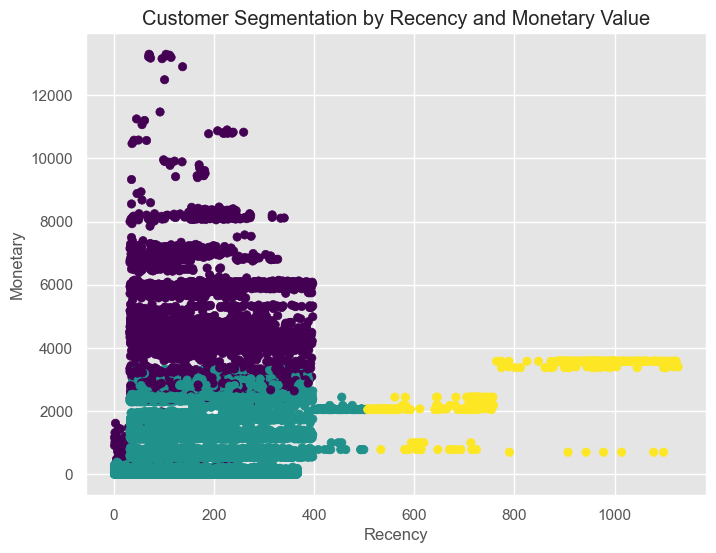

In [80]:
## Visualizing Customer Segmentation Based on Recency and Monetary Value

plt.figure(figsize=(8, 6))
plt.scatter(rfm['recency'], rfm['monetary'], c=rfm['Cluster'], cmap='viridis')
plt.xlabel('Recency')
plt.ylabel('Monetary')
plt.title('Customer Segmentation by Recency and Monetary Value')
plt.show()

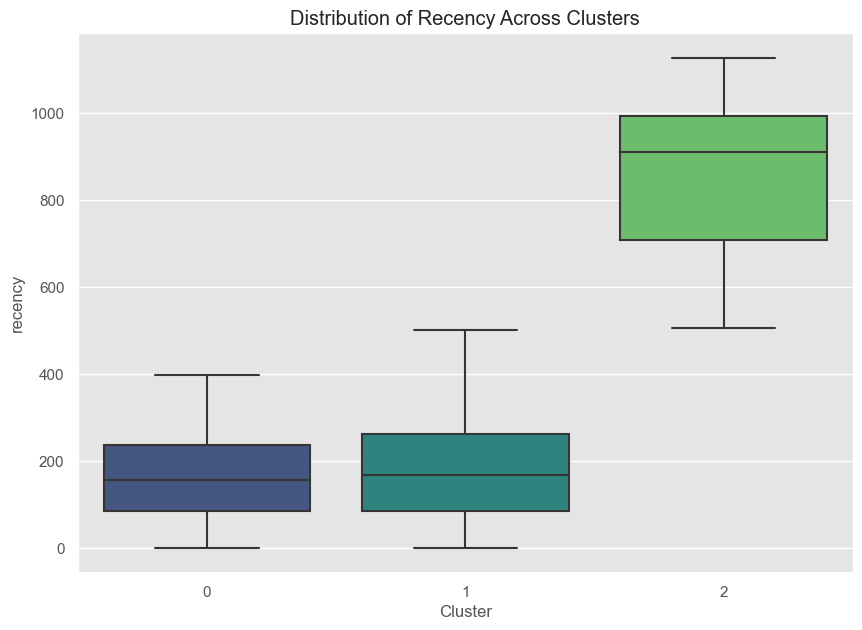

In [81]:
import seaborn as sns

# Boxplot for Recency across different clusters
sns.boxplot(x='Cluster', y='recency', data=rfm, palette='viridis')
plt.title('Distribution of Recency Across Clusters')
plt.show()

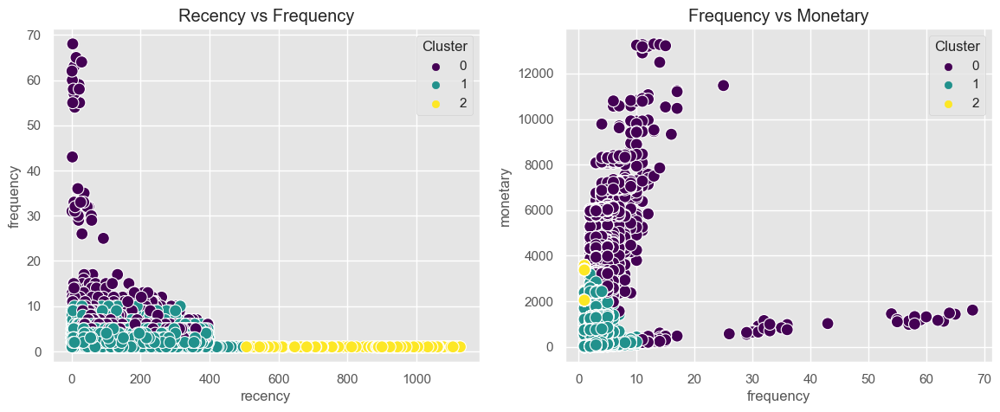

In [82]:
# 2D scatter plot for each pair of RFM (Recency, Frequency, and Monetary) scores.
## Visualize how customers are segmented based on these variables.

## Setting the figure size
plt.figure(figsize=(14, 5))

# First Plot: Recency vs Frequency:
plt.subplot(1, 2, 1)
sns.scatterplot(data=rfm, x='recency', y='frequency', hue='Cluster', palette='viridis', s=100)
plt.title('Recency vs Frequency')

# Second Plot: Frequency vs Monetary:
plt.subplot(1, 2, 2)
sns.scatterplot(data=rfm, x='frequency', y='monetary', hue='Cluster', palette='viridis', s=100)
plt.title('Frequency vs Monetary')

## Displays both plots in the same figure.
plt.show()

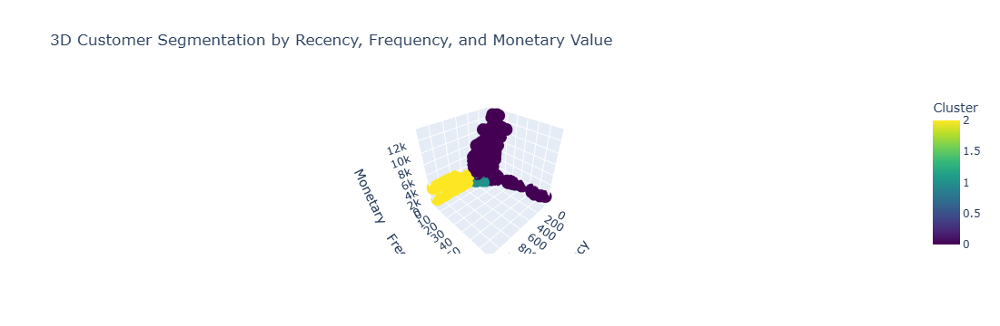

In [83]:
# 3D scatter plot visualizes the relationship between Recency, Frequency, and Monetary values in a three-dimensional space.

import plotly.express as px

# Create a 3D scatter plot using Plotly
fig = px.scatter_3d(rfm, 
                    x='recency', 
                    y='frequency', 
                    z='monetary', 
                    color='Cluster',  # Color by the cluster
                    title='3D Customer Segmentation by Recency, Frequency, and Monetary Value',
                    color_continuous_scale='viridis',  # Set color scale
                    labels={'recency': 'Recency', 'frequency': 'Frequency', 'monetary': 'Monetary', 'Cluster': 'Cluster'})

# Show the plot
fig.show()

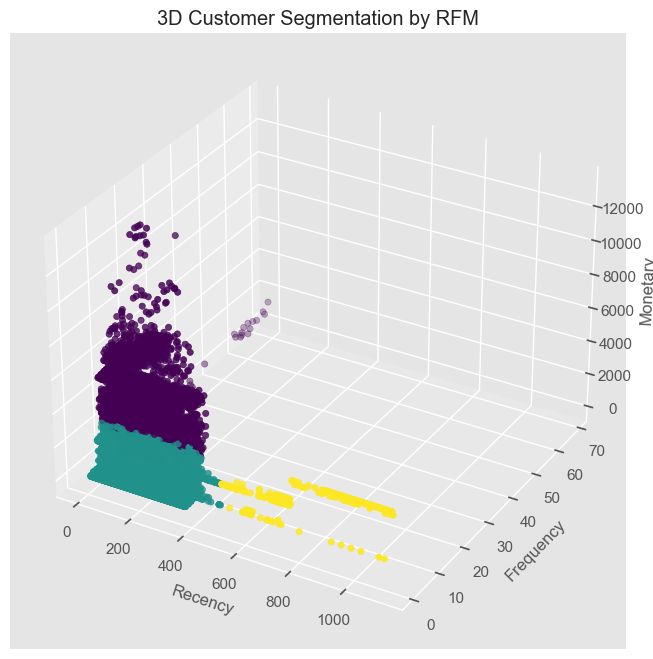

In [84]:
## A 3D scatter plot visualizing the three variables (i.e Recency, Frequency, and Monetary) simultaneously.

from mpl_toolkits.mplot3d import Axes3D

# 3D Scatter plot for Recency, Frequency, and Monetary
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(rfm['recency'], rfm['frequency'], rfm['monetary'], c=rfm['Cluster'], cmap='viridis')

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')
plt.title('3D Customer Segmentation by RFM')
plt.show()

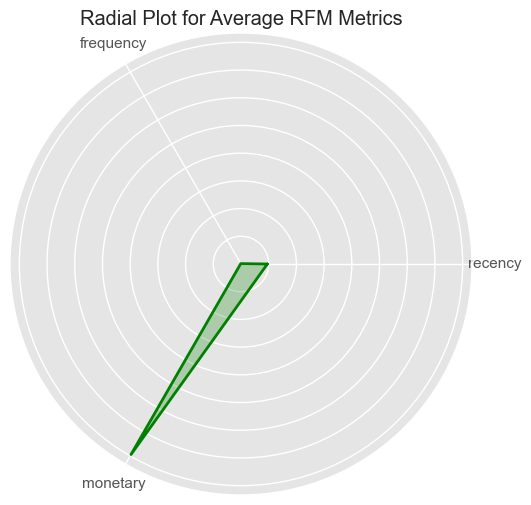

In [85]:
## A radial plot showing the profile of clusters based on Recency, Frequency, and Monetary data.
## Radial Plot (Matplotlib or Plotly)

import numpy as np
import matplotlib.pyplot as plt

# Normalize the RFM values for visualization
rfm_normalized = rfm[['recency', 'frequency', 'monetary']].mean()

# Create a radial plot for the mean of RFM
labels = rfm_normalized.index
values = rfm_normalized.values

angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
values = np.concatenate((values, [values[0]]))
angles += angles[:1]

plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)
ax.fill(angles, values, color='green', alpha=0.25)
ax.plot(angles, values, color='green', linewidth=2)

ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels)
plt.title('Radial Plot for Average RFM Metrics')
plt.show()

In [86]:
## Preparing RFM Data with Customer Key for Segmentation

# Adding Customer Key to RFM Data for Identification
new_rfm = rfm[['recency', 'frequency', 'monetary']].copy()
new_rfm['CustomerKey'] = new_rfm.index

# Creating a new column for the Customer Key
new_rfm = new_rfm.reset_index(drop=True)

# Rearranging Columns to Prioritize Customer Key in RFM Data
new_rfm = new_rfm[['CustomerKey', 'recency', 'frequency', 'monetary']]

new_rfm.head()

,CustomerKey,recency,frequency,monetary
0,11000,271,8,8248.99
1,11001,50,11,6383.88
2,11002,340,4,8114.04
3,11003,264,9,8139.29
4,11004,273,6,8196.01


In [87]:
# Ensure labels are derived from the KMeans model and match the number of rows in your DataFrame

# Get the cluster labels from the KMeans model
labels = kmeans.labels_  # Should match the length of the rows in your DataFrame

# Now assign the labels to the new_rfm DataFrame
new_rfm['Cluster'] = labels

# Display the DataFrame with cluster labels
new_rfm.head()  # View the first few rows with the added 'Cluster' column

,CustomerKey,recency,frequency,monetary,Cluster
0,11000,271,8,8248.99,0
1,11001,50,11,6383.88,0
2,11002,340,4,8114.04,0
3,11003,264,9,8139.29,0
4,11004,273,6,8196.01,0


In [88]:
new_rfm['Cluster'].value_counts()

Cluster
1    13904
0     4169
2      411
Name: count, dtype: int64

In [89]:
new_rfm.shape

(18484, 5)

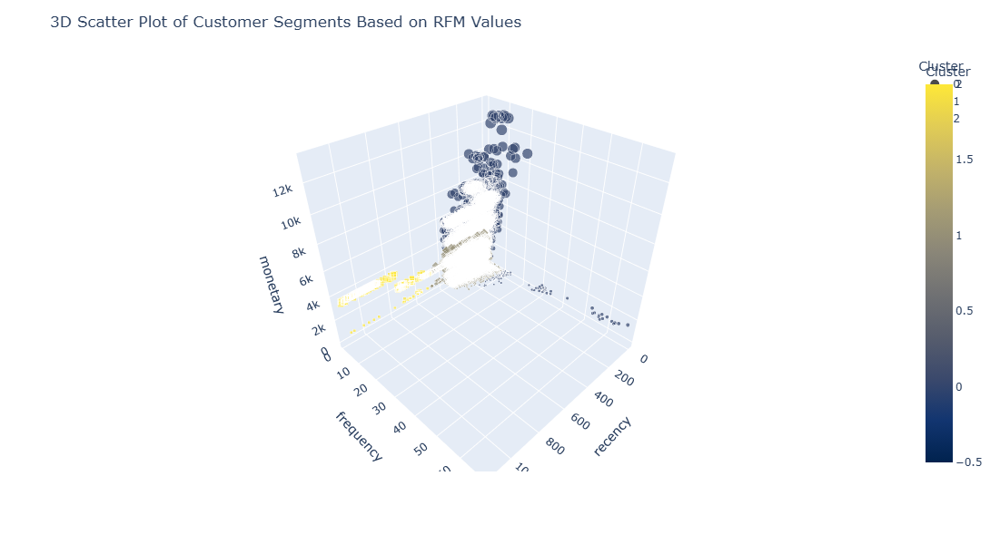

In [90]:
## 3D scatter plot using Plotly to visualize the RFM clusters

import plotly.express as px

# Create a 3D scatter plot with a custom color scale
fig = px.scatter_3d(new_rfm, 
                    x='recency', 
                    y='frequency', 
                    z='monetary', 
                    color='Cluster',        # Color by the 'Cluster' column
                    symbol='Cluster',       # Different symbols for clusters
                    size='monetary',        # Size by monetary value
                    hover_data=['CustomerKey'],  # Hover over CustomerKey for more info
                    color_continuous_scale='Cividis')  # Change the color scale to 'Cividis'

# Update the layout of the plot
fig.update_layout(title='3D Scatter Plot of Customer Segments Based on RFM Values', 
                  width=800, height=600)

# Display the plot
fig.show()


Performing Exploratory Data Analysis (EDA) on the calculated RFM (Recency, Frequency, Monetary) scores 

In [91]:
# Removing Duplicate Customer Records Based on CustomerKey from the initial dataset
df_dup= df.drop_duplicates(subset=['CustomerKey'])

df_dup.shape

(18484, 16)

In [92]:
## Comparing the Shapes of Original and Duplicate-Free Customer Data

rfm.shape, df_dup.shape

((18484, 8), (18484, 16))

In [93]:
## Resetting the Index of Customer DataFrames

rfm.reset_index(drop=True, inplace=True)
df_dup.reset_index(drop=True, inplace=True)

In [94]:
# Now we Concatenate the rfm to the initial dataset
df_rfm_eda = pd.concat([df_dup, rfm], axis=1)

df_rfm_eda.head()

,CustomerKey,SalesOrderNumber,YearlyIncome,Age,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,...,OrderQuantity,ChurnFlag,recency,frequency,monetary,r_quartile,f_quartile,m_quartile,RFM_Score,Cluster
0,11000,SO43793,90000.0,43,M,M,Bachelors,Professional,Mid Income,1-2 kids,...,1,1,271,8,8248.99,4,1,1,411,0
1,11001,SO43767,60000.0,38,S,M,Bachelors,Professional,Mid Income,3-5 kids,...,1,1,50,11,6383.88,1,1,1,111,0
2,11002,SO43736,60000.0,43,M,M,Bachelors,Professional,Mid Income,3-5 kids,...,1,1,340,4,8114.04,4,2,1,421,0
3,11003,SO43701,70000.0,41,S,F,Bachelors,Professional,Mid Income,No kids,...,1,1,264,9,8139.29,3,1,1,311,0
4,11004,SO43810,80000.0,35,S,F,Bachelors,Professional,Mid Income,3-5 kids,...,1,1,273,6,8196.01,4,1,1,411,0


In [95]:
## Dropping Irrelevant Columns for RFM EDA

## Dropping Columns to streamline the dataframe to retain only relevant columns for further analysis.
drop_columns = ['OrderQuantity','recency', 'monetary',
               'frequency', 'r_quartile','f_quartile', 'm_quartile', 
                'SalesOrderNumber', 'YearlyIncome', 'Age', 'NumberChildrenAtHome'
                
               
            ]
## Previewing the Dataframe
df_rfm_eda = df_rfm_eda.drop(drop_columns, axis = 1)

df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster
0,11000,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0
1,11001,S,M,Bachelors,Professional,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0
2,11002,M,M,Bachelors,Professional,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0
3,11003,S,F,Bachelors,Professional,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0
4,11004,S,F,Bachelors,Professional,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0


### We will be Performing Exploratory Data Analysis (EDA) on the new dataset aims to identify the customer segments contributing the most to the churn rate, which represents the rate at which customers cease doing business with AHG.

In [96]:
## ## we inspect the structure of the df_rfm_eda DataFrame
## Ensuring Numeric Format for RFM Scores and Dataset Overview

# Convert RFM_Score to Numeric
df_rfm_eda['RFM_Score'] = pd.to_numeric(df_rfm_eda['RFM_Score'])

# Inspect DataFrame Structure
df_rfm_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18484 entries, 0 to 18483
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     18484 non-null  int64         
 1   MaritalStatus   18484 non-null  object        
 2   Gender          18484 non-null  object        
 3   Education       18484 non-null  object        
 4   Occupation      18484 non-null  object        
 5   Income Segment  18484 non-null  object        
 6   TotalChildren   18484 non-null  object        
 7   Age Group       18484 non-null  object        
 8   SalesAmount     18484 non-null  float64       
 9   OrderDate       18484 non-null  datetime64[ns]
 10  ChurnFlag       18484 non-null  int64         
 11  RFM_Score       18484 non-null  int64         
 12  Cluster         18484 non-null  int32         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(3), object(7)
memory usage: 1.8+ MB


In [97]:
## Value Counts of RFM Scores

df_rfm_eda['RFM_Score'].value_counts()

RFM_Score
444    1014
344     898
244     861
144     841
442     679
       ... 
424      16
114       6
314       4
214       3
414       2
Name: count, Length: 64, dtype: int64

In [98]:
## Statistics of RFM Scores

df_rfm_eda['RFM_Score'].describe()

count    18484.000000
mean       280.913168
std        114.405638
min        111.000000
25%        144.000000
50%        244.000000
75%        344.000000
max        444.000000
Name: RFM_Score, dtype: float64

In [99]:
## Checking Unique RFM Scores

df_rfm_eda['RFM_Score'].unique()

array([411, 111, 421, 311, 321, 213, 113, 413, 432, 221, 211, 112, 442,
       313, 121, 412, 131, 231, 234, 223, 331, 124, 323, 123, 441, 144,
       233, 444, 114, 422, 324, 333, 133, 314, 334, 134, 423, 244, 431,
       224, 222, 312, 344, 433, 434, 143, 243, 443, 343, 424, 142, 341,
       212, 214, 232, 342, 241, 332, 322, 141, 122, 132, 242, 414],
      dtype=int64)

### Analyzing the Impact of Age Group and Categorical Features on Churn Based on RFM Scores

In [100]:
## Assigning Customer Categories Based on RFM Score Boundaries

# Establish RFM score boundaries for customer classification
high_risk_threshold = df_rfm_eda['RFM_Score'].quantile(0.33)
low_risk_threshold = df_rfm_eda['RFM_Score'].quantile(0.67)

# # Classify customers into distinct categories based on RFM score
def categorize_risk(rfm_score, high_risk_threshold, low_risk_threshold):
    if rfm_score <= high_risk_threshold:
        return 'High'  # 'High' risk category
    elif rfm_score <= low_risk_threshold:
        return 'Medium'  # 'Medium' risk category
    else:
        return 'Low'  # 'Low' risk category

# # Assign customer categories based on RFM score and established boundaries
df_rfm_eda['RiskCategory'] = df_rfm_eda['RFM_Score'].apply(categorize_risk, args=(high_risk_threshold, low_risk_threshold))

In [101]:
## Analyzing Churn Rate by Age Group and Customer Risk Categories Based on RFM Scores

# Create pivot table to analyze churn rate across age groups and risk categories
churn_analysis_pivot = df_rfm_eda.pivot_table(index='Age Group', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the churn analysis pivot table

print(churn_analysis_pivot)

RiskCategory Age Group      High       Low    Medium
0                21-30  0.417127  0.835979  0.447368
1                31-40  0.444184  0.851852  0.413763
2                41-50  0.426843  0.846341  0.402204
3                51-60  0.436750  0.799811  0.371117
4                61-70  0.379599  0.804538  0.330579
5                71-80  0.208333  0.763889  0.283871
6                81-90  0.166667  0.692308  0.333333


In [102]:
## # Display the first few rows of the rfm dataframe

df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory
0,11000,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0,Low
1,11001,S,M,Bachelors,Professional,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0,High
2,11002,M,M,Bachelors,Professional,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0,Low
3,11003,S,F,Bachelors,Professional,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0,Medium
4,11004,S,F,Bachelors,Professional,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0,Low


In [103]:
## Ranking Age Groups by Mean Churn Rate in the High-Risk Customer Segment

# Filter DataFrame for High-Risk Customers and Calculate Churn Rate by Age Group
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculating the Average Churn Rate by Age Group for High-Risk Customers
mean_churn_by_category = high_risk_df.groupby('Age Group')['ChurnFlag'].mean().reset_index()

# Sorting Age Groups by Churn Rate: Highest to Lowest for High-Risk Customers
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sorting Age Groups by Rank Based on Churn Rate for High-Risk Customers
mean_churn_by_category = mean_churn_by_category.sort_values('Rank', ascending=True)

# Showcasing Ranked Age Groups Based on Churn Rate in the High-Risk Segment
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate (High Risk):
  Age Group  ChurnFlag  Rank
1     31-40   0.444184   1.0
3     51-60   0.436750   2.0
2     41-50   0.426843   3.0
0     21-30   0.417127   4.0
4     61-70   0.379599   5.0
5     71-80   0.208333   6.0
6     81-90   0.166667   7.0


C:\Users\iife\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\iife\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



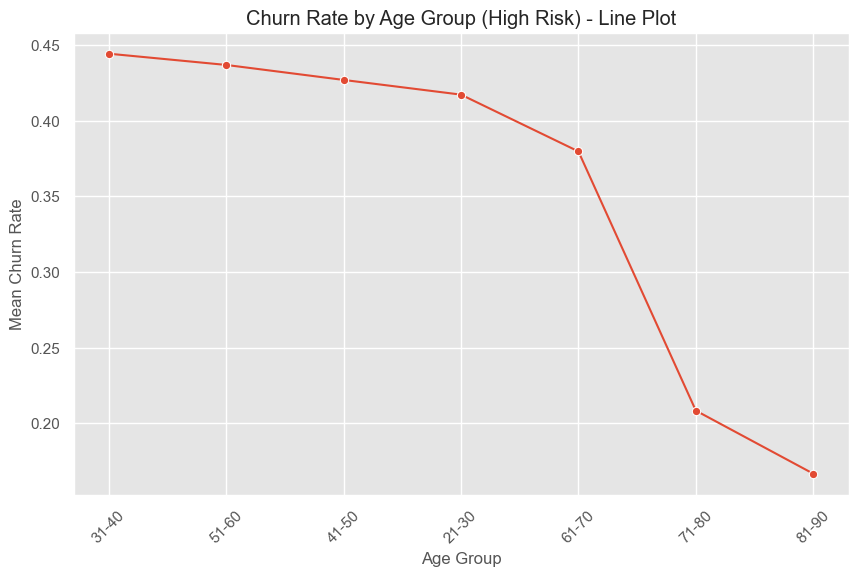

In [104]:
## Line Plot Visualizing the mean churn rate by age group, showing trends with a line and markers for each point.

plt.figure(figsize=(10, 6))
sns.lineplot(x='Age Group', y='ChurnFlag', data=mean_churn_by_category, marker='o')

# Add titles and labels
plt.title('Churn Rate by Age Group (High Risk) - Line Plot')
plt.xlabel('Age Group')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()

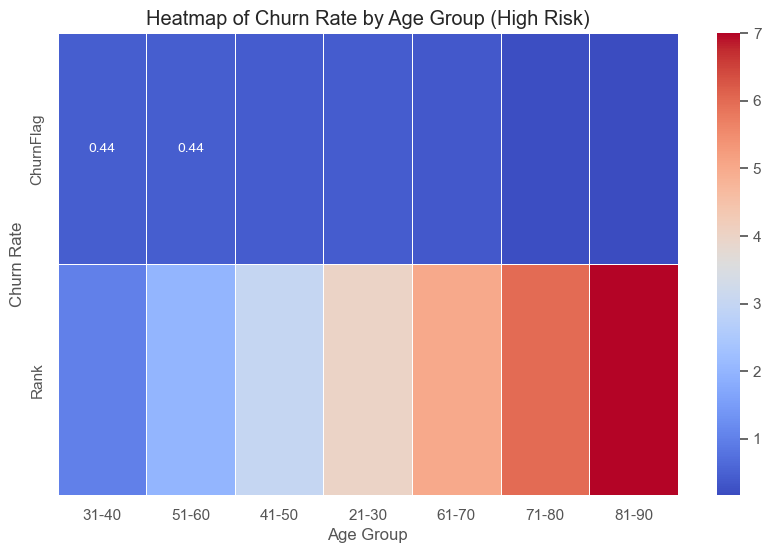

In [105]:
## Heatmap Display of the churn rate using color gradients, giving a clear view of variations across age groups.

## Heatmap of Churn Rate by Age Group (High-Risk Customers)
# Reshaping the data for a heatmap
heatmap_data = mean_churn_by_category.set_index('Age Group').T  # Transpose the data

# Create heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', cbar=True, linewidths=0.5)

# Add titles and labels
plt.title('Heatmap of Churn Rate by Age Group (High Risk)')
plt.xlabel('Age Group')
plt.ylabel('Churn Rate')

# Display the plot
plt.show()

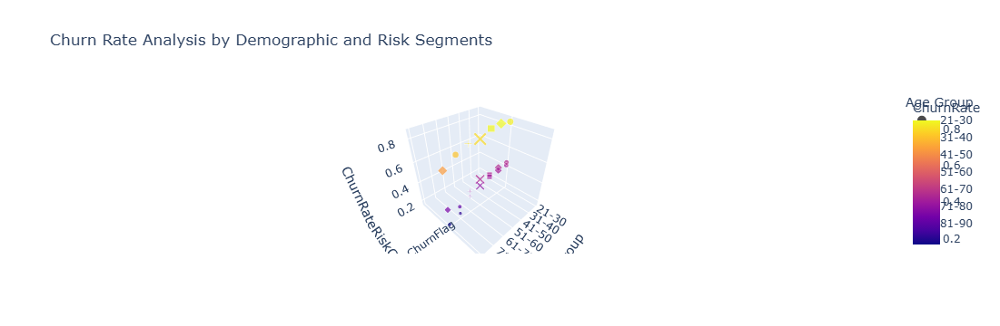

In [106]:
## Using Plotly's scatter_3d function to create a 3D scatter plot that visualizes Churn Rate across Age Group and Risk Category.

import plotly.express as px
import pandas as pd

# Assuming the following DataFrame `df_rfm_eda` is already prepared
# You can adjust this step based on your specific DataFrame and structure

# Step 1: Melt the pivot table for easy plotting
pivot_table = df_rfm_eda.groupby(['Age Group', 'RiskCategory'])['ChurnFlag'].mean().reset_index()

# Melt the pivot table for easy plotting
melted_pivot_table = pivot_table.melt(
    id_vars='Age Group',  # Keep 'Age Group' as the identifier column
    value_vars=['ChurnFlag'],  # Use the 'ChurnFlag' column as churn rate
    var_name='RiskCategory',  # Name the unpivoted columns as 'RiskCategory'
    value_name='ChurnRate'  # Churn rate values will be in 'ChurnRate' column
)

# Create the 3D scatter plot using Plotly
fig = px.scatter_3d(
    melted_pivot_table,  # Data for the plot
    x='Age Group',  # X-axis: 'Age Group'
    y='RiskCategory',  # Y-axis: 'RiskCategory'
    z='ChurnRate',  # Z-axis: 'ChurnRate'
    color='ChurnRate',  # Color the points based on 'ChurnRate'
    size='ChurnRate',  # Size of the points based on 'ChurnRate'
    size_max=12,  # Maximum size for the points
    symbol='Age Group',  # Use different symbols for different 'Age Groups'
    title='Churn Rate Analysis by Demographic and Risk Segments'  # Title of the plot
)

# Show the plot
fig.show()  # Display the plot

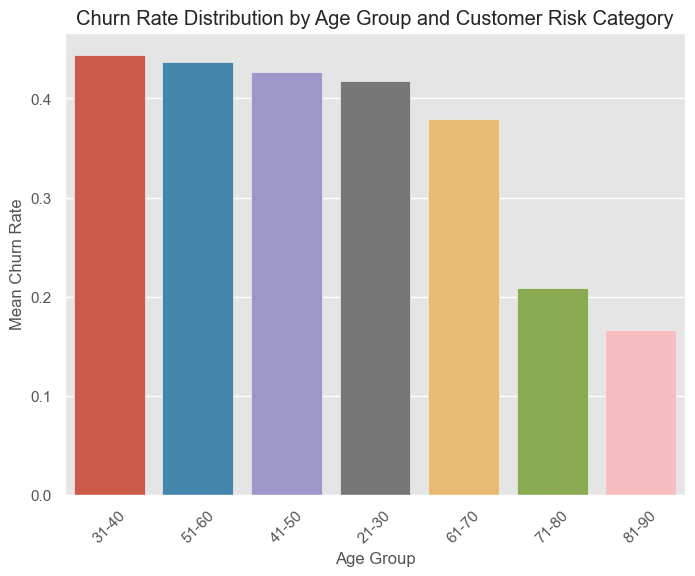

In [107]:
# Create a bar plot to visualize mean churn rate by age group and customer risk category
plt.figure(figsize=(8, 6))
sns.barplot(x='Age Group', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Age Group'])

# Add titles and labels
plt.title('Churn Rate Distribution by Age Group and Customer Risk Category')
plt.xlabel('Age Group')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()

### Analyzing All Segments Based on RFM Scores to identify high-risk, medium-risk, and low-risk segments.

#### Education

In [108]:
## Churn Rate Analysis by Education and Customer Risk Category

# Churn Rate Analysis Education and Risk Category Segmentation
churn_pivot_table = df_rfm_eda.pivot_table(index='Education', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display
print("\nChurn Rate by Education and Risk Category:")

print(churn_pivot_table)


Churn Rate by Education and Risk Category:
RiskCategory            Education      High       Low    Medium
0                       Bachelors  0.471861  0.847565  0.436949
1                 Graduate Degree  0.407011  0.842654  0.418248
2                     High School  0.390379  0.821229  0.347673
3                 Partial College  0.415882  0.836551  0.393370
4             Partial High School  0.385263  0.783451  0.289963


In [109]:
## Ranking Education Category by Mean Churn Rate in the High-Risk Customer Segment

# Segmenting for High-Risk Customers
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Determine the mean Churn Rate by Marital Status for High-Risk Customers
mean_churn_by_category = high_risk_df.groupby('Education')['ChurnFlag'].mean().reset_index()

# Rank the Marital Status Categories Based on mean Churn Rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the marital status categories by churn rate rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the marital status categories ranked by churn rate
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate (High Risk):
             Education  ChurnFlag  Rank
0            Bachelors   0.471861   1.0
3      Partial College   0.415882   2.0
1      Graduate Degree   0.407011   3.0
2          High School   0.390379   4.0
4  Partial High School   0.385263   5.0


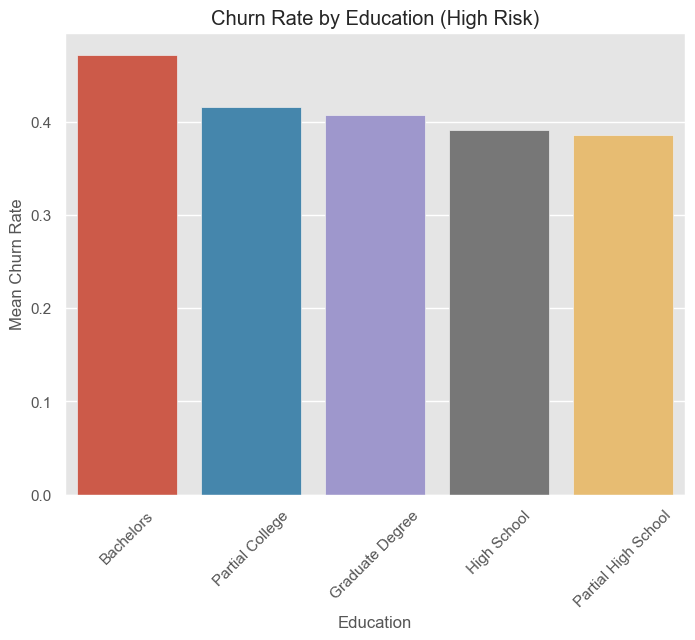

In [110]:
# Create a bar plot for the ranked categories by mean churn rate based on 'Education'
plt.figure(figsize=(8, 6))

# Create the barplot with 'Education' on the x-axis and 'ChurnFlag' on the y-axis
sns.barplot(x='Education', y='ChurnFlag', data=mean_churn_by_category, 
            order=mean_churn_by_category.sort_values('ChurnFlag', ascending=False)['Education'])

# Add titles and labels
plt.title('Churn Rate by Education (High Risk)')
plt.xlabel('Education')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Display the plot
plt.show()

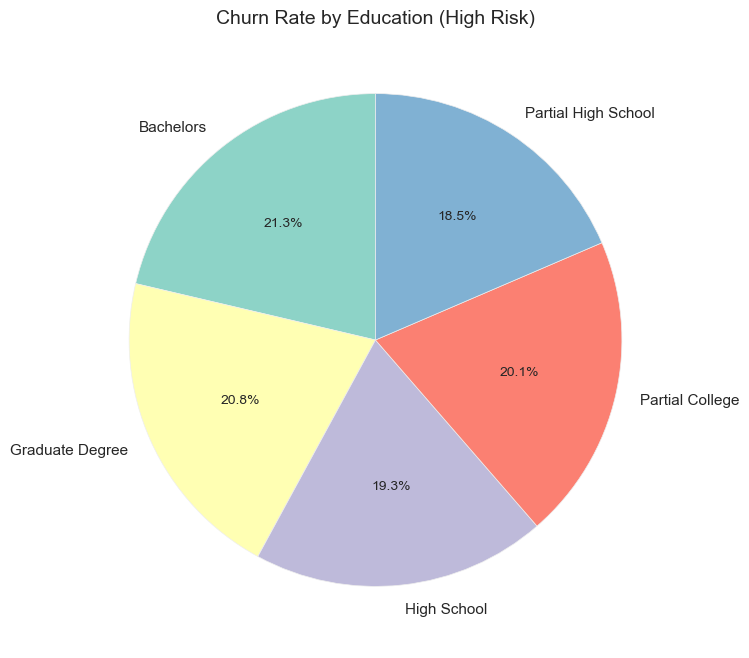

In [111]:
## Visualizing the mean churn rate by education using a pie chart,

# Calculate the mean churn rate by education
mean_churn_by_education = df_rfm_eda.groupby('Education')['ChurnFlag'].mean().reset_index()

# Create a pie chart for mean churn rate by education category
plt.figure(figsize=(8, 8))

# Plot the pie chart
plt.pie(mean_churn_by_education['ChurnFlag'], labels=mean_churn_by_education['Education'], 
        autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set3', len(mean_churn_by_education)))

# Add a title
plt.title('Churn Rate by Education (High Risk)', fontsize=14)

# Display the pie chart
plt.show()

<Axes: xlabel='Education', ylabel='ChurnFlag'>

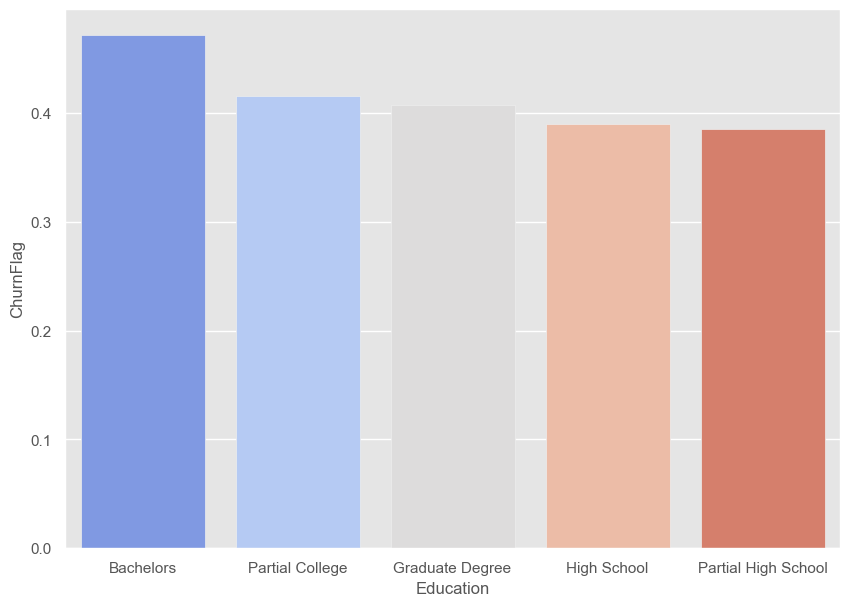

In [112]:
## visualizing the mean churn rate based on education level in the high-risk category.

sns.barplot(x='Education', y='ChurnFlag', data=mean_churn_by_category, 
            order=mean_churn_by_category.sort_values('ChurnFlag', ascending=False)['Education'],
            palette='coolwarm')

#### Income

In [113]:

# Churn Rate Analysis Based on Income and Risk Category Segmentation
churn_pivot_table = df_rfm_eda.pivot_table(index='Income Segment', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display
print("\nChurn Rate by Income Segment and Risk Category:")

print(churn_pivot_table)


Churn Rate by Income Segment and Risk Category:
RiskCategory Income Segment      High       Low    Medium
0               High Income  0.563636  0.800000  0.501748
1                Low Income  0.413214  0.826897  0.333771
2                Mid Income  0.405339  0.845286  0.435906


In [114]:
## Ranking Income Categories by Mean Churn Rate in the High-Risk Customer Segment

# Segmenting for High-Risk Customers
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Determine the mean Churn Rate by Marital Status for High-Risk Customers
mean_churn_by_category = high_risk_df.groupby('Income Segment')['ChurnFlag'].mean().reset_index()

# Rank the Education Categories Based on mean Churn Rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the Education categories by churn rate rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the marital status categories ranked by churn rate
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate (High Risk):
  Income Segment  ChurnFlag  Rank
0    High Income   0.563636   1.0
1     Low Income   0.413214   2.0
2     Mid Income   0.405339   3.0


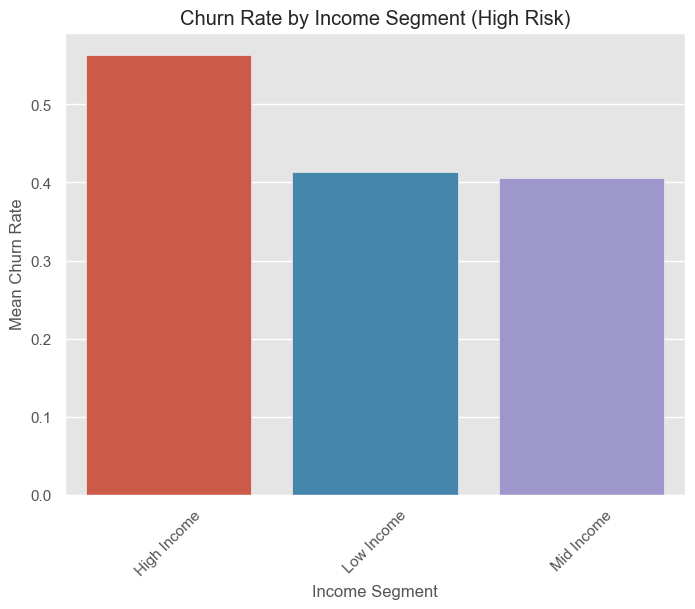

In [115]:
# barchart visualization to explore this further.

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(8, 6))
sns.barplot(x='Income Segment', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Income Segment'])

# Add titles and labels
plt.title('Churn Rate by Income Segment (High Risk)')
plt.xlabel('Income Segment')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()

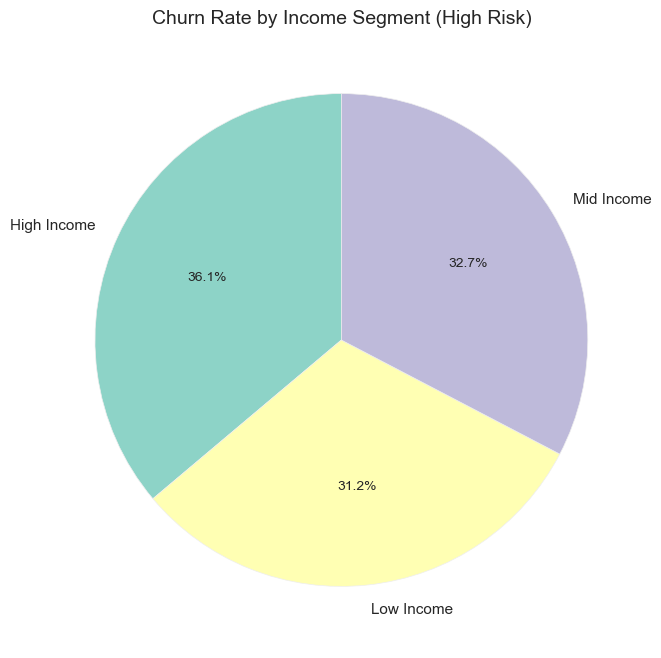

In [116]:
## Pie chart showing the analysis of Churn Rate Distribution by Income Segments (High Risk Customers)

# Calculate the mean churn rate by Income Segment
mean_churn_by_income_segment = df_rfm_eda.groupby('Income Segment')['ChurnFlag'].mean().reset_index()

# Create a pie chart for the mean churn rate by Income Segment
plt.figure(figsize=(8, 8))

# Plot the pie chart
plt.pie(mean_churn_by_income_segment['ChurnFlag'], labels=mean_churn_by_income_segment['Income Segment'], 
        autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set3', len(mean_churn_by_income_segment)))

# Add a title
plt.title('Churn Rate by Income Segment (High Risk)', fontsize=14)

# Display the pie chart
plt.show()

#### Marital Status

In [117]:
## Churn Rate Analysis by Marital Status and Customer Risk Category

# Churn Rate Analysis Based on Marital Status and Risk Category Segmentation
churn_pivot_table = df_rfm_eda.pivot_table(index='MaritalStatus', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display
print("\nChurn Rate by MaritalStatus and Risk Category:")

print(churn_pivot_table)


Churn Rate by MaritalStatus and Risk Category:
RiskCategory MaritalStatus      High       Low    Medium
0                        M  0.421115  0.817805  0.382520
1                        S  0.428366  0.849889  0.407407


In [118]:
## Ranking Marital Status Categories by Mean Churn Rate in the High-Risk Customer Segment

# Segmenting for High-Risk Customers
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Determine the mean Churn Rate by Marital Status for High-Risk Customers
mean_churn_by_category = high_risk_df.groupby('MaritalStatus')['ChurnFlag'].mean().reset_index()

# Rank the Marital Status Categories Based on mean Churn Rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the marital status categories by churn rate rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the marital status categories ranked by churn rate
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate (High Risk):
  MaritalStatus  ChurnFlag  Rank
1             S   0.428366   1.0
0             M   0.421115   2.0


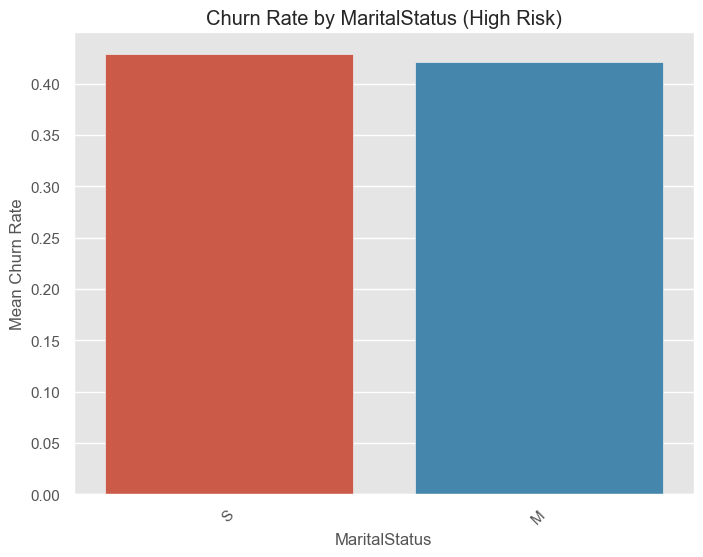

In [119]:
# Using visualization to explore this further.
# bar chart showing clearly how each category ranks in terms of churn rate.

# Create a bar plot to visualize the churn rate by marital status categories
plt.figure(figsize=(8, 6))
sns.barplot(x='MaritalStatus', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['MaritalStatus'])

# Add titles and labels
plt.title('Churn Rate by MaritalStatus (High Risk)')
plt.xlabel('MaritalStatus')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()

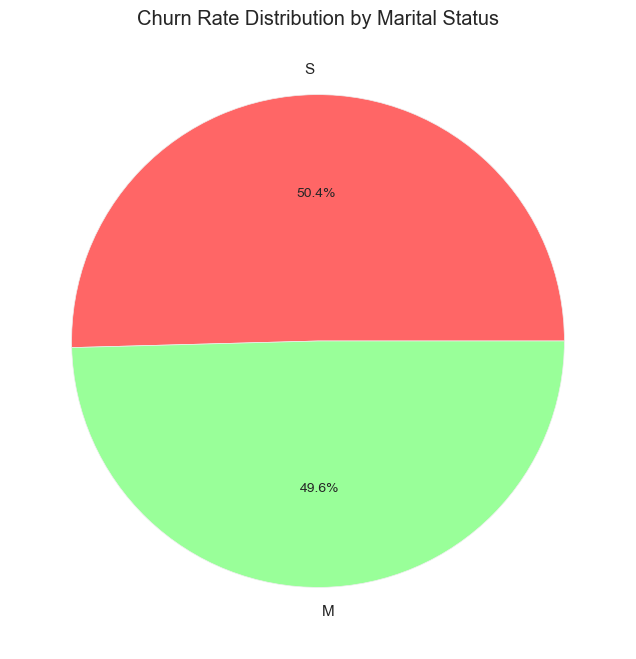

In [120]:
## Pie chart showing the analysis of Churn Rate Distribution by Marital Status (High Risk Customers)

# Create a pie chart to visualize the churn rate by marital status categories
plt.figure(figsize=(8, 8))
mean_churn_by_category.set_index('MaritalStatus')['ChurnFlag'].plot(kind='pie', autopct='%1.1f%%', legend=False, colors=['#FF6666', '#99FF99', '#FFCC66'])

# Add title
plt.title('Churn Rate Distribution by Marital Status')

# Display the pie chart
plt.ylabel('')
plt.show()

#### Gender

In [121]:
# Pivot table to analyze churn rate by Gender and risk category
churn_pivot_table = df_rfm_eda.pivot_table(index='Gender', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table
print("\nChurn Rate by Gender and Risk Category:")

print(churn_pivot_table)


Churn Rate by Gender and Risk Category:
RiskCategory Gender      High       Low    Medium
0                 F  0.435830  0.843365  0.388838
1                 M  0.413226  0.822467  0.399080


In [122]:
## Ranking Gender Categories by Mean Churn Rate in the High-Risk Customer Segment

# Segmenting for High-Risk Customers
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Determine the mean Churn Rate by Gender for High-Risk Customers
mean_churn_by_category = high_risk_df.groupby('Gender')['ChurnFlag'].mean().reset_index()

# # Rank the Gender Categories Based on mean Churn Rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the Gender categories by churn rate rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the Gender categories ranked by churn rate
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate (High Risk):
  Gender  ChurnFlag  Rank
0      F   0.435830   1.0
1      M   0.413226   2.0


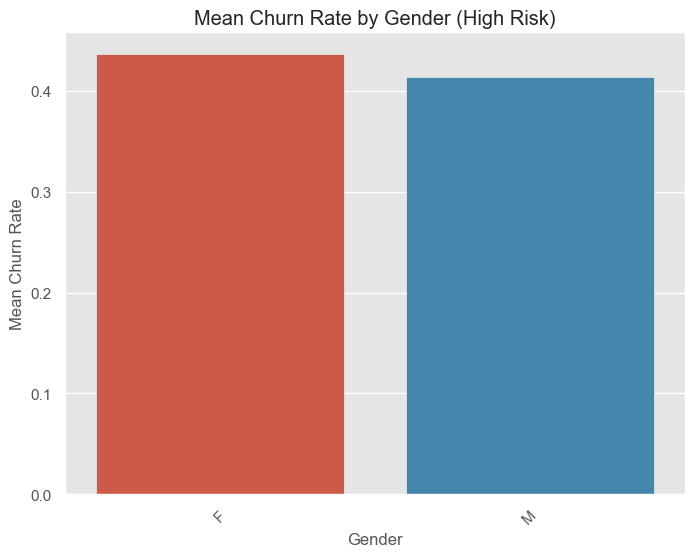

In [123]:
## Visualizing Mean Churn Rate by Gender (High Risk Categories)

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(8, 6))
sns.barplot(x='Gender', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Gender'])

# Add titles and labels
plt.title('Mean Churn Rate by Gender (High Risk)')
plt.xlabel('Gender')
plt.ylabel('Mean Churn Rate')
plt.xticks(rotation=45)

# Display the plot
plt.show()

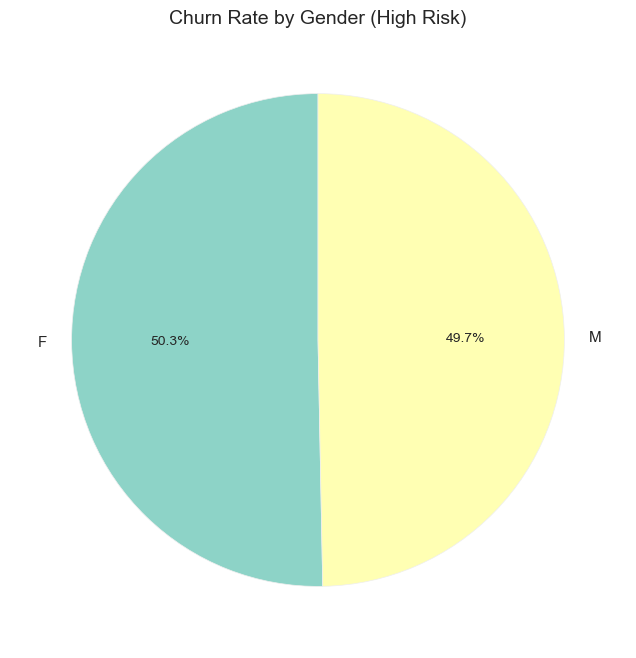

In [124]:
## Pie chart visualizing the mean churn rate by gender.

# Calculate the mean churn rate by Gender
mean_churn_by_gender = df_rfm_eda.groupby('Gender')['ChurnFlag'].mean().reset_index()

# Create a pie chart for the mean churn rate by Gender
plt.figure(figsize=(8, 8))

# Plot the pie chart
plt.pie(mean_churn_by_gender['ChurnFlag'], labels=mean_churn_by_gender['Gender'], 
        autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set3', len(mean_churn_by_gender)))

# Add a title
plt.title('Churn Rate by Gender (High Risk)', fontsize=14)

# Display the pie chart
plt.show()

#### Total Children

In [125]:
## Churn Rate Analysis by Total Children and Risk Category

# Create a pivot table to analyze churn rate by TotalChildren and risk category
pivot_table = df_rfm_eda.pivot_table(
    index='TotalChildren',  # Rows will be categorized by 'TotalChildren'
    columns='RiskCategory',  # Columns will be categorized by 'RiskCategory'
    values='ChurnFlag',  # Values will represent 'ChurnFlag' (churn rate)
    aggfunc='mean'  # Use mean to calculate the average churn rate for each combination
).reset_index()  # Reset index to make 'TotalChildren' a column instead of an index

# Display the pivot table heading
print("\nChurn Rate by Total Children and Risk Category:")

# Print the pivot table to view the results
print(pivot_table)


Churn Rate by Total Children and Risk Category:
RiskCategory TotalChildren      High       Low    Medium
0                 1-2 kids  0.464286  0.832983  0.403868
1                 3-5 kids  0.337221  0.822771  0.351701
2                  No kids  0.467789  0.843691  0.427799


In [126]:
## Ranked Categories by Mean Churn Rate (High Risk Segment)
## Analyzing and ranking high-risk customer churn based on the number of children.

# Filter the DataFrame for the High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Step 2: Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('TotalChildren')['ChurnFlag'].mean().reset_index()

# Step 3: Rank the categories based on the mean churn rate (highest churn rates ranked first)
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Step 4: Sort the categories by rank in ascending order
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Step 5: Display the ranked categories along with their mean churn rate
print("\nRanked Categories by Mean Churn Rate (High Risk):")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate (High Risk):
  TotalChildren  ChurnFlag  Rank
2       No kids   0.467789   1.0
0      1-2 kids   0.464286   2.0
1      3-5 kids   0.337221   3.0


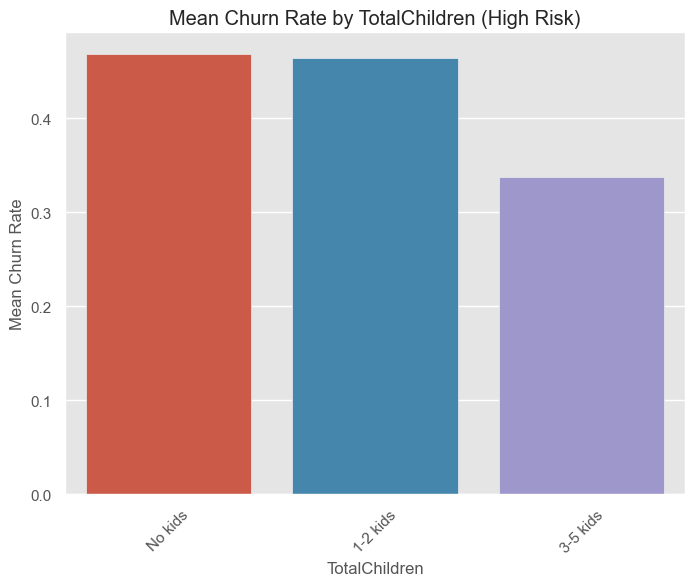

In [127]:
## Visualizing the Mean Churn Rate by Total Children in High-Risk Segment

# Create the Bar Plot for Mean Churn Rate by TotalChildren
plt.figure(figsize=(8, 6))  # Set the figure size
sns.barplot(x='TotalChildren', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['TotalChildren'])

# Adjust the Plot's Appearance
plt.title('Mean Churn Rate by TotalChildren (High Risk)')  # Add title
plt.xlabel('TotalChildren')  # Add x-axis label
plt.ylabel('Mean Churn Rate')  # Add y-axis label
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Display the Plot
plt.show()  # Show the plot

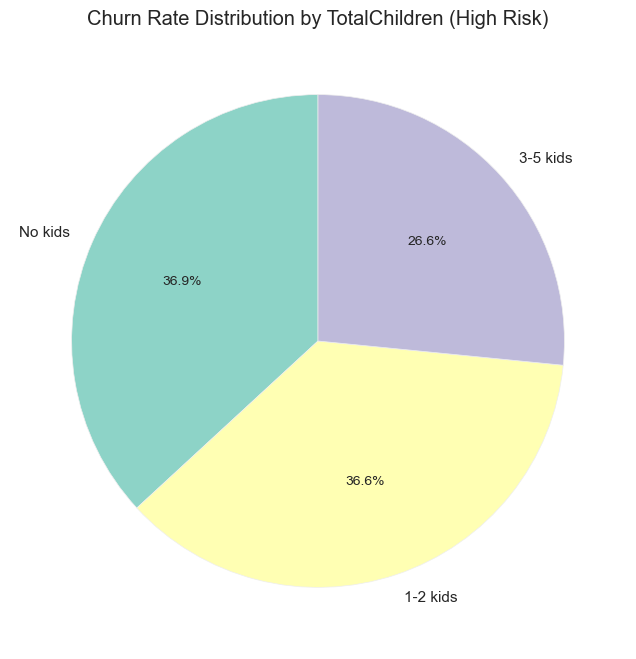

In [128]:
# Churn Rate Distribution by TotalChildren in High-Risk Segment

# Step 1: Create the Pie Chart for Churn Rate by TotalChildren
plt.figure(figsize=(8, 8))  # Set the figure size

# Create the pie chart using the mean churn rate data
plt.pie(mean_churn_by_category['ChurnFlag'], labels=mean_churn_by_category['TotalChildren'],
        autopct='%1.1f%%', startangle=90, colors=sns.color_palette("Set3", len(mean_churn_by_category)))

# Step 2: Add Title
plt.title('Churn Rate Distribution by TotalChildren (High Risk)')

# Step 3: Display the Pie Chart
plt.show()

#### Occupation

In [129]:
## Churn Rate Analysis by Occupation and Risk Category

# Pivot table to analyze churn rate by Occupation and risk category
pivot_table = df_rfm_eda.pivot_table(index='Occupation', columns='RiskCategory', values='ChurnFlag', aggfunc='mean').reset_index()

# Display the pivot table with a heading
print("\nChurn Rate Analysis by Occupation and Risk Category:")
print(pivot_table)


Churn Rate Analysis by Occupation and Risk Category:
RiskCategory      Occupation      High       Low    Medium
0                   Clerical  0.511270  0.842623  0.365477
1                 Management  0.444123  0.823144  0.449599
2                     Manual  0.368497  0.820413  0.347495
3               Professional  0.421264  0.841780  0.433962
4             Skilled Manual  0.382250  0.829086  0.350683


In [130]:
## churn rate analysis focusing on high-risk customers and their occupations.

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each category within the high-risk segment
mean_churn_by_category = high_risk_df.groupby('Occupation')['ChurnFlag'].mean().reset_index()

# Rank the categories based on the mean churn rate
mean_churn_by_category['Rank'] = mean_churn_by_category['ChurnFlag'].rank(ascending=False)

# Sort the categories by rank
mean_churn_by_category = mean_churn_by_category.sort_values('Rank')

# Display the ranked categories with a heading
print("\nRanked Categories by Mean Churn Rate in High-Risk Segment:")
print(mean_churn_by_category)


Ranked Categories by Mean Churn Rate in High-Risk Segment:
       Occupation  ChurnFlag  Rank
0        Clerical   0.511270   1.0
1      Management   0.444123   2.0
3    Professional   0.421264   3.0
4  Skilled Manual   0.382250   4.0
2          Manual   0.368497   5.0


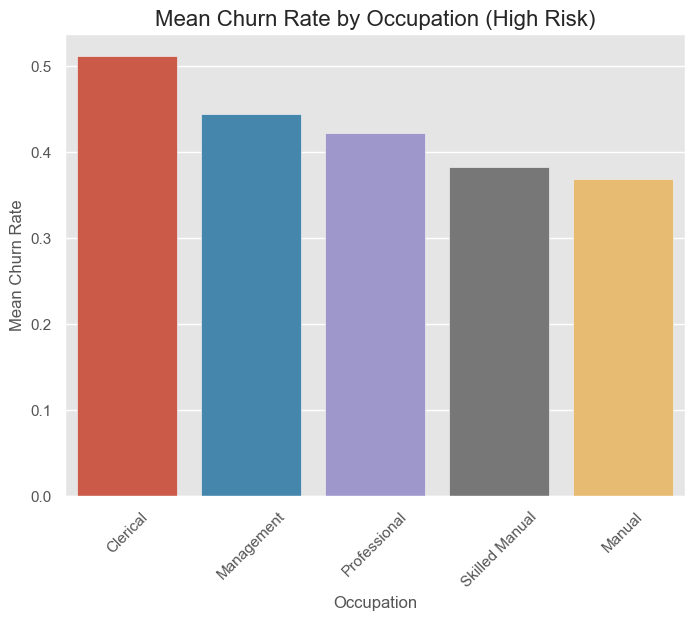

In [131]:
## bar plot, showing the mean churn rate for different occupations in the high-risk segment.

# Create a bar plot for the ranked categories by mean churn rate
plt.figure(figsize=(8, 6))

# Plot the bar chart using seaborn
sns.barplot(x='Occupation', y='ChurnFlag', data=mean_churn_by_category, order=mean_churn_by_category['Occupation'])

# Add titles and labels
plt.title('Mean Churn Rate by Occupation (High Risk)', fontsize=16)
plt.xlabel('Occupation', fontsize=12)
plt.ylabel('Mean Churn Rate', fontsize=12)
plt.xticks(rotation=45)

# Display the plot
plt.show()

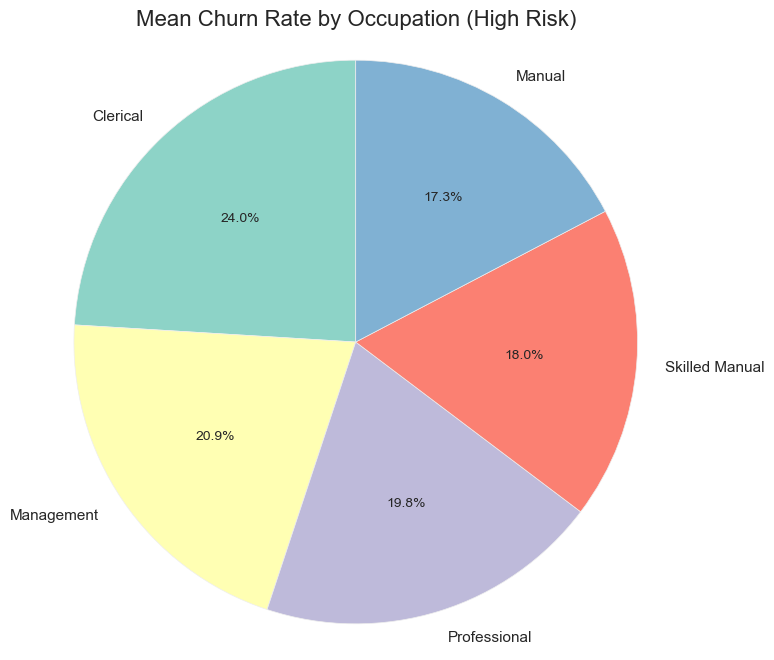

In [132]:
## pie chart visualizing the Distribution of Mean Churn Rate by Occupation (High Risk)

# Create a pie chart for mean churn rate by occupation (High Risk)
plt.figure(figsize=(8, 8))

# Plotting the pie chart
plt.pie(mean_churn_by_category['ChurnFlag'], labels=mean_churn_by_category['Occupation'], 
        autopct='%1.1f%%', startangle=90, colors=sns.color_palette("Set3", len(mean_churn_by_category)))

# Add title
plt.title('Mean Churn Rate by Occupation (High Risk)', fontsize=16)

# Display the plot
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

### Integrating Age Group with Other Categorical Features for Churn Rate Analysis

This approach involves combining the **Age Group** variable with other categorical features, such as **Occupation**, **Income**, or **Education**, to better understand how these factors collectively influence churn behavior. By merging multiple categorical variables, we can create more granular groups that allow us to analyze churn rates with respect to combinations of these characteristics, rather than just considering age groups or individual features in isolation.

For example, we might want to see how the churn rate varies for **Age Groups** across different **Income** (e.g., low, medium, high risk) or **Occupations** (e.g., Management, Clerical, Manual). This combination of features can reveal more nuanced insights, like whether a specific age group within a certain occupation is more likely to churn than another.

In [133]:
# Age Group and Gender

In [134]:
## Analyzing Churn Rate by Age Group and Gender in High-Risk Segment

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age group and Gender (Demographics)
mean_churn_rate_by_demographics = high_risk_df.groupby(['Age Group', 'Gender'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print("\nMean Churn Rate by Demographics (Age Group and Gender) in High Risk Segment:")
print(mean_churn_rate_by_demographics)


Mean Churn Rate by Demographics (Age Group and Gender) in High Risk Segment:
Gender            F         M
Age Group                    
21-30      0.381503  0.449735
31-40      0.458491  0.430037
41-50      0.457330  0.396018
51-60      0.427746  0.445035
61-70      0.390572  0.368771
71-80      0.189655  0.225806
81-90      0.200000  0.125000


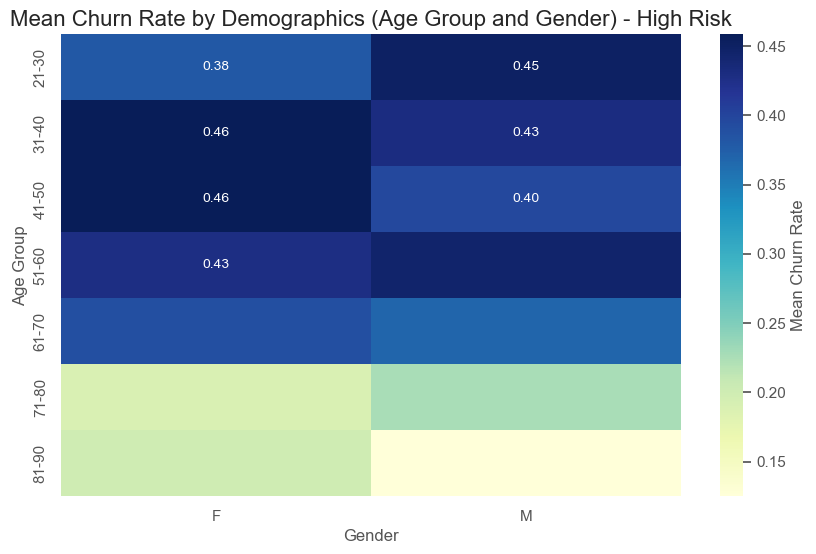

In [135]:
## Heatmap of Mean Churn Rate by Demographics (Age Group and Gender) in High-Risk Segment.

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age group and Gender (Demographics)
mean_churn_rate_by_demographics = high_risk_df.groupby(['Age Group', 'Gender'])['ChurnFlag'].mean().unstack()

# Set up the figure for the heatmap
plt.figure(figsize=(10, 6))

# Create a heatmap
sns.heatmap(mean_churn_rate_by_demographics, annot=True, cmap='YlGnBu', cbar_kws={'label': 'Mean Churn Rate'}, fmt='.2f')

# Add titles and labels
plt.title('Mean Churn Rate by Demographics (Age Group and Gender) - High Risk', fontsize=16)
plt.xlabel('Gender')
plt.ylabel('Age Group')

# Display the plot
plt.show()

In [136]:
## Age Group and Income

In [137]:
## Analyzing Churn Rate by Age Group and Income in High-Risk Segment

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for combinations of Age Group, Income Segment, and Marital Status
mean_churn_by_demographics = high_risk_df.groupby(['Age Group', 'Income Segment'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_by_demographics)

Income Segment  High Income  Low Income  Mid Income
Age Group                                          
21-30              1.000000    0.391635    0.457447
31-40              0.707792    0.397800    0.455468
41-50              0.449495    0.433642    0.417695
51-60              0.601227    0.443526    0.384201
61-70              0.492958    0.478632    0.273038
71-80              0.307692    0.212121    0.170732
81-90              1.000000    0.142857    0.000000


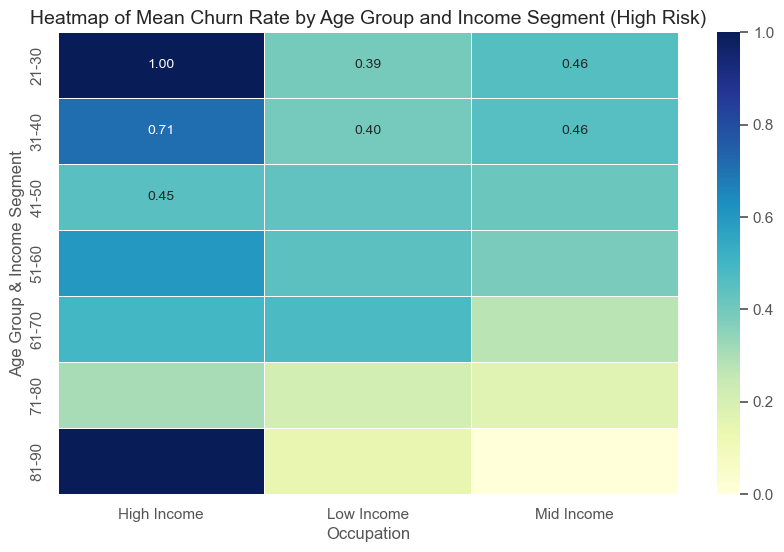

In [138]:
## Heatmap of Mean Churn Rate by Demographics (Age Group and Income) in High-Risk Segment.

# Plot the heatmap for the mean churn rate
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_demographics, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5)

# Adding title and labels
plt.title('Heatmap of Mean Churn Rate by Age Group and Income Segment (High Risk)', fontsize=14)
plt.xlabel('Occupation', fontsize=12)
plt.ylabel('Age Group & Income Segment', fontsize=12)

# Show the plot
plt.show()

In [139]:
# Age Group and TotalChildren

In [140]:
## Analyzing Churn Rate by Age Group and TotalChildren in High-Risk Segment

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age Group and TotalChildren
mean_churn_by_demographics = high_risk_df.groupby(['Age Group', 'TotalChildren'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_by_demographics)

TotalChildren  1-2 kids  3-5 kids   No kids
Age Group                                  
21-30          0.611111  0.297872  0.412186
31-40          0.468454  0.331492  0.466549
41-50          0.478890  0.323699  0.521886
51-60          0.447761  0.420382  0.555556
61-70          0.509804  0.282799       NaN
71-80          0.200000  0.224490  0.000000
81-90          0.111111  0.125000  1.000000


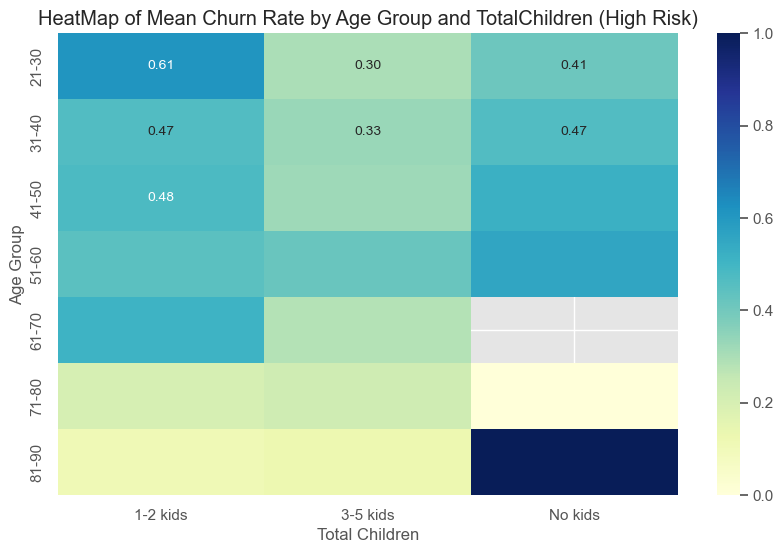

In [141]:
## Heatmap of Mean Churn Rate by Demographics (Age Group and TotalChildren) in High-Risk Segment.

import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap for the mean churn rates by Age Group and TotalChildren
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_demographics, annot=True, cmap='YlGnBu', fmt='.2f', cbar=True)

# Add titles and labels
plt.title('HeatMap of Mean Churn Rate by Age Group and TotalChildren (High Risk)')
plt.xlabel('Total Children')
plt.ylabel('Age Group')

# Display the heatmap
plt.show()

In [142]:
# Age Group and Occupation

In [143]:
## Analyzing Churn Rate by Age Group and Occupation in High-Risk Segment

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age Group and Occupation
mean_churn_rate_by_demographics = high_risk_df.groupby(['Age Group', 'Occupation'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_rate_by_demographics)

Occupation  Clerical  Management    Manual  Professional  Skilled Manual
Age Group                                                               
21-30       0.483146    0.722222  0.459770      0.488372        0.272000
31-40       0.494595    0.630522  0.369231      0.494557        0.310092
41-50       0.531120    0.453608  0.352041      0.402797        0.430085
51-60       0.525641    0.445122  0.280702      0.377358        0.532751
61-70       0.647727    0.336232  0.526316      0.270000        0.369565
71-80       0.200000    0.205882  0.000000      0.357143        0.100000
81-90       0.142857         NaN  0.000000      0.500000        0.250000


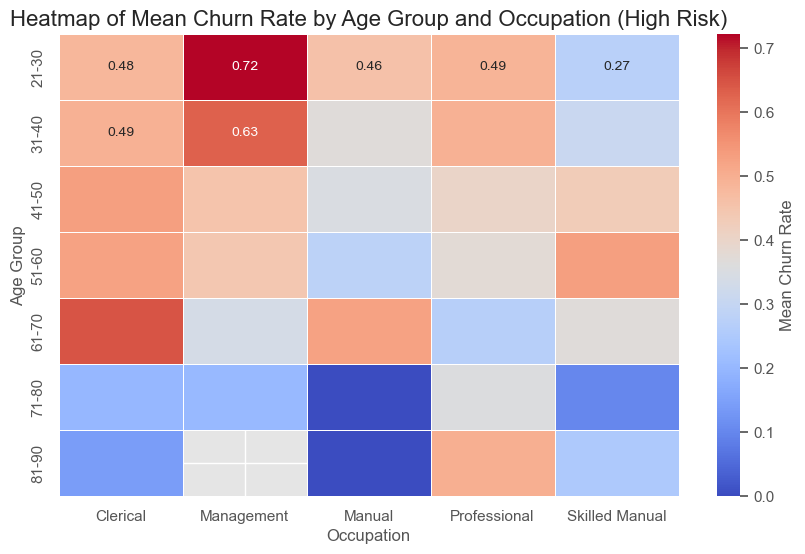

In [144]:
## Heatmap of Mean Churn Rate by Demographics (Age Group and Occupation) in High-Risk Segment.

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_rate_by_demographics, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, cbar_kws={'label': 'Mean Churn Rate'})

# Add titles and labels
plt.title('Heatmap of Mean Churn Rate by Age Group and Occupation (High Risk)', fontsize=16)
plt.xlabel('Occupation', fontsize=12)
plt.ylabel('Age Group', fontsize=12)

# Display the plot
plt.show()

In [145]:
# Age Group and MaritalStatus

In [146]:
# Analyzing Churn Rate by Age Group and Marital Status in High-Risk Segment

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age Group and MaritalStatus
mean_churn_by_demographics = high_risk_df.groupby(['Age Group', 'MaritalStatus'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_by_demographics)

MaritalStatus         M         S
Age Group                        
21-30          0.410959  0.421296
31-40          0.453629  0.435965
41-50          0.424361  0.430000
51-60          0.427350  0.454068
61-70          0.378713  0.381443
71-80          0.197368  0.227273
81-90          0.133333  0.333333


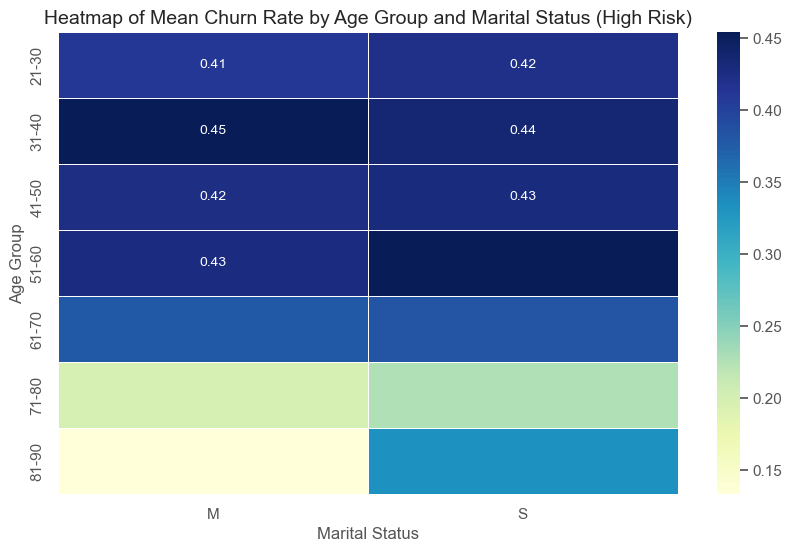

In [147]:
## Heatmap of Mean Churn Rate by Demographics (Age Group and Marital Status) in High-Risk Segment.

# Plot the heatmap
plt.figure(figsize=(10, 6))  # Set the size of the plot
sns.heatmap(mean_churn_by_demographics, annot=True, cmap="YlGnBu", fmt=".2f", linewidths=0.5)

# Adding title and labels
plt.title('Heatmap of Mean Churn Rate by Age Group and Marital Status (High Risk)', fontsize=14)
plt.xlabel('Marital Status', fontsize=12)
plt.ylabel('Age Group', fontsize=12)

# Show the plot
plt.show()

In [148]:
# Age group and Education

In [149]:
## Analyzing Churn Rate by Age Group and Education in High-Risk Segment

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of Age Group and Education
mean_churn_rate_by_demographics = high_risk_df.groupby(['Age Group', 'Education'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_rate_by_demographics)

Education  Bachelors  Graduate Degree  High School  Partial College  \
Age Group                                                             
21-30       0.647059         0.555556     0.282609         0.407407   
31-40       0.529052         0.438819     0.434524         0.341004   
41-50       0.451169         0.432258     0.320574         0.439689   
51-60       0.453704         0.465116     0.440828         0.450549   
61-70       0.372180         0.317308     0.322581         0.540816   
71-80       0.250000         0.168831     0.375000         0.263158   
81-90       0.222222         0.000000     0.200000         0.000000   

Education  Partial High School  
Age Group                       
21-30                 0.326531  
31-40                 0.442105  
41-50                 0.362069  
51-60                 0.359712  
61-70                 0.324324  
71-80                      NaN  
81-90                 0.000000  


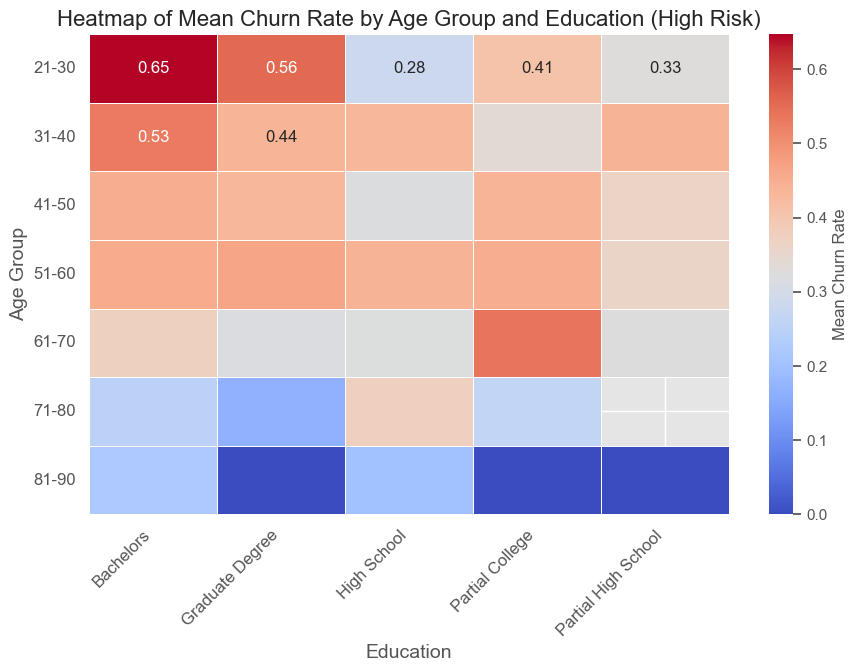

In [150]:
## Heatmap of Mean Churn Rate by Demographics (Age Group and Education) in High-Risk Segment.

# Plot the heatmap with more spacing and adjustments
plt.figure(figsize=(10, 6))  # Increase figure size to allow better readability
sns.heatmap(mean_churn_rate_by_demographics, annot=True, cmap='coolwarm', fmt='.2f', 
            linewidths=0.5, cbar_kws={'label': 'Mean Churn Rate'}, 
            annot_kws={"size": 12}, cbar=True)

# Rotate the x and y axis labels to prevent overlap
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)

# Add titles and labels
plt.title('Heatmap of Mean Churn Rate by Age Group and Education (High Risk)', fontsize=16)
plt.xlabel('Education', fontsize=14)
plt.ylabel('Age Group', fontsize=14)

# Adjust spacing between subplots to prevent labels from getting cut off
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

# Display the plot
plt.show()

### Integrating Marital Status with Other Categorical Features for Churn Rate Analysis
In this approach, we aim to combine Marital Status with other categorical features to gain more granular insights into customer churn behavior. By analyzing how churn rates change when Marital Status is considered along with other features, we can uncover more nuanced patterns in churn behavior, which can inform marketing, retention, and segmentation strategies.

In [151]:
## Marital Status and Occupation

In [152]:
## Analyzing Churn Rate by Marital Status and Occupation in High-Risk Customers

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of MaritalStatus and Occupation
mean_churn_by_demographics = high_risk_df.groupby(['MaritalStatus', 'Occupation'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_by_demographics)

Occupation     Clerical  Management    Manual  Professional  Skilled Manual
MaritalStatus                                                              
M              0.573123    0.430556  0.330435      0.401747        0.372573
S              0.444681    0.466667  0.387446      0.447585        0.395387


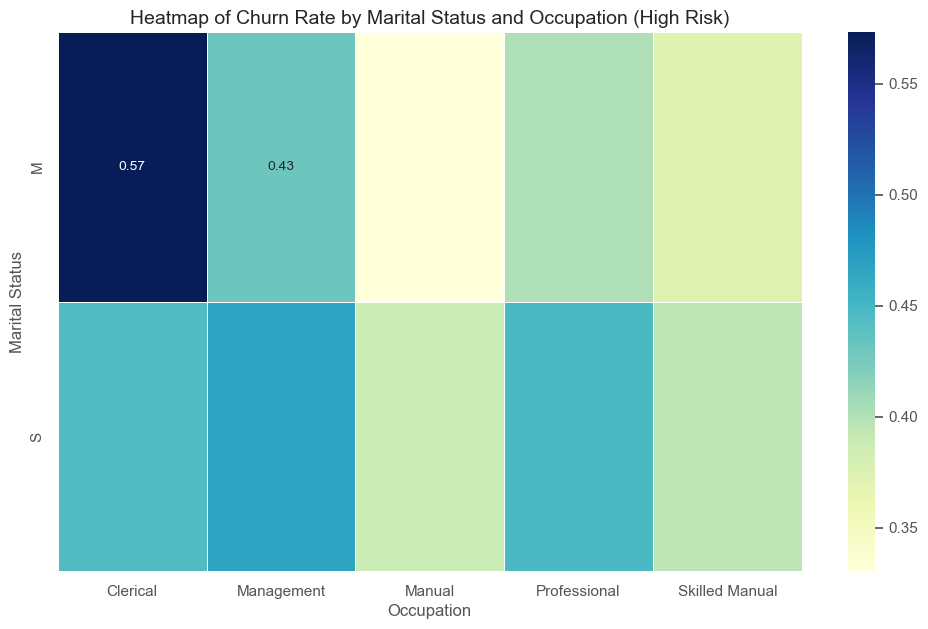

In [153]:
## Visualizing the churn rate by Marital Status and Total Occupation for the High-Risk customer segment using a heatmap

# Display the heatmap
plt.figure(figsize=(12, 7))
sns.heatmap(mean_churn_by_demographics, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5)

# Adding title and labels
plt.title('Heatmap of Churn Rate by Marital Status and Occupation (High Risk)', fontsize=14)
plt.xlabel('Occupation', fontsize=12)
plt.ylabel('Marital Status', fontsize=12)

# Display the plot
plt.show()

In [154]:
## Marital Status and Education

In [155]:
## Analyzing Churn Rate by Marital Status and Education in High-Risk Customers

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of MaritalStatus and Education
mean_churn_by_demographics = high_risk_df.groupby(['MaritalStatus', 'Education'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_by_demographics)

Education      Bachelors  Graduate Degree  High School  Partial College  \
MaritalStatus                                                             
M               0.477358         0.374194     0.373429         0.416942   
S               0.464467         0.457002     0.408397         0.414665   

Education      Partial High School  
MaritalStatus                       
M                         0.420290  
S                         0.358209  


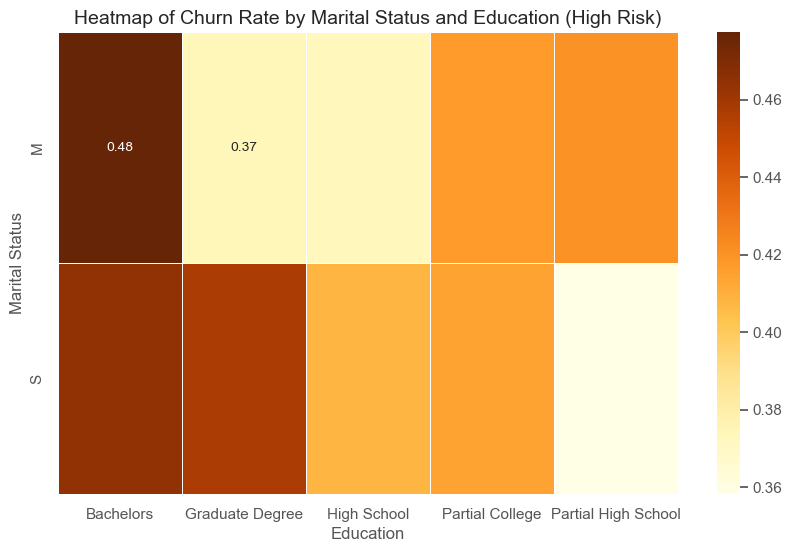

In [156]:
## heatmap visualizing the analyses of Churn Rate by Marital Status and Education in High-Risk Customers

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of MaritalStatus and Education
mean_churn_by_demographics = high_risk_df.groupby(['MaritalStatus', 'Education'])['ChurnFlag'].mean().unstack()

# Display the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_demographics, annot=True, cmap='YlOrBr', fmt='.2f', linewidths=0.5)

# Adding title and labels
plt.title('Heatmap of Churn Rate by Marital Status and Education (High Risk)', fontsize=14)
plt.xlabel('Education', fontsize=12)
plt.ylabel('Marital Status', fontsize=12)

# Display the plot
plt.show()

In [157]:
## Marital Status and Total Children

In [158]:
## Analyzing Churn Rate by Marital Status and Total Children in High-Risk Customers

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of MaritalStatus and TotalChildren
mean_churn_by_demographics = high_risk_df.groupby(['MaritalStatus', 'TotalChildren'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_by_demographics)

TotalChildren  1-2 kids  3-5 kids   No kids
MaritalStatus                              
M              0.437995  0.336903  0.544141
S              0.507609  0.337731  0.424545


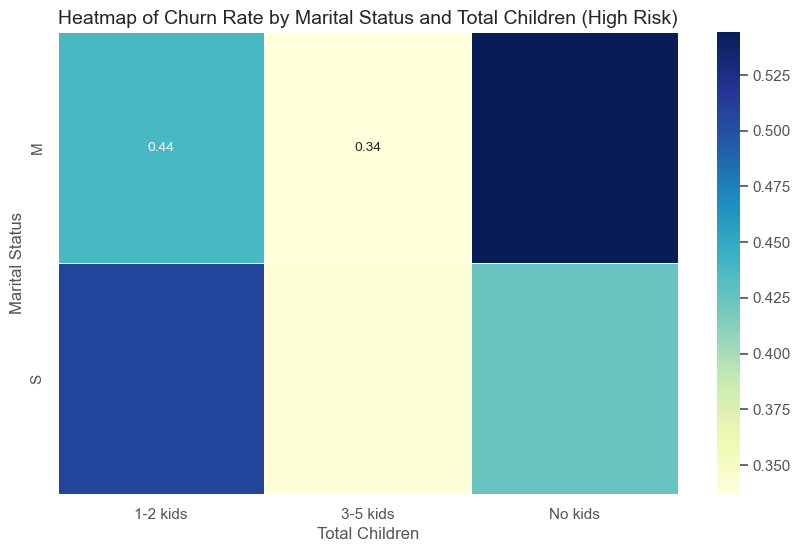

In [159]:
## Visualizing the churn rate by Marital Status and Total Children for the High-Risk customer segment using a heatmap

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of MaritalStatus and TotalChildren
mean_churn_by_combination = high_risk_df.groupby(['MaritalStatus', 'TotalChildren'])['ChurnFlag'].mean().unstack()

# Display the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_demographics, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5)

# Adding title and labels
plt.title('Heatmap of Churn Rate by Marital Status and Total Children (High Risk)', fontsize=14)
plt.xlabel('Total Children', fontsize=12)
plt.ylabel('Marital Status', fontsize=12)

# Display the plot
plt.show()

In [160]:
## Analyzing Churn Rate by Marital Status and Income in High-Risk Customers

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of MaritalStatus and Income
mean_churn_by_demographics = high_risk_df.groupby(['MaritalStatus', 'Income Segment'])['ChurnFlag'].mean().unstack()

# Display the mean churn rates
print(mean_churn_by_demographics)

Income Segment  High Income  Low Income  Mid Income
MaritalStatus                                      
M                  0.578534    0.447094    0.362799
S                  0.538117    0.379207    0.462233


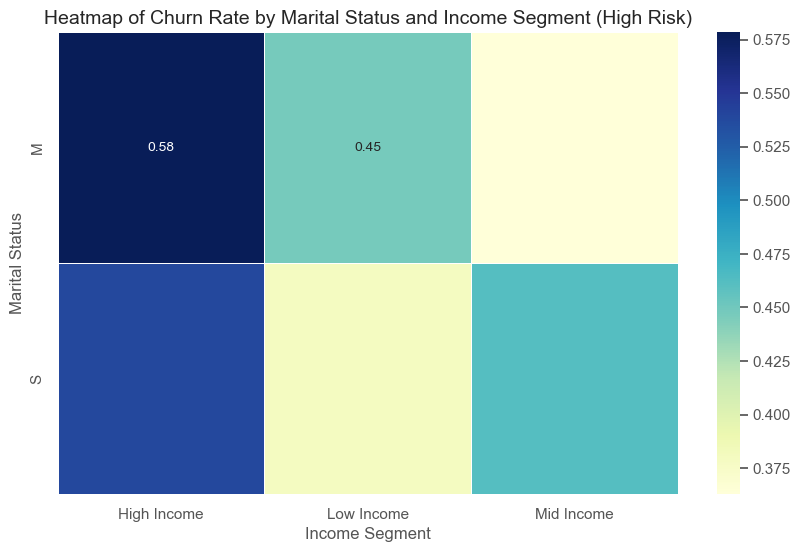

In [161]:
## Visualizing the churn rate by Marital Status and Income for the High-Risk customer segment using a heatmap

# Filter the DataFrame for High Risk category
high_risk_df = df_rfm_eda[df_rfm_eda['RiskCategory'] == 'High']

# Calculate the mean churn rate for each combination of MaritalStatus and Income Segment
mean_churn_by_demographics = high_risk_df.groupby(['MaritalStatus', 'Income Segment'])['ChurnFlag'].mean().unstack()

# Display the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(mean_churn_by_demographics, annot=True, cmap='YlGnBu', fmt='.2f', linewidths=0.5)

# Adding title and labels
plt.title('Heatmap of Churn Rate by Marital Status and Income Segment (High Risk)', fontsize=14)
plt.xlabel('Income Segment', fontsize=12)
plt.ylabel('Marital Status', fontsize=12)

# Display the plot
plt.show()

## Supervised Machine Learning

In [162]:
## an overview into the structure and features of the dataset being analyzed.

df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory
0,11000,M,M,Bachelors,Professional,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0,Low
1,11001,S,M,Bachelors,Professional,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0,High
2,11002,M,M,Bachelors,Professional,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0,Low
3,11003,S,F,Bachelors,Professional,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0,Medium
4,11004,S,F,Bachelors,Professional,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0,Low


### Encoding
All columns with object data types should be encoded.

In [163]:
## Transforming Categorical Features into Numerical Labels
## The following transformations are applied to the MaritalStatus and Gender columns:
## Marital Status: Encoded as 1 for "M" (Married) and 0 otherwise.
## Gender: Encoded into a new column named Female, with 1 representing "F" (Female) and 0 otherwise.

# Encoding Marital Status
df_rfm_eda['MaritalStatus'] = df_rfm_eda['MaritalStatus'].map(lambda maritalStatus: 1 if maritalStatus == "M" else 0)

# Encoding Gender and renaming as "Female"
df_rfm_eda['Gender'] = df_rfm_eda['Gender'].map(lambda gender: 1 if gender == "F" else 0)

# Display the updated DataFrame
df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory
0,11000,1,0,Bachelors,Professional,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0,Low
1,11001,0,0,Bachelors,Professional,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0,High
2,11002,1,0,Bachelors,Professional,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0,Low
3,11003,0,1,Bachelors,Professional,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0,Medium
4,11004,0,1,Bachelors,Professional,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0,Low


In [164]:
# We are label encoding the Occupation as it is a categorical feature with a number of categories, potentially representing ordinal data.

# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Apply label encoding to the 'Occupation' column
# This converts the unique occupation categories into numerical labels
df_rfm_eda['Occupation'] = label_encoder.fit_transform(df_rfm_eda['Occupation'])

# Check the first few rows of the DataFrame to confirm the encoding
df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory
0,11000,1,0,Bachelors,3,Mid Income,1-2 kids,41-50,3399.99,2011-01-19,1,411,0,Low
1,11001,0,0,Bachelors,3,Mid Income,3-5 kids,31-40,3374.99,2011-01-15,1,111,0,High
2,11002,1,0,Bachelors,3,Mid Income,3-5 kids,41-50,3399.99,2011-01-07,1,421,0,Low
3,11003,0,1,Bachelors,3,Mid Income,No kids,41-50,3399.99,2010-12-29,1,311,0,Medium
4,11004,0,1,Bachelors,3,Mid Income,3-5 kids,31-40,3399.99,2011-01-23,1,411,0,Low


In [165]:
# Next, we will encode other nominal categorical columns, ensuring that all categorical features are transformed for machine learning models.
# Manual Encoding for Ordinal Categorical Columns
# Manual encoding ordinal categorical variables in the dataset, df_rfm_eda, by mapping specific categories to numerical values.

# Age Group Mapping: The Age Group column is mapped to an ordinal scale based on age.
# Mapping from age group to numeric value
Age_mapping = {
    '21-30': 1,
    '31-40': 2,
    '41-50': 3,
    '51-60': 4,
    '61-70': 5,
    '71-80': 6,
    '81-90': 7
}

# Apply the original Age mapping
df_rfm_eda['Age Group'] = df_rfm_eda['Age Group'].map(Age_mapping)


# TotalChildren Mapping: The TotalChildren column is mapped to a numeric scale for the number of children.
#  where 'No kids' is 1, '1-2 kids' is 2, and '3-5 kids' is 3.

Totalchildren_mapping = {
    'No kids': 1,
    '1-2 kids': 2,
    '3-5 kids': 3,
}
df_rfm_eda['TotalChildren'] = df_rfm_eda['TotalChildren'].map(Totalchildren_mapping)


# Income Segment Mapping: The Income Segment column is mapped to a scale 
# Where 'Low Income' is 1, 'Mid Income' is 2, and 'High Income' is 3.

Income_Segment_mapping = {
    'Low Income': 1,
    'Mid Income': 2,
    'High Income': 3,
}
df_rfm_eda['Income Segment'] = df_rfm_eda['Income Segment'].map(Income_Segment_mapping)



# Education Mapping: The Education column is mapped to a numeric scale based on education levels, 
# Where 'Partial High School' is 1, 'High School' is 2, and so on up to 'Graduate Degree' as 5.

education_mapping = {
    'Partial High School': 1,
    'High School': 2,
    'Partial College': 3,
    'Bachelors': 4,
    'Graduate Degree': 5
}
df_rfm_eda['Education'] = df_rfm_eda['Education'].map(education_mapping)


# Display the first few rows of the dataframe
df_rfm_eda.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Cluster,RiskCategory
0,11000,1,0,4,3,2,2,3,3399.99,2011-01-19,1,411,0,Low
1,11001,0,0,4,3,2,3,2,3374.99,2011-01-15,1,111,0,High
2,11002,1,0,4,3,2,3,3,3399.99,2011-01-07,1,421,0,Low
3,11003,0,1,4,3,2,1,3,3399.99,2010-12-29,1,311,0,Medium
4,11004,0,1,4,3,2,3,2,3399.99,2011-01-23,1,411,0,Low


In [166]:
# Display the DataFrame info

df_rfm_eda.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18484 entries, 0 to 18483
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     18484 non-null  int64         
 1   MaritalStatus   18484 non-null  int64         
 2   Gender          18484 non-null  int64         
 3   Education       18484 non-null  int64         
 4   Occupation      18484 non-null  int32         
 5   Income Segment  18484 non-null  int64         
 6   TotalChildren   18484 non-null  int64         
 7   Age Group       18484 non-null  int64         
 8   SalesAmount     18484 non-null  float64       
 9   OrderDate       18484 non-null  datetime64[ns]
 10  ChurnFlag       18484 non-null  int64         
 11  RFM_Score       18484 non-null  int64         
 12  Cluster         18484 non-null  int32         
 13  RiskCategory    18484 non-null  object        
dtypes: datetime64[ns](1), float64(1), int32(2), int64(9), 

In [167]:
# Getting the shape of the DataFrame

df_rfm_eda.shape

(18484, 14)

In [168]:
## we are removing RiskCategory and Cluster Category columns, so that the model is focused only on the features that have direct predictive power.

# Define the columns to drop
columns_to_drop = ['RiskCategory', 'Cluster']

# Drop the specified columns
df_cleaned = df_rfm_eda.drop(columns_to_drop, axis=1)

# Display a heading for the new DataFrame
print("### DataFrame After Dropping Columns ###")

# Show the first few rows of the updated DataFrame
df_cleaned.head()

### DataFrame After Dropping Columns ###


,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score
0,11000,1,0,4,3,2,2,3,3399.99,2011-01-19,1,411
1,11001,0,0,4,3,2,3,2,3374.99,2011-01-15,1,111
2,11002,1,0,4,3,2,3,3,3399.99,2011-01-07,1,421
3,11003,0,1,4,3,2,1,3,3399.99,2010-12-29,1,311
4,11004,0,1,4,3,2,3,2,3399.99,2011-01-23,1,411


In [169]:
missingValFinder(df_cleaned)

['CustomerKey has no missing records',
 'MaritalStatus has no missing records',
 'Gender has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Income Segment has no missing records',
 'TotalChildren has no missing records',
 'Age Group has no missing records',
 'SalesAmount has no missing records',
 'OrderDate has no missing records',
 'ChurnFlag has no missing records',
 'RFM_Score has no missing records']

In [170]:
## Calculating the total number of customers who have churned.

# Compute and display the sum of 'ChurnFlag' column
churn_sum = df_cleaned['ChurnFlag'].sum()
print(f"Total number of Customers that churned is: {churn_sum}")

Total number of Customers that churned is: 10027


In [171]:
# Calculating the sum of 'ChurnFlag' column for customers who churned
churn_sum = df_cleaned['ChurnFlag'].sum()

# Compute the number of customers that did not churn
not_churned_sum = len(df_cleaned) - churn_sum

# Display the result
print(f"Total number of Customers not churn is: {not_churned_sum}")

Total number of Customers not churn is: 8457


In [172]:
# Calculating the Churn Percentage

churn_percentage = (churn_sum / len(df_cleaned)) * 100
print(f"Customer churn percentage is {churn_percentage:.2f}%")

Customer churn percentage is 54.25%


In [173]:
# Calculating Customers churn Rate

# Display a heading for the churn rate
print("### Customer Churn Rate ###")

# Print the churn rate
print(f'The rate of Customers churn is {simple_churn_rate}')

### Customer Churn Rate ###
The rate of Customers churn is 37.37789631605268


In [174]:
# Calculating the Retention Rate

retention_rate = 100 - churn_percentage

# Display
print(f"Customer retention rate is {retention_rate:.2f}%")

Customer retention rate is 45.75%


In [175]:
# Split the DataFrame into churners and non-churners
churned = df_cleaned[df_cleaned['ChurnFlag'] == 1]
not_churned = df_cleaned[df_cleaned['ChurnFlag'] == 0]

In [176]:
churned.shape

(10027, 12)

In [177]:
churned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10027 entries, 0 to 18483
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     10027 non-null  int64         
 1   MaritalStatus   10027 non-null  int64         
 2   Gender          10027 non-null  int64         
 3   Education       10027 non-null  int64         
 4   Occupation      10027 non-null  int32         
 5   Income Segment  10027 non-null  int64         
 6   TotalChildren   10027 non-null  int64         
 7   Age Group       10027 non-null  int64         
 8   SalesAmount     10027 non-null  float64       
 9   OrderDate       10027 non-null  datetime64[ns]
 10  ChurnFlag       10027 non-null  int64         
 11  RFM_Score       10027 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(9)
memory usage: 979.2 KB


In [178]:
not_churned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8457 entries, 24 to 18480
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     8457 non-null   int64         
 1   MaritalStatus   8457 non-null   int64         
 2   Gender          8457 non-null   int64         
 3   Education       8457 non-null   int64         
 4   Occupation      8457 non-null   int32         
 5   Income Segment  8457 non-null   int64         
 6   TotalChildren   8457 non-null   int64         
 7   Age Group       8457 non-null   int64         
 8   SalesAmount     8457 non-null   float64       
 9   OrderDate       8457 non-null   datetime64[ns]
 10  ChurnFlag       8457 non-null   int64         
 11  RFM_Score       8457 non-null   int64         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(9)
memory usage: 825.9 KB


In [179]:
not_churned.shape

(8457, 12)

### Data Splitting for Model Building and Deployment

Split the non-churners dataset into:

- **40% Training Data**: Used to train the model.
- **60% Scoring/Deployment Data**: Used to evaluate model performance in real-world scenarios.

The 60-40 split ensures the model is trained on a smaller subset, while the larger portion is reserved for future use or live scoring.

In [180]:
## Splitting the Not-Churned DataFrame for Model Building and Deployment

# Define RANDOM_STATE
RANDOM_STATE = 42

# Split the nott_churned DataFrame into 60% and 40%
not_churned_60, not_churned_40 = train_test_split(not_churned, test_size=0.4, random_state=RANDOM_STATE)

In [181]:
not_churned_60.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score
17811,28811,1,0,5,4,1,2,2,24.99,2013-08-11,0,333
133,11133,0,1,1,0,1,1,1,35.00,2013-12-30,0,123
3784,14784,0,0,4,0,1,2,3,28.99,2013-07-04,0,113
14190,25190,1,1,5,1,2,2,6,32.60,2013-09-13,0,244
8638,19638,1,1,2,4,1,1,1,4.99,2013-12-26,0,144


In [182]:
churned.shape, not_churned_40.shape

((10027, 12), (3383, 12))

In [183]:
## Resetting Indices and Concatenating Churned with Not-Churned Dataset to prepare the dataset for model training.
## This provides a more comprehensive set of data for predicting churn.

# Reset indices to ensure alignment
churned.reset_index(drop=True, inplace=True)
not_churned_40.reset_index(drop=True, inplace=True)


# Concatenate churned and not_churned_40 DataFrames
df_combined = pd.concat([churned, not_churned_40])

df_combined.head(10)

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score
0,11000,1,0,4,3,2,2,3,3399.99,2011-01-19,1,411
1,11001,0,0,4,3,2,3,2,3374.99,2011-01-15,1,111
2,11002,1,0,4,3,2,3,3,3399.99,2011-01-07,1,421
3,11003,0,1,4,3,2,1,3,3399.99,2010-12-29,1,311
4,11004,0,1,4,3,2,3,2,3399.99,2011-01-23,1,411
5,11005,0,0,4,3,2,1,2,3374.99,2010-12-30,1,411
6,11006,0,1,4,3,2,1,2,3399.99,2011-01-24,1,311
7,11007,1,0,4,3,2,3,3,3399.99,2011-01-09,1,411
8,11008,0,1,4,3,2,3,2,3374.99,2011-01-25,1,411
9,11009,0,0,4,3,2,1,3,3374.99,2011-01-27,1,411


In [184]:
df_combined.shape

(13410, 12)

In [185]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13410 entries, 0 to 3382
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   CustomerKey     13410 non-null  int64         
 1   MaritalStatus   13410 non-null  int64         
 2   Gender          13410 non-null  int64         
 3   Education       13410 non-null  int64         
 4   Occupation      13410 non-null  int32         
 5   Income Segment  13410 non-null  int64         
 6   TotalChildren   13410 non-null  int64         
 7   Age Group       13410 non-null  int64         
 8   SalesAmount     13410 non-null  float64       
 9   OrderDate       13410 non-null  datetime64[ns]
 10  ChurnFlag       13410 non-null  int64         
 11  RFM_Score       13410 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int32(1), int64(9)
memory usage: 1.3 MB


In [186]:
# Dropping Unnecessary Columns from the Dataset to streamline the dataset 
## CustomerKey and OrderDate columns are not needed for model training.

# Drop 'CustomerKey' and 'OrderDate' columns from the DataFrame
df_combined = df_combined.drop(['CustomerKey', 'OrderDate'], axis=1)

# Display the first few rows of the modified DataFrame
df_combined.head()

,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,ChurnFlag,RFM_Score
0,1,0,4,3,2,2,3,3399.99,1,411
1,0,0,4,3,2,3,2,3374.99,1,111
2,1,0,4,3,2,3,3,3399.99,1,421
3,0,1,4,3,2,1,3,3399.99,1,311
4,0,1,4,3,2,3,2,3399.99,1,411


In [187]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13410 entries, 0 to 3382
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   MaritalStatus   13410 non-null  int64  
 1   Gender          13410 non-null  int64  
 2   Education       13410 non-null  int64  
 3   Occupation      13410 non-null  int32  
 4   Income Segment  13410 non-null  int64  
 5   TotalChildren   13410 non-null  int64  
 6   Age Group       13410 non-null  int64  
 7   SalesAmount     13410 non-null  float64
 8   ChurnFlag       13410 non-null  int64  
 9   RFM_Score       13410 non-null  int64  
dtypes: float64(1), int32(1), int64(8)
memory usage: 1.1 MB


In [188]:
missingValFinder(df_combined)

['MaritalStatus has no missing records',
 'Gender has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Income Segment has no missing records',
 'TotalChildren has no missing records',
 'Age Group has no missing records',
 'SalesAmount has no missing records',
 'ChurnFlag has no missing records',
 'RFM_Score has no missing records']

In [189]:
# Checking the Shape of the Dataset 

df_combined.shape

(13410, 10)

In [190]:
## Generating Statistical Summary of the Dataset 

df_combined.describe()

,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,ChurnFlag,RFM_Score
count,13410.000000,13410.000000,13410.000000,13410.000000,13410.000000,13410.000000,13410.000000,13410.000000,13410.000000,13410.000000
mean,0.536167,0.495078,3.312006,2.301268,1.634004,2.026249,2.957122,1170.977140,0.747726,300.781506
std,0.498709,0.499994,1.185041,1.414131,0.646802,0.769834,1.172062,1297.324147,0.434334,118.588727
min,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,2.290000,0.000000,111.000000
25%,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,2.000000,21.980000,0.000000,211.000000
50%,1.000000,0.000000,3.000000,3.000000,2.000000,2.000000,3.000000,699.098200,1.000000,322.000000
75%,1.000000,1.000000,4.000000,3.000000,2.000000,3.000000,4.000000,2181.562500,1.000000,431.000000
max,1.000000,1.000000,5.000000,4.000000,3.000000,3.000000,7.000000,3578.270000,1.000000,444.000000


In [191]:
# Calculating Correlation Matrix of the Dataset

df_combined.corr()

,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,ChurnFlag,RFM_Score
MaritalStatus,1.000000,-0.040859,0.101920,0.044190,0.081037,0.178179,0.168963,-0.058708,-0.018298,-0.010568
Gender,-0.040859,1.000000,0.005109,0.014016,0.009419,0.015061,-0.001187,0.015632,0.007160,-0.005723
Education,0.101920,0.005109,1.000000,-0.074519,0.221674,0.065903,0.008290,0.090189,0.028619,-0.015854
Occupation,0.044190,0.014016,-0.074519,1.000000,0.136621,-0.033981,-0.148338,-0.008690,-0.020376,0.025486
Income Segment,0.081037,0.009419,0.221674,0.136621,1.000000,0.187791,0.152436,0.076581,0.036060,-0.054592
TotalChildren,0.178179,0.015061,0.065903,-0.033981,0.187791,1.000000,0.476830,-0.072917,-0.060934,0.006994
Age Group,0.168963,-0.001187,0.008290,-0.148338,0.152436,0.476830,1.000000,-0.091188,-0.054652,-0.005916
SalesAmount,-0.058708,0.015632,0.090189,-0.008690,0.076581,-0.072917,-0.091188,1.000000,0.355402,-0.033232
ChurnFlag,-0.018298,0.007160,0.028619,-0.020376,0.036060,-0.060934,-0.054652,0.355402,1.000000,0.371937
RFM_Score,-0.010568,-0.005723,-0.015854,0.025486,-0.054592,0.006994,-0.005916,-0.033232,0.371937,1.000000


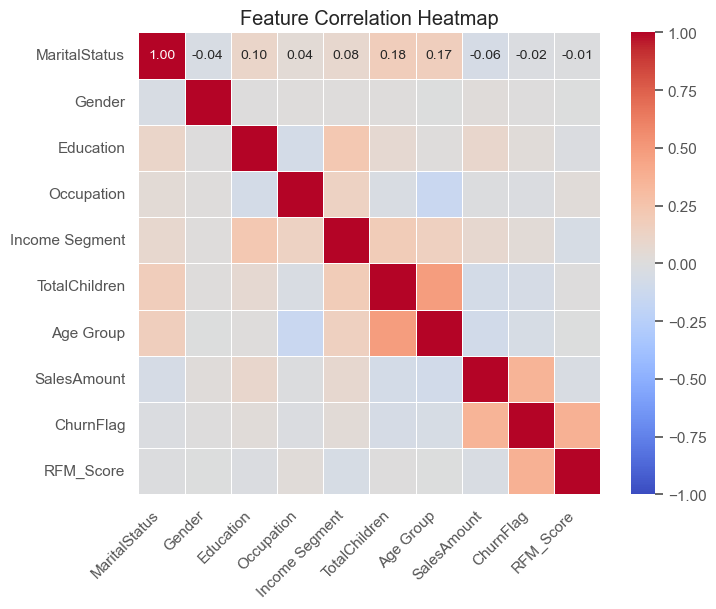

In [192]:
## Generate a Correlation Heatmap for visualization.

# Select numerical columns and calculate the correlation matrix
corr = df_combined.select_dtypes(include=np.number).corr()

# Set up the matplotlib figure
plt.figure(figsize=(8, 6))

# Produce a heatmap of the correlation values
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap='coolwarm',  # Changed color palette
    square=True,      # Make the heatmap square-shaped
    annot=True,       # Annotate the correlation values in each cell
    fmt='.2f',        # Format the annotation to 2 decimal places
    cbar=True,        # Show the color bar
    linewidths=0.5    # Add lines between the cells for better clarity
)

# Add labels to the axes
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,       # Rotate labels for better visibility
    horizontalalignment='right'  # Align text to the right
)
ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=0,        # No rotation for the y-axis labels
    horizontalalignment='right'
)

# Add a title
plt.title('Feature Correlation Heatmap')

# Display the plot
plt.show()

In [193]:
# Defining Features (X) and Target (y) for the Model.

# a) define X as the features
# b) define y as the target
X = df_combined.loc[:, df_combined.columns != "ChurnFlag"]
y = df_combined["ChurnFlag"]

In [194]:
# Checking the Shape of the Features Matrix (X)

X.shape

(13410, 9)

In [195]:
X.columns

Index(['MaritalStatus', 'Gender', 'Education', 'Occupation', 'Income Segment',
       'TotalChildren', 'Age Group', 'SalesAmount', 'RFM_Score'],
      dtype='object')

In [196]:
# Feature Selection Using Recursive Feature Elimination (RFE) with Logistic Regression.
# Spliting the dataset, applies Recursive Feature Elimination, and identifies the top two features.

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=RANDOM_STATE)

# Create a logistic regression model
model = LogisticRegression()

# Apply Recursive Feature Elimination (RFE)
rfe = RFE(model, n_features_to_select=2)
fit = rfe.fit(X_train, y_train)

# Get the rankings of features
print("Num Features: %s" % (fit.n_features_))
print("Chosen Features: %s" % (fit.support_))
print("Feature Ranking: %s" % (fit.ranking_))

# Select the top features
Chosen_features = X_train.columns[fit.support_]
print("Chosen Features:", Chosen_features)

C:\Users\iife\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\iife\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\iife\anaconda3\Lib\site-packages\sk

Num Features: 2
Chosen Features: [False False False False  True  True False False False]
Feature Ranking: [7 4 5 2 1 1 3 8 6]
Chosen Features: Index(['Income Segment', 'TotalChildren'], dtype='object')


In [197]:
# Displaying Feature Rankings with RFE

# Get the ranking of the features
ranking = fit.ranking_

feature_names = X_train.columns

# Create a DataFrame with feature names and their rankings
feature_ranking = pd.DataFrame({'Feature': feature_names, 'Ranking': ranking})

# Sort the DataFrame by ranking
feature_ranking = feature_ranking.sort_values(by='Ranking')
print(feature_ranking)

          Feature  Ranking
4  Income Segment        1
5   TotalChildren        1
3      Occupation        2
6       Age Group        3
1          Gender        4
2       Education        5
8       RFM_Score        6
0   MaritalStatus        7
7     SalesAmount        8


In [198]:
X_train

,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,RFM_Score
10012,1,0,5,0,1,2,3,28.9900,344
3301,1,1,1,2,1,1,2,21.4900,233
5512,0,0,3,1,3,3,4,699.0982,121
5397,1,1,5,4,2,2,2,1120.4900,442
2206,0,0,2,4,1,1,2,769.4900,442
...,...,...,...,...,...,...,...,...,...
1937,0,0,2,4,1,2,4,120.0000,133
5191,0,0,3,0,1,2,3,4.9900,444
5390,0,1,3,4,2,1,2,69.9900,333
860,0,1,3,3,2,3,2,3578.2700,411


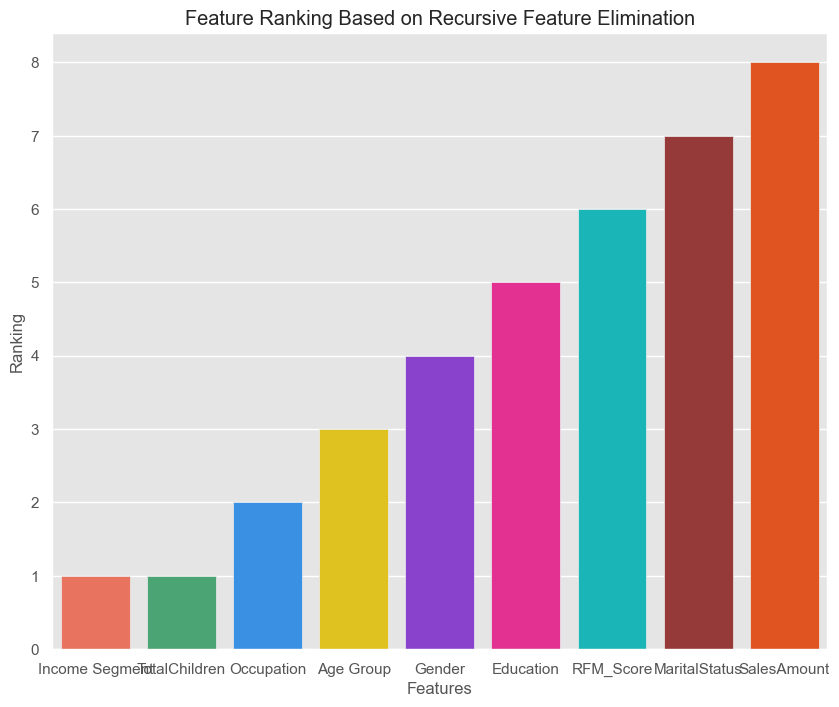

In [199]:
# Visualizing Feature Importance After RFE
# A bar plot visually representing feature importance rankings from Recursive Feature Elimination (RFE).

# Plot the data with different colors for each bar
plt.figure(figsize=(10, 8))

# Custom color list, one color for each bar
colors = ['#FF6347', '#3CB371', '#1E90FF', '#FFD700', '#8A2BE2', '#FF1493', '#00CED1', '#A52A2A', '#FF4500']

sns.barplot(x='Feature', y='Ranking', data=feature_ranking, palette=colors)

# Add titles and labels
plt.title('Feature Ranking Based on Recursive Feature Elimination')
plt.xlabel('Features')
plt.ylabel('Ranking')

# Show the plot
plt.show()

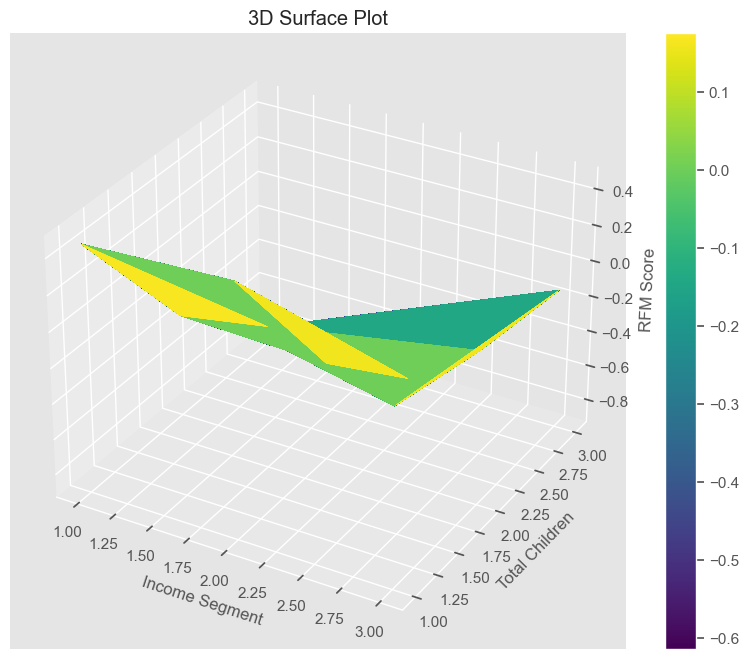

In [200]:
# Creating a 3D surface plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate some grid for the surface plot
x = df_combined['Income Segment']
y = df_combined['TotalChildren']
z = df_combined['RFM_Score']

# Create meshgrid for plotting
x_grid, y_grid = np.meshgrid(x, y)
z_grid = np.sin(x_grid) * np.cos(y_grid)  # Replace this with your function

# Plot the surface
surf = ax.plot_surface(x_grid, y_grid, z_grid, cmap='viridis', edgecolor='none')

# Add labels and title
ax.set_xlabel('Income Segment')
ax.set_ylabel('Total Children')
ax.set_zlabel('RFM Score')
ax.set_title('3D Surface Plot')

# Show color bar
fig.colorbar(surf)

# Display the plot
plt.show()

In [201]:
X_test.shape

(4023, 9)

In [202]:
# Evaluating Model Accuracy with Selected Features.
## To evaluate the model's accuracy with a selected subset of features.


model.fit(X_train[Chosen_features], y_train)
accuracy = model.score(X_test[Chosen_features], y_test)
print("Accuracy of the model with Chosen features:", accuracy)

Accuracy of the model with Chosen features: 0.7564006959980114


### Overview of Logistic Regression Model Training and Evaluation

1. **Initialize Model**: A Logistic Regression model is created with a fixed `random_state` for reproducibility.
2. **Train Model**: The model is trained on the training dataset (`X_train` and `y_train`).
3. **Predict**: Predictions are made on the test set (`X_test`) using the trained model.
4. **Calculate Probabilities (Optional)**: The model's classification probabilities are obtained, which can be used for further evaluation, such as plotting an ROC curve.

In [203]:
# Training and Evaluating a Logistic Regression Model
# To train and evaluate a Logistic Regression model using all features and assess its predictive performance.

# Step 1: Initialize the Logistic Regression model
# Set a random seed for reproducibility
model = LogisticRegression(random_state=RANDOM_STATE)

# Step 2: Train the model on the training dataset
model.fit(X_train, y_train)

# Step 3: Make predictions on the test dataset
y_predictions = model.predict(X_test)

# Step 4 (Optional): Calculate classification probabilities
# These probabilities can be used to construct an ROC curve later
y_probabilities = model.predict_proba(X_test)[:, 0]

C:\Users\iife\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



### Model Performance Evaluation and Recommendations for Customer Churn Prediction

In [204]:
# This calculates the recall score, which is the proportion of actual positive instances that were correctly identified by the model.
# Evaluates how well the model identifies actual churned customers. 
#  high recall means the model correctly detects most churned customers 

recall = recall_score(y_test, y_predictions)
print("Recall Score:", recall)

Recall Score: 0.9162011173184358


In [205]:
# This measures the overall accuracy of the model by comparing the predicted labels (`y_pred`) to the true labels (`y_test`).
# Accuracy tells you how overall correct the model is.

accuracy = accuracy_score(y_test, y_predictions)
print("Accuracy Score:", accuracy)

Accuracy Score: 0.8120805369127517


In [206]:
# This calculates the precision, which is the proportion of predicted positive instances that were correctly identified by the model.
# Measures how many of the predicted churned customers are actually correct. 
# High precision is important to avoid falsely predicting churn when a customer will not actually leave.

precision = precision_score(y_test, y_predictions)
print("Precision Score:", precision)

Precision Score: 0.8476740650653695


### Insights and Recommendations on Customer Churn Model Performance


In [207]:
# Churn Prediction Model report - Performance Evaluation

print(classification_report(y_test, y_predictions, target_names=["not_churned", "churned"]))

              precision    recall  f1-score   support

 not_churned       0.65      0.49      0.56       980
     churned       0.85      0.92      0.88      3043

    accuracy                           0.81      4023
   macro avg       0.75      0.70      0.72      4023
weighted avg       0.80      0.81      0.80      4023



##  Churn Prediction Model Performance: Insights and Recommendations

## Key Insights from the Classification Report:

### Overall Accuracy:
- **Accuracy**: 81% – The model predicts churn/non-churn correctly 81% of the time.

### Performance Breakdown by Class:
- **Not-Churned (0)**:
  - **Precision**: 0.65, **Recall**: 0.49, **F1-Score**: 0.56  
  - The model struggles to identify non-churned customers (many are misclassified as churned).

##### - **Churned (1)**:
  - **Precision**: 0.85, **Recall**: 0.92, **F1-Score**: 0.88  
  - Excellent performance in predicting churned customers.

#### Averages:
- **Macro Average**: Precision: 0.75, Recall: 0.70, F1-Score: 0.72
- **Weighted Average**: Precision: 0.80, Recall: 0.81, F1-Score: 0.80

## Recommendations for Improvement:

1. **Improve Non-Churned Prediction**:
   - **Action**: Focus on improving recall for non-churned customers by adjusting decision thresholds or using techniques like SMOTE or undersampling.

2. **Enhance Data Quality**:
   - **Action**: Review features and consider segmenting customers for tailored models.

3. **Model Calibration**:
   - **Action**: Use techniques like cross-validation and hyperparameter tuning to optimize performance.

4. **Business Implication**:
   - **Churned Customers**: Focus retention efforts on those predicted to churn (92% recall).
   - **Non-Churned Customers**: Engage non-churned customers flagged as at risk before they churn.

## Conclusion:
The model performs well in predicting churned customers but needs improvement in identifying non-churned ones. Enhancing recall for non-churned predictions and refining the model will lead to better-targeted customer retention and engagement strategies.

In [208]:
# Churn Prediction Model: Confusion Matrix Analysis

confusion_matrix(y_test, y_predictions)

array([[ 479,  501],
       [ 255, 2788]], dtype=int64)

In [209]:
## Extracting the predicted probabilities for the positive class (churned customers in your case) from the model.
# This provides richer information by giving the predicted probabilities rather than just the labels.

# Scaling function
scaler = StandardScaler()

# Define the hyperparameter grid for tuning C and penalty
param_grid = dict(C=[0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10], penalty=['l1', 'l2'])

# Logistic Regression model
regr = LogisticRegression(random_state=RANDOM_STATE, solver='liblinear')  # logistic regression with liblinear solver

# GridSearchCV for hyperparameter tuning
cv = GridSearchCV(estimator=regr, param_grid=param_grid, scoring='average_precision')

# Create the pipeline: Scale the data first, then apply grid search on logistic regression
pipeline = make_pipeline(scaler, cv)

# Fit the model to the scaled data
pipeline.fit(X_train, y_train)

# Predict the class labels on the test data
y_predictions = pipeline.predict(X_test)

# Get the predicted probabilities for the positive class (churned customers)
y_score = pipeline.predict_proba(X_test)[:, 1]

In [210]:
# classification report display
print(classification_report(y_test, y_predictions, target_names=["not_churned", "churned"]))

              precision    recall  f1-score   support

 not_churned       0.63      0.46      0.53       980
     churned       0.84      0.91      0.87      3043

    accuracy                           0.80      4023
   macro avg       0.73      0.68      0.70      4023
weighted avg       0.79      0.80      0.79      4023



In [211]:
# # Churn Prediction Model: Confusion Matrix Evaluation

confusion_matrix(y_test, y_predictions)

array([[ 446,  534],
       [ 266, 2777]], dtype=int64)

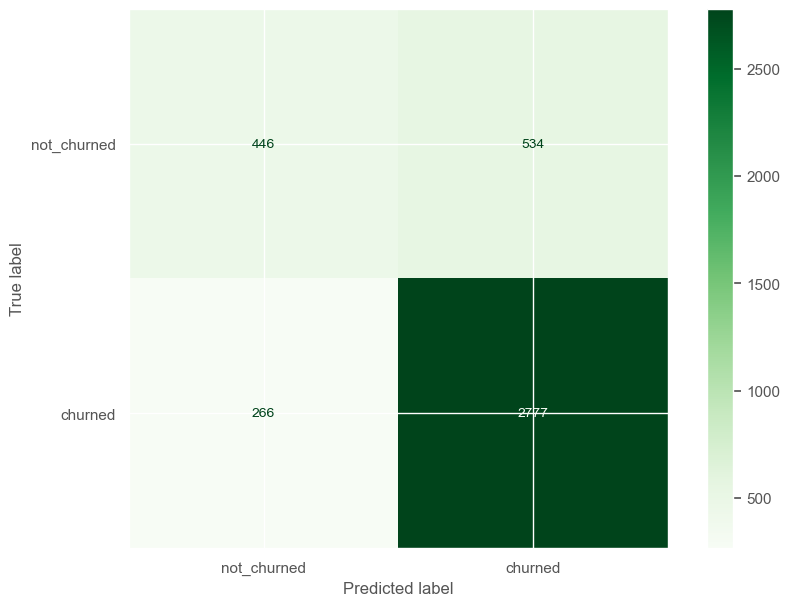

In [212]:
# Displaying the Confusion Matrix

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Generate confusion matrix
cm = confusion_matrix(y_test, y_predictions)

# Display the confusion matrix using ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["not_churned", "churned"])
disp.plot(cmap=plt.cm.Greens)

# Show the plot
plt.show()

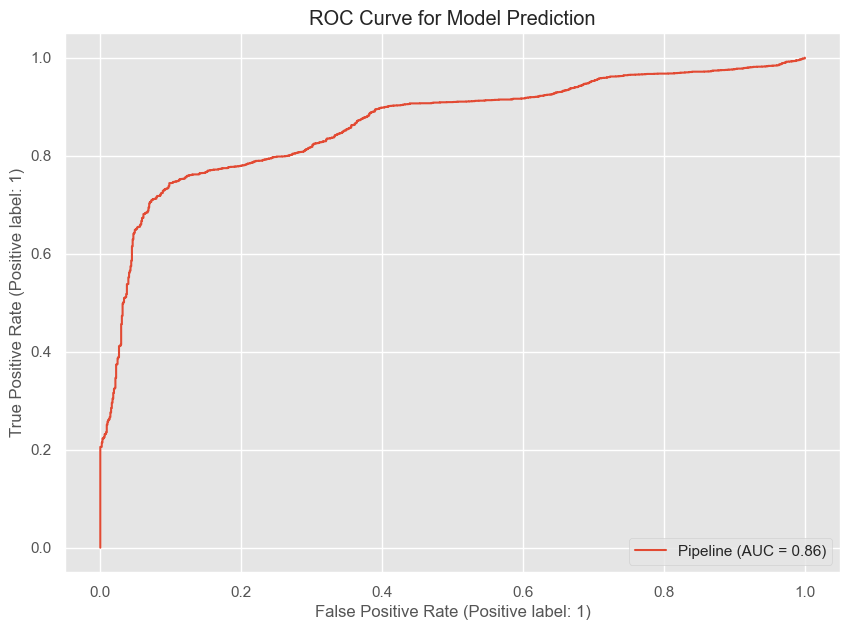

In [213]:
# Plotting ROC Curve for Model Evaluation
# Visualizing the model's performance using the ROC curve.

from sklearn.metrics import RocCurveDisplay

# Plot the ROC curve
RocCurveDisplay.from_estimator(pipeline, X_test, y=y_test)

# Add a title to the plot
plt.title("ROC Curve for Model Prediction")

# Show the plot
plt.show()

In [214]:
df_combined['ChurnFlag'].value_counts()

ChurnFlag
1    10027
0     3383
Name: count, dtype: int64

### Addressing Class Imbalance and Feature Selection in the Model

The dataset exhibits a pronounced imbalance in the target variable, with a substantially higher proportion of churned customers compared to not churned customers. This imbalance has led to a bias in the model's predictions, favoring churned customers, despite achieving a high overall accuracy.

Moreover, the initial model was constructed using all available features. To improve its performance and generalizability, we will rebuild the model by utilizing a subset of features identified through Recursive Feature Elimination (RFE). This refinement will be undertaken after addressing the class imbalance through resampling techniques, ensuring a more balanced and robust predictive model.


#### Mitigating Class Imbalance Through Resampling

The dataset exhibits a significant class imbalance, with a substantially higher number of churned customers compared to those who did not churn. This imbalance can lead to a model that is biased toward predicting churned customers, potentially undermining its ability to accurately classify not churned customers.

Typically, churn datasets tend to have fewer churned customers than non-churned ones. In this case, however, the opposite is true, and as a result, we need to apply more sophisticated resampling techniques. These may include under-sampling the majority class (churned customers) or over-sampling the minority class (not churned customers). By doing so, we aim to create a more balanced dataset, which should enhance the model’s predictive performance and improve its ability to generalize across both classes.


In [215]:
# Resampling to Balance the Class Distribution.
# We address class imbalance by upsampling churned customers to match the not churned class, balancing the dataset and reducing bias.

# Splitting the dataset into minority and majority classes based on churn status
churned_class = df_combined[df_combined.ChurnFlag == 1]  # Churned customers (minority class)
not_churned_class = df_combined[df_combined.ChurnFlag == 0]  # Not churned customers (majority class)

# Upsampling the minority class (churned customers) to match the size of the majority class
churned_upsampled = resample(churned_class, 
                             replace=True,  # Sample with replacement
                             n_samples=len(not_churned_class),  # Match the size of the majority class
                             random_state=200)  # Ensure reproducibility

# Concatenating the upsampled minority class with the majority class
df_upsampled = pd.concat([not_churned_class, churned_upsampled])

# Checking the class distribution in the upsampled dataset
print(df_upsampled['ChurnFlag'].value_counts())

ChurnFlag
0    3383
1    3383
Name: count, dtype: int64


#### Training the model using the balanced dataset to ensure more accurate and unbiased predictions.

In [216]:
df_upsampled.head()

,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,ChurnFlag,RFM_Score
0,1,0,4,4,1,2,2,1700.99,0,242
1,1,0,2,3,2,3,4,4.99,0,344
2,1,0,4,1,2,2,4,21.98,0,244
3,1,0,4,3,2,1,1,4.99,0,244
4,1,1,5,4,2,2,2,21.98,0,344


In [217]:
df_upsampled.columns

Index(['MaritalStatus', 'Gender', 'Education', 'Occupation', 'Income Segment',
       'TotalChildren', 'Age Group', 'SalesAmount', 'ChurnFlag', 'RFM_Score'],
      dtype='object')

In [218]:
df_upsampled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6766 entries, 0 to 3815
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   MaritalStatus   6766 non-null   int64  
 1   Gender          6766 non-null   int64  
 2   Education       6766 non-null   int64  
 3   Occupation      6766 non-null   int32  
 4   Income Segment  6766 non-null   int64  
 5   TotalChildren   6766 non-null   int64  
 6   Age Group       6766 non-null   int64  
 7   SalesAmount     6766 non-null   float64
 8   ChurnFlag       6766 non-null   int64  
 9   RFM_Score       6766 non-null   int64  
dtypes: float64(1), int32(1), int64(8)
memory usage: 555.0 KB


# Feature Selection Based on RFE Ranking

Based on the Recursive Feature Elimination (RFE) ranking, the features with the lowest rank are considered the least important for model prediction. These features are:

- **Income Segment (Rank 1)**
- **Total Children (Rank 1)**

The features **Income Segment** and **Total Children**, both ranked 11 in the RFE ranking, are considered the least important for the model. Removing these features will allow the model to focus on more relevant variables, improving its efficiency and predictive performance.

In [219]:
# Removing Unnecessary Features from the Upsampled Dataset

# Dropping the selected features from the upsampled dataframe
drop_features = ['Income Segment', 'TotalChildren']

# Removing the selected features from the dataset
df_upsampled = df_upsampled.drop(drop_features, axis=1)

# Displaying the first few rows of the updated dataframe
df_upsampled.head()  # Display all columns and rows

,MaritalStatus,Gender,Education,Occupation,Age Group,SalesAmount,ChurnFlag,RFM_Score
0,1,0,4,4,2,1700.99,0,242
1,1,0,2,3,4,4.99,0,344
2,1,0,4,1,4,21.98,0,244
3,1,0,4,3,1,4.99,0,244
4,1,1,5,4,2,21.98,0,344


The number of outliers in the dataset is: 0


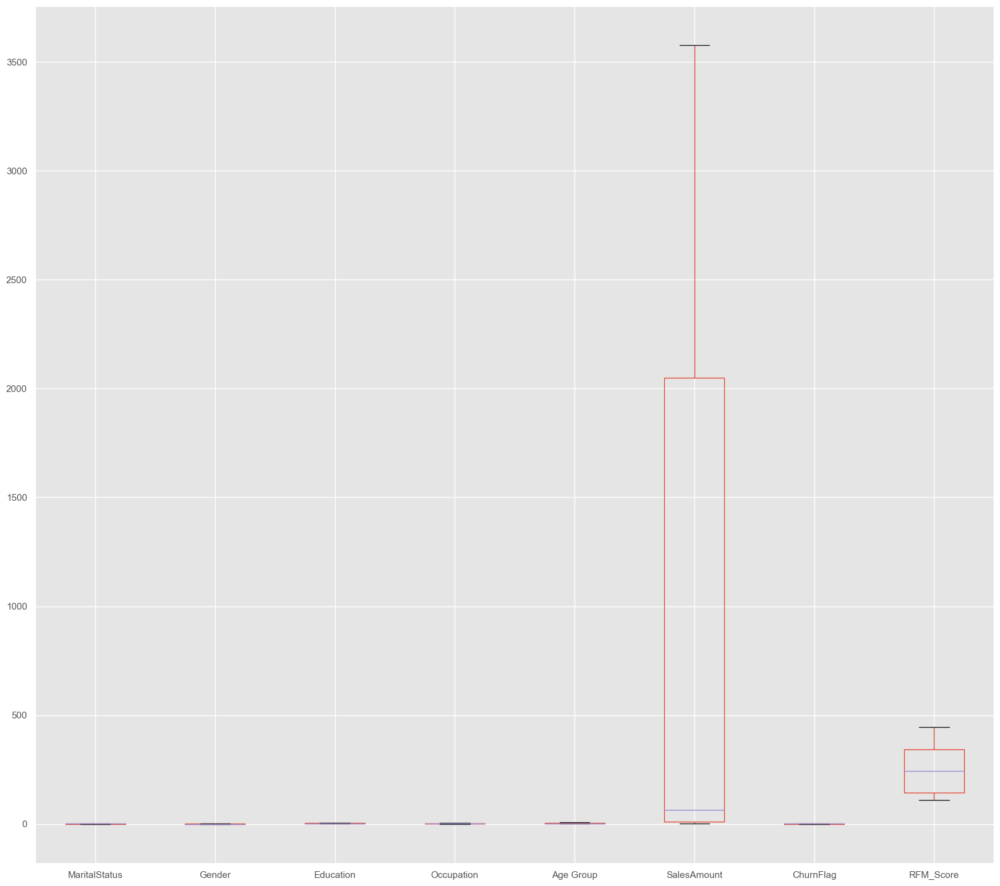

In [220]:
# Outlier Detection and Visualization
# This process ensures the model is trained on data that accurately reflects expected patterns, improving prediction accuracy.


# Plot boxplot for the upsampled dataset
df_upsampled.boxplot(figsize=(10,8))

# Calculate outliers
outliers_count = 0
for column in df_upsampled.select_dtypes(include='number').columns:
    # Calculate the interquartile range (IQR) and outlier bounds for each numeric column
    q1 = df_upsampled[column].quantile(0.25)
    q3 = df_upsampled[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)
    
    # Count the outliers for each column
    outliers_count += ((df_upsampled[column] < lower_bound) | (df_upsampled[column] > upper_bound)).sum()

# Print the number of outliers
print(f'The number of outliers in the dataset is: {outliers_count}')

# Show the plot
plt.show()

In [221]:
# Model Evaluation and Target Variable Analysis

# Train-Test Split
from sklearn.model_selection import train_test_split

# Split the dataset into features (X) and target (y)
X = df_upsampled.drop('ChurnFlag', axis=1)
y = df_upsampled['ChurnFlag']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'Training set size: {X_train.shape[0]} samples')
print(f'Test set size: {X_test.shape[0]} samples')

# Cross-Validation
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# Initialize a RandomForest model (or any other model of your choice)
model = RandomForestClassifier()

# Perform cross-validation with 5 folds
cv_scores = cross_val_score(model, X, y, cv=5)
print(f'Cross-validation scores: {cv_scores}')
print(f'Mean cross-validation score: {cv_scores.mean()}')

Training set size: 5412 samples
Test set size: 1354 samples
Cross-validation scores: [0.9254062  0.92387288 0.93422025 0.93126386 0.92904656]
Mean cross-validation score: 0.9287619503024626


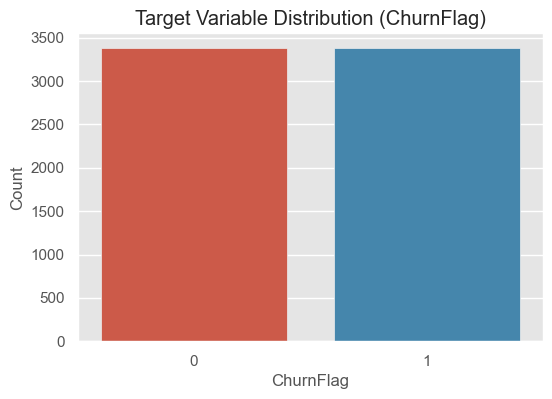

Target Variable Distribution:
ChurnFlag
0    3383
1    3383
Name: count, dtype: int64


In [222]:
# Visualizes and checks the balance of the target variable (ChurnFlag).
# This is crucial for ensuring that the model is not biased.


# Target Variable Analysis
import matplotlib.pyplot as plt
import seaborn as sns

# Check the distribution of the target variable 'ChurnFlag'
target_distribution = df_upsampled['ChurnFlag'].value_counts()

# Plot the distribution
plt.figure(figsize=(6, 4))
sns.barplot(x=target_distribution.index, y=target_distribution.values)
plt.title('Target Variable Distribution (ChurnFlag)')
plt.xlabel('ChurnFlag')
plt.ylabel('Count')
plt.show()

# Print the distribution count
print(f'Target Variable Distribution:\n{target_distribution}')

In [225]:
# Defining Features (X) and Target (y)
# X represents the features (input variables) used to predict outcomes, while y is the target variable (the outcome we're trying to predict).

# a) Define X as the features (all columns except 'ChurnFlag')
X = df_upsampled.loc[:, df_upsampled.columns != "ChurnFlag"]

# b) Define y as the target ('ChurnFlag' column)
y = df_upsampled["ChurnFlag"]

In [226]:
# Feature Scaling with StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the data
scaled_data = scaler.fit_transform(X)

# Create a DataFrame with the scaled data
X_scaled = pd.DataFrame(scaled_data, columns=X.columns)

In [228]:
X_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6766 entries, 0 to 6765
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MaritalStatus  6766 non-null   float64
 1   Gender         6766 non-null   float64
 2   Education      6766 non-null   float64
 3   Occupation     6766 non-null   float64
 4   Age Group      6766 non-null   float64
 5   SalesAmount    6766 non-null   float64
 6   RFM_Score      6766 non-null   float64
dtypes: float64(7)
memory usage: 370.1 KB


In [227]:
X_scaled.shape

(6766, 7)

In [229]:
y.shape

(6766,)

In [236]:
pip install xgboost


   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB 330.3 kB/s eta 0:06:19
   ---------------------------------------- 0.2/124.9 MB 1.3 MB/s eta 0:01:36
   ---------------------------------------- 0.4/124.9 MB 2.5 MB/s eta 0:00:50
   ---------------------------------------- 0.9/124.9 MB 4.0 MB/s eta 0:00:32
   ---------------------------------------- 1.2/124.9 MB 4.5 MB/s eta 0:00:28
   ---------------------------------------- 1.6/124.9 MB 5.0 MB/s eta 0:00:25
    --------------------------------------- 1.9/124.9 MB 5.2 MB/s eta 0:00:24
    --------------------------------------- 2.3/124.9 MB 5.5 MB/s eta 0:00:23
    --------------------------------------- 2.6/124.9 MB 5.7 MB/s eta 0:00:22
    --------------------------------------- 2.9/124.9 MB 5.9 MB/s eta 0:00:21
   - -------------------------------------- 3.3/124.9 MB 6.0 MB/s eta 0:00:

LR, 0.7995835263475305, 0.01388813843144549
LDA, 0.8090433342364941, 0.013968401761387745
KNN, 0.8255991452020313, 0.010383644639638385
CART, 0.9102892590876911, 0.008494870299438285
RF, 0.9318661340931538, 0.010287534711022254
NB, 0.8264840970868695, 0.008075277105590929
SVM, 0.8307703233024218, 0.006875973964103004
XGB, 0.9284672633354603, 0.008300399184347752
AdaBoost, 0.9160525901776897, 0.008822187161320987
GBM, 0.9287624658037112, 0.00832004584821471


C:\Users\iife\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\iife\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\iife\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\iife\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\iife\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimize

MLP, 0.8369772228680308, 0.00966048984934149
ExtraTrees, 0.9206327078216636, 0.012902475372628846


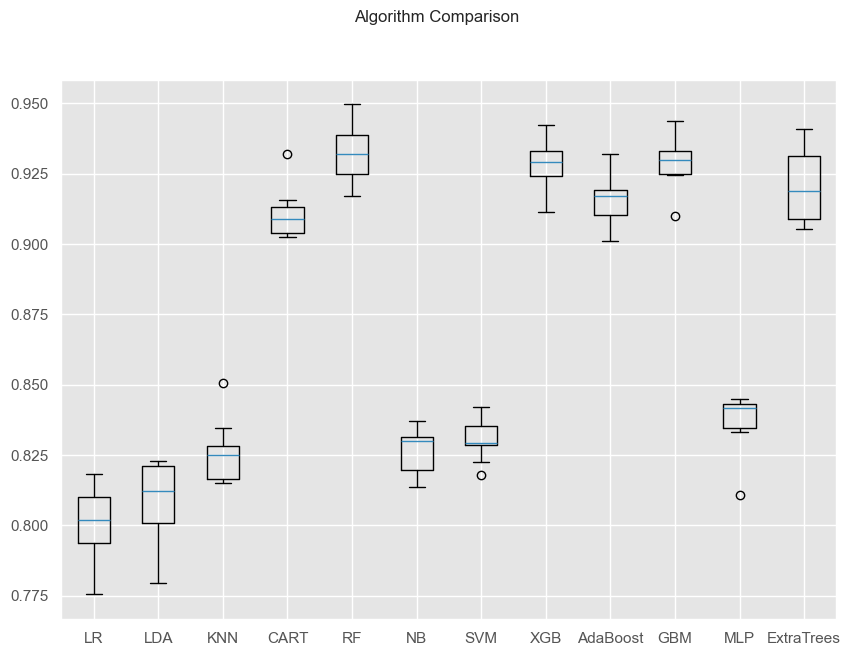

In [237]:
# Import necessary libraries
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB  # Correct import for GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier  # Importing XGBClassifier

# prepare configuration for cross-validation test harness
seed = 7

# prepare models
models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('NB', GaussianNB()))  # GaussianNB for Naive Bayes
models.append(('SVM', SVC()))
models.append(('XGB', XGBClassifier()))  # Adding XGBoost model
models.append(('AdaBoost', AdaBoostClassifier()))  # Adding AdaBoost model
models.append(('GBM', GradientBoostingClassifier()))  # Adding Gradient Boosting model
models.append(('MLP', MLPClassifier()))  # Adding Multi-layer Perceptron model
models.append(('ExtraTrees', ExtraTreesClassifier()))  # Adding Extra Trees model

# evaluate each model in turn
results = []
names = []
scoring = 'accuracy'

for name, model in models:
    kfold = KFold(n_splits=10, shuffle=True, random_state=seed)
    cv_results = cross_val_score(model, X_scaled, y, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = f'{name}, {cv_results.mean()}, {cv_results.std()}'
    print(msg)

# boxplot algorithm comparison
import matplotlib.pyplot as plt

fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

### Model Evaluation Insights for Stakeholders

As part of our analysis, we evaluated several machine learning models to predict customer churn. The performance of these models was assessed using **cross-validation**, and the key metric we used for comparison is **accuracy**. Here’s a summary of the results:

#### Best Performing Models:
- The top performers in terms of accuracy are **Random Forest (RF)**, **Gradient Boosting (GBM)**, and **XGBoost (XGB)**, with accuracy scores of approximately **93%**. These models are highly capable of predicting customer churn, indicating that they can distinguish between customers who will churn and those who will stay with the company.

#### Other Strong Performers:
- **Support Vector Machine (SVM)**, **K-Nearest Neighbors (KNN)**, and **Multi-layer Perceptron (MLP)** show good accuracy rates ranging from **82% to 84%**. These models are also viable options, offering a balance between predictive power and computational efficiency.

#### Moderate Performers:
- **Logistic Regression (LR)** and **Naive Bayes (NB)** performed slightly lower, with accuracy around **80%**. These models are simpler and faster but may not capture as many complexities in the data as the more advanced models.

#### Overfitting Risk:
- While **CART** (Classification and Regression Tree) performed very well with **91%** accuracy, this model is prone to **overfitting**, meaning it could be too tailored to the training data and may not generalize well to new, unseen data.

#### Consistency:
- Most models exhibit low variability (standard deviations are around **0.006 to 0.01**), suggesting that their performance is stable across different subsets of the data.

#### Key Takeaways:
- **Random Forest, XGBoost, and GBM** are the most reliable models in predicting customer churn. These models can be trusted to provide accurate insights and drive decision-making on customer retention strategies.
- **SVM, KNN, and MLP** also provide strong performance and can be used when computational efficiency is a priority.
- **CART** could be useful for quick insights but requires additional checks to ensure that it doesn’t overfit the data.
- **Logistic Regression and Naive Bayes** are faster but may not be as accurate for this task.

#### Recommendations for Stakeholders:
- **Focus on Random Forest, XGBoost, and Gradient Boosting** for the most accurate churn predictions. These models will give you the best chances of identifying customers likely to churn.
- Consider **KNN, SVM, and MLP** for use cases where speed and efficiency are more important, but with slightly lower accuracy.
- Review model performance regularly to ensure no overfitting, especially for decision-tree-based models like **CART**.
- Leveraging these models will help improve customer retention strategies, targeted marketing efforts, and resource allocation, ultimately improving business outcomes.

By using these models, the company can enhance its predictive capabilities and take proactive actions to reduce churn, improving overall customer satisfaction and business profitability.

In [ ]:
# Splitting Our Historical Dataset into Train and Test Dataset

In this step, we split the dataset into **training** and **testing** sets. The training set is used to build and train the model, while the test set is reserved to evaluate the model's performance on unseen data. This ensures that the model's predictions are not biased by the same data it was trained on.

```python
# Splitting the dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled,       # Features after scaling
    y,              # Target variable (ChurnFlag)
    test_size=0.2,  # 20% of data used for testing
    random_state=RANDOM_STATE  # Ensures reproducibility of the split
)

#### Since Random Forest (RF) is the best model, we will proceed with building and training it to predict customer churn.

In [238]:
# Splitting the Dataset into Train and Test Dataset
# We split the dataset into training and testing sets to train the model and evaluate its performance on unseen data.

# Splitting the dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled,       # Features after scaling
    y,              # Target variable (ChurnFlag)
    test_size=0.2,  # 20% of data used for testing
    random_state=RANDOM_STATE  # Ensures reproducibility of the split
)

In [244]:
# Random Forest Hyperparameter Tuning using GridSearchCV
# In this step, we perform hyperparameter tuning for the **Random Forest** model using **GridSearchCV**. This helps identify the best combination of parameters to optimize the model's performance.

### Step-by-Step Code Explanation:

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Define the parameter grid to search for the best parameters
param_grid = {
    'n_estimators': [50, 100, 200],               # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'],     # Number of features to consider at each split
    'max_depth': [None, 10, 20, 30],               # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],               # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 4],                 # Minimum samples required to be at a leaf node
    'bootstrap': [True, False]                     # Whether bootstrap samples are used when building trees
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, 
                           cv=5, n_jobs=-1, verbose=2)

# Fit the model to the training data
grid_search.fit(X_train, y_train)

# Output the best hyperparameters and the best estimator found by GridSearchCV
print("Optimal Hyperparameters:", grid_search.best_params_)
print("Best Random Forest Model:", grid_search.best_estimator_)

# Use the best model to make predictions on the test set
best_rf = grid_search.best_estimator_
y_predictions = best_rf.predict(X_test)

# Evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_predictions)
print(f'Accuracy: {accuracy}')

# Display the classification report for model evaluation
print("Classification Report:")
print(classification_report(y_test, y_predictions))

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


C:\Users\iife\anaconda3\Lib\site-packages\sklearn\ensemble\_forest.py:424: FutureWarning:

`max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.



Optimal Hyperparameters: {'bootstrap': False, 'max_depth': 20, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Best Random Forest Model: RandomForestClassifier(bootstrap=False, max_depth=20, max_features='auto',
                       min_samples_split=5, n_estimators=200, random_state=42)
Accuracy: 0.9320531757754801
Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.95      0.93       689
           1       0.95      0.91      0.93       665

    accuracy                           0.93      1354
   macro avg       0.93      0.93      0.93      1354
weighted avg       0.93      0.93      0.93      1354



In [245]:
from sklearn.metrics import confusion_matrix

# Assuming y_test and y_pred are already defined
cm = confusion_matrix(y_test, y_predictions)

print(cm)

[[657  32]
 [ 60 605]]


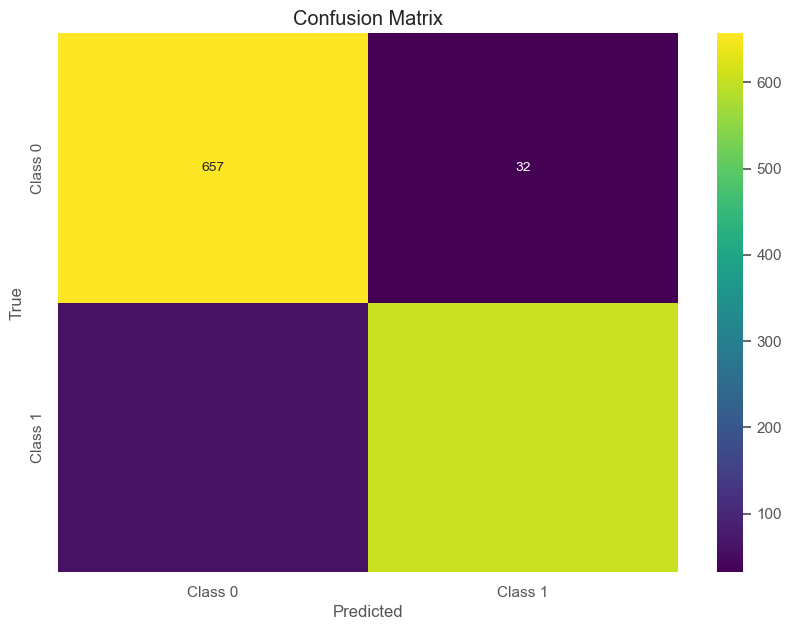

In [249]:
# Visualizing it in a more readable format (especially for multi-class problems), you can use a heatmap.
# This gives a clear, visual representation of the performance of the classification model.

import seaborn as sns
import matplotlib.pyplot as plt

# Visualize confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=['Class 0', 'Class 1'], yticklabels=['Class 0', 'Class 1'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Model Performance Summary

The model demonstrates strong overall performance, achieving an accuracy of **93%**, meaning it correctly predicts 93% of the instances in the dataset. This indicates the model is highly effective in distinguishing between the two classes, with balanced precision, recall, and F1-scores across both.

---

#### **Precision:**
- **Class 0**: **92%** — The model is highly accurate when predicting Class 0, correctly classifying 92% of the instances it identifies as Class 0.
- **Class 1**: **95%** — The model performs excellently in predicting Class 1, with a high precision of 95%.

---

#### **Recall:**
- **Class 0**: **95%** — The model successfully identifies 95% of all actual Class 0 instances, indicating strong recall for this class.
- **Class 1**: **91%** — The model correctly identifies 91% of true Class 1 instances, which is still a strong result but shows slightly more room for improvement compared to Class 0.

---

#### **F1-Score:**
- **Class 0**: **93%** — The F1-score for Class 0 indicates a good balance between precision and recall, suggesting the model is neither too conservative nor too lenient in predicting Class 0.
- **Class 1**: **93%** — Similarly, the F1-score for Class 1 shows a balanced performance, maintaining a strong trade-off between precision and recall.

---

#### **Macro Average**: **93%** — 
- The macro average (mean of the precision, recall, and F1-score for each class) also stands at 93%, indicating that the model is performing equally well across both classes without favoring one over the other.

---

#### **Weighted Average**: **93%** — 
- The model maintains consistent performance, reaffirming its overall robustness.

---

#### **Summary and Emphasis on Accuracy:**
The model demonstrates **excellent overall performance**, with an **accuracy of 93%**, which is a strong indicator of the model's general effectiveness in correctly classifying instances. The model's precision, recall, and F1-scores for both classes are also very high, indicating a well-balanced model with minimal bias toward any particular class.

---

- The **accuracy of 93%** suggests the model is highly reliable, correctly classifying a large proportion of instances.
- The **precision** and **recall** for both classes are similarly strong, indicating that the model effectively identifies and classifies both Class 0 and Class 1 instances with minimal errors.
- The **F1-scores** further confirm that the model maintains a good trade-off between precision and recall for both classes, highlighting that it is not overly biased toward one metric at the expense of the other.

---

Thus, the model is highly effective for this classification task, with **accuracy being the standout metric**. However, for future model evaluations, especially with imbalanced datasets, it would be prudent to monitor the confusion matrix and class-specific metrics to ensure that no class is being misrepresented.

---

#### Model Serialization for Deployment on Live Dataset

To deploy our trained model on a live dataset, we need to serialize it for future use. In this case, the live dataset is represented by the `not_churned_60` dataset. We'll save the model so it can be loaded and used for predictions on new, unseen data.


In [253]:
### Storing the Optimized Model

# To store the best-performing model for future use, we will serialize it using `joblib`. 
# The model will be saved as `'optimized_model.joblib'`, allowing for easy loading and deployment on live datasets for predictions.

# Save the best model
joblib.dump(best_rf, 'optimized_model.joblib')

['optimized_model.joblib']

In [255]:
### Loading the Saved Optimized Model
# To load the previously saved model for making predictions on new data, we can use `joblib`. 
# The model will be loaded into the variable `optimized_model` for further use.

# Load the saved model
best_rf_loaded = joblib.load('optimized_model.joblib')

## Applying the Model to the Live Dataset

In this step, we will use the trained and loaded model to make predictions on the `not_churned_60` live dataset. This allows us to assess how the model performs on new, unseen data.

In [260]:
### Preview of the Live Dataset (`not_churned_60`)
# Here is a preview of the `not_churned_60` dataset, which represents our live data. 
# This dataset will be used for making predictions with the previously loaded model.


# Display the first few rows of the live dataset
not_churned_60.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score
17811,28811,1,0,5,4,1,2,2,24.99,2013-08-11,0,333
133,11133,0,1,1,0,1,1,1,35.00,2013-12-30,0,123
3784,14784,0,0,4,0,1,2,3,28.99,2013-07-04,0,113
14190,25190,1,1,5,1,2,2,6,32.60,2013-09-13,0,244
8638,19638,1,1,2,4,1,1,1,4.99,2013-12-26,0,144


In [263]:
### Creating a Copy of the Live Dataset (`non_churners_60_`)
# To avoid altering the original `not_churners_60` dataset during the prediction process, we create a copy of it and store it in the variable `not_churned_60_`. 
# This ensures that the original dataset remains intact for any future use or reference.

# Create a copy of the live dataset
not_churned_60_ = not_churned_60.copy()

### Ensuring Feature Compatibility with the Model

Before applying the model to the live dataset (`not_churned_60`), it is essential to ensure that the dataset has the same feature set as the training data used to build the model. This requires performing necessary data wrangling and preprocessing on the live dataset to align its structure and features with the model's requirements.

In [265]:
### Preparing the Live Dataset for Prediction

# To align the live dataset with the features used for model training, we drop unnecessary columns of the model's feature set. 
# The columns removed include `['ChurnFlag', 'Income Segment', 'CustomerKey', 'OrderDate', 'TotalChildren']`. 
# The resulting dataset is stored in `live_data`.

# Drop unnecessary columns from the live dataset
col_to_drop = ['ChurnFlag', 'Income Segment', 'CustomerKey', 'OrderDate', 'TotalChildren']
live_data = not_churned_60.drop(col_to_drop, axis=1)

# Preview the modified live dataset
live_data.head()

,MaritalStatus,Gender,Education,Occupation,Age Group,SalesAmount,RFM_Score
17811,1,0,5,4,2,24.99,333
133,0,1,1,0,1,35.00,123
3784,0,0,4,0,3,28.99,113
14190,1,1,5,1,6,32.60,244
8638,1,1,2,4,1,4.99,144


In [266]:
live_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5074 entries, 17811 to 16029
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MaritalStatus  5074 non-null   int64  
 1   Gender         5074 non-null   int64  
 2   Education      5074 non-null   int64  
 3   Occupation     5074 non-null   int32  
 4   Age Group      5074 non-null   int64  
 5   SalesAmount    5074 non-null   float64
 6   RFM_Score      5074 non-null   int64  
dtypes: float64(1), int32(1), int64(5)
memory usage: 297.3 KB


In [271]:
missingValFinder(live_data)

['MaritalStatus has no missing records',
 'Gender has no missing records',
 'Education has no missing records',
 'Occupation has no missing records',
 'Age Group has no missing records',
 'SalesAmount has no missing records',
 'RFM_Score has no missing records']

In [267]:
live_data.value_counts()

MaritalStatus  Gender  Education  Occupation  Age Group  SalesAmount  RFM_Score
1              1       4          1           5          4.99         144          7
               0       3          3           4          4.99         144          6
                                              3          4.99         144          6
                                              4          4.99         344          6
                       4          1           5          4.99         244          6
                                                                                  ..
0              1       3          4           2          21.49        244          1
                                                                      343          1
                                                         21.98        234          1
                                                                      313          1
1              1       5          4           6          120.00       

In [270]:
live_data.shape

(5074, 7)

In [272]:
### Preview of the Test Dataset (`X_test`)
# Here is a preview of the `X_test` dataset, which represents the test features used for evaluating the model's performance.

X_test.head()

,MaritalStatus,Gender,Education,Occupation,Age Group,SalesAmount,RFM_Score
457,-1.082622,-0.997343,-1.092698,0.496253,-0.001739,-0.753823,-0.465074
6476,0.923683,1.002664,-0.255890,-1.651039,-0.842399,-0.177144,-0.386371
217,0.923683,1.002664,0.580917,1.212017,-0.842399,0.658812,0.575562
4314,0.923683,1.002664,0.580917,0.496253,0.838920,-0.756292,0.321962
534,0.923683,-0.997343,0.580917,-1.651039,-0.001739,1.278220,-0.386371


In [274]:
### Scaling the Live Dataset
# To ensure the live dataset is ready for prediction, we standardize its features using `StandardScaler`. 
# This step is crucial to align the feature distributions with the model's expectations.

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform the data
scaled_live_data = scaler.fit_transform(live_data)

# Create a DataFrame with the scaled data
live_data_scaled = pd.DataFrame(scaled_live_data, columns=live_data.columns)

In [275]:
### Preview of the Scaled Live Dataset (`live_data_scaled`)

live_data_scaled.head()

,MaritalStatus,Gender,Education,Occupation,Age Group,SalesAmount,RFM_Score
0,0.893674,-0.983192,1.481773,1.184886,-0.833753,-0.519064,1.276666
1,-1.118976,1.017095,-1.839860,-1.662769,-1.652817,-0.504912,-1.286514
2,-1.118976,-0.983192,0.651365,-1.662769,-0.014690,-0.513409,-1.408571
3,0.893674,1.017095,1.481773,-0.950855,2.442501,-0.508305,0.190366
4,0.893674,1.017095,-1.009452,1.184886,-1.652817,-0.547340,-1.030196


In [280]:
### Making Predictions on the Scaled Live Dataset
## We use the trained model (`best_rf_loaded`) to predict outcomes on the scaled live dataset (`live_data_scaled`).

# Make predictions using the loaded model
predictions_live_data = best_rf_loaded.predict(live_data_scaled)

### Adding Predicted Values to the Live Dataset
To integrate the predicted values into the live dataset, we need to concatenate the predictions with the original `live_data` dataset. To ensure proper alignment and avoid missing values (NaN) after conversion, we will reset the indices of both `live_data` and the prediction results. This ensures that both datasets are aligned correctly before concatenation.

In [284]:
### Organizing Predictions into a DataFrame
# This step involves converting the predicted values into a pandas DataFrame for easy manipulation and analysis. 
# The predictions are stored in the 'ChurnFlag' column, indicating whether a customer will churn.

# Convert predictions into a DataFrame with column name 'ChurnFlag'
predictions_live_data_df = pd.DataFrame(predictions_live_data, columns=['ChurnFlag'])

In [286]:
predictions_live_data_df.head()

,ChurnFlag
0,1
1,0
2,0
3,0
4,0


In [287]:
# This will reset the indices and ensure the new column 'ChurnFlag' is correctly labeled with the predictions. 

# Reset indices to ensure alignment
live_data_scaled.reset_index(drop=True, inplace=True)
predictions_live_data_df.reset_index(drop=True, inplace=True)

In [288]:
# Concatenate the dataframes along columns (axis=1)
live_data_combined = pd.concat([live_data_scaled, predictions_live_data_df], axis=1)

# Add overall heading
print("Concatenated DataFrame: Live Data with Predictions")

# Display the first few rows of the concatenated dataframe
live_data_combined.head()

Concatenated DataFrame: Live Data with Predictions


,MaritalStatus,Gender,Education,Occupation,Age Group,SalesAmount,RFM_Score,ChurnFlag
0,0.893674,-0.983192,1.481773,1.184886,-0.833753,-0.519064,1.276666,1
1,-1.118976,1.017095,-1.839860,-1.662769,-1.652817,-0.504912,-1.286514,0
2,-1.118976,-0.983192,0.651365,-1.662769,-0.014690,-0.513409,-1.408571,0
3,0.893674,1.017095,1.481773,-0.950855,2.442501,-0.508305,0.190366,0
4,0.893674,1.017095,-1.009452,1.184886,-1.652817,-0.547340,-1.030196,0


In [292]:
live_data_combined['ChurnFlag'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 5074 entries, 0 to 5073
Series name: ChurnFlag
Non-Null Count  Dtype
--------------  -----
5074 non-null   int64
dtypes: int64(1)
memory usage: 39.8 KB


In [293]:
# Displaying the unique values in the 'ChurnFlag' column

live_data_combined['ChurnFlag'].unique()

array([1, 0], dtype=int64)

In [291]:
live_data_combined['ChurnFlag'].value_counts()

ChurnFlag
0    2933
1    2141
Name: count, dtype: int64

In [297]:
# Calculate churn and non-churn percentages
churn_percentage = (live_data_combined['ChurnFlag'].sum() / len(live_data_combined)) * 100
non_churn_percentage = ((len(live_data_combined) - live_data_combined['ChurnFlag'].sum()) / len(live_data_combined)) * 100

# Print the output in a professional tone
print(f"Based on the model's predictions, approximately {churn_percentage:.2f}% of customers are forecasted to churn, "
      f"while {non_churn_percentage:.2f}% are expected to remain loyal.")

Based on the model's predictions, approximately 42.20% of customers are forecasted to churn, while 57.80% are expected to remain loyal.


#### To compute the average annual sales per customer, which will be utilized in our recommendation system.

In [299]:
# Identifying the 60% of customers predicted to remain loyal as the retained segment for further analysis

not_churned_60_.head()

,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score
17811,28811,1,0,5,4,1,2,2,24.99,2013-08-11,0,333
133,11133,0,1,1,0,1,1,1,35.00,2013-12-30,0,123
3784,14784,0,0,4,0,1,2,3,28.99,2013-07-04,0,113
14190,25190,1,1,5,1,2,2,6,32.60,2013-09-13,0,244
8638,19638,1,1,2,4,1,1,1,4.99,2013-12-26,0,144


In [300]:
# Deriving the year from the 'OrderDate' column using .dt.year and storing it in a new 'Year' column.
# This enables the calculation of average annual sales per customer.

# Extract the year from the 'OrderDate' column and create a new 'Year' column
not_churned_60_['Year'] = not_churned_60_['OrderDate'].dt.year

# Print a label and display the first few rows
print("\nDataFrame with 'Year' Extracted from 'OrderDate' for Analysis:")
not_churned_60_.head()


DataFrame with 'Year' Extracted from 'OrderDate' for Analysis:


,CustomerKey,MaritalStatus,Gender,Education,Occupation,Income Segment,TotalChildren,Age Group,SalesAmount,OrderDate,ChurnFlag,RFM_Score,Year
17811,28811,1,0,5,4,1,2,2,24.99,2013-08-11,0,333,2013
133,11133,0,1,1,0,1,1,1,35.00,2013-12-30,0,123,2013
3784,14784,0,0,4,0,1,2,3,28.99,2013-07-04,0,113,2013
14190,25190,1,1,5,1,2,2,6,32.60,2013-09-13,0,244,2013
8638,19638,1,1,2,4,1,1,1,4.99,2013-12-26,0,144,2013


In [301]:
# Annual Revenue Summation by Customer

# Aggregating the revenue by summing the 'SalesAmount' for each customer (CustomerID) across different years.
yearly_revenue = not_churned_60_.groupby(['CustomerKey', 'Year'])['SalesAmount'].sum().reset_index()

# Print a label and display the yearly revenue by customer
print("\nYearly Revenue Calculation for Each Customer:")
print(yearly_revenue)


Yearly Revenue Calculation for Each Customer:
      CustomerKey  Year  SalesAmount
0           11051  2013         8.99
1           11066  2013        35.00
2           11067  2014         4.99
3           11085  2013        35.00
4           11086  2013        34.99
...           ...   ...          ...
5069        29465  2013       742.35
5070        29469  2013      2384.07
5071        29471  2014        21.49
5072        29472  2013        21.49
5073        29477  2013      2384.07

[5074 rows x 3 columns]


In [302]:
# Aggregating data by CustomerID to compute the average annual revenue per customer.

# Group by CustomerKey to calculate average revenue per year for each customer
avg_annual_revenue_per_customer = yearly_revenue.groupby('CustomerKey')['SalesAmount'].mean().reset_index()
avg_annual_revenue_per_customer.rename(columns={'SalesAmount': 'AverageRevenuePerYear'}, inplace=True)

# Print the average revenue per customer per year
print("\nAverage Annual Revenue per Customer:")
print(avg_annual_revenue_per_customer)


Average Annual Revenue per Customer:
      CustomerKey  AverageRevenuePerYear
0           11051                   8.99
1           11066                  35.00
2           11067                   4.99
3           11085                  35.00
4           11086                  34.99
...           ...                    ...
5069        29465                 742.35
5070        29469                2384.07
5071        29471                  21.49
5072        29472                  21.49
5073        29477                2384.07

[5074 rows x 2 columns]


In [331]:
# Get unique years from the 'Year' column
unique_years = not_churned_60_['Year'].unique()

# Print or display the unique years with a label
print("Unique Years:", unique_years)

Unique Years: [2013 2014]


C:\Users\iife\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\iife\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



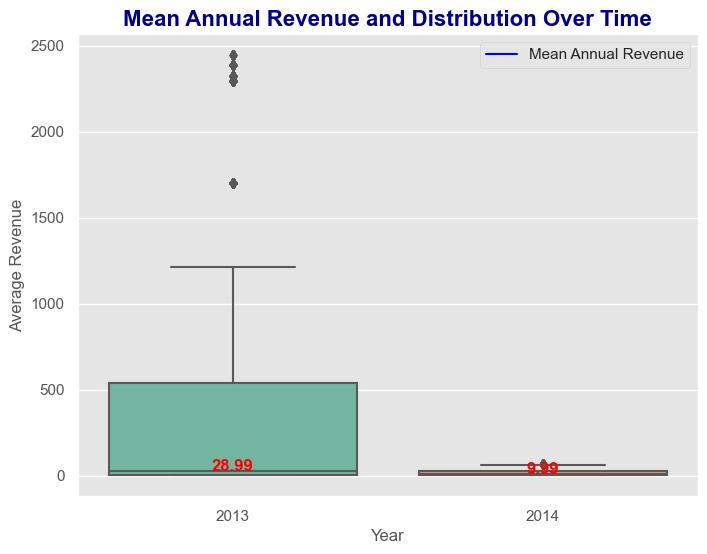

In [325]:
# Boxplot showing both the mean annual revenue trend (using a line plot) and the distribution of annual revenue 

import matplotlib.pyplot as plt
import seaborn as sns

# Set the size of the figure
plt.figure(figsize=(8, 6))

# Plot the line plot (mean revenue trend)
sns.lineplot(x='Year', y='AverageRevenuePerYear', data=avg_annual_revenue_per_customer, label='Mean Annual Revenue', color='blue')

# Overlay the boxplot (distribution of revenue for each year) with green color
sns.boxplot(x='Year', y='AverageRevenuePerYear', data=avg_annual_revenue_per_customer, palette='Set2')

# Add text annotations in red color at specific points (example: median value for each year)
medians = avg_annual_revenue_per_customer.groupby('Year')['AverageRevenuePerYear'].median()
for i, year in enumerate(medians.index):
    plt.text(i, medians[year], f'{medians[year]:.2f}', horizontalalignment='center', size=12, color='red', weight='semibold')

# Title and labels
plt.title('Average Annual Revenue and Distribution Over Time', fontsize=16, fontweight='bold', color='darkblue')
plt.xlabel('Year', fontsize=12)
plt.ylabel('Average Revenue', fontsize=12)

# Show legend
plt.legend()

# Display the plot
plt.show()

C:\Users\iife\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\iife\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



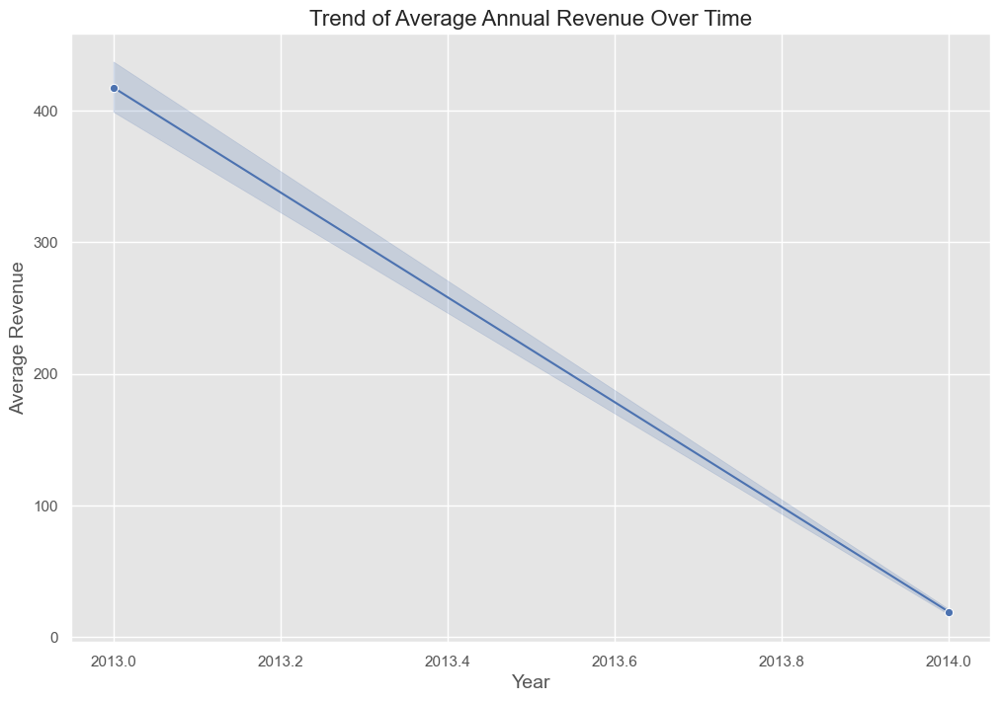

In [328]:
# Line Plot is great for showing the trend of the Average Annual Revenue over time (across years), 
# it gives insights into how the average revenue evolves. 

import matplotlib.pyplot as plt
import seaborn as sns

# Create a line plot to show the trend of average annual revenue over the years
plt.figure(figsize=(12, 8))
sns.lineplot(x='Year', y='AverageRevenuePerYear', data=avg_annual_revenue_per_customer, marker='o', color='b')

# Add title and labels
plt.title('Trend of Average Annual Revenue Over Time', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Revenue', fontsize=14)

# Show the plot
plt.show()

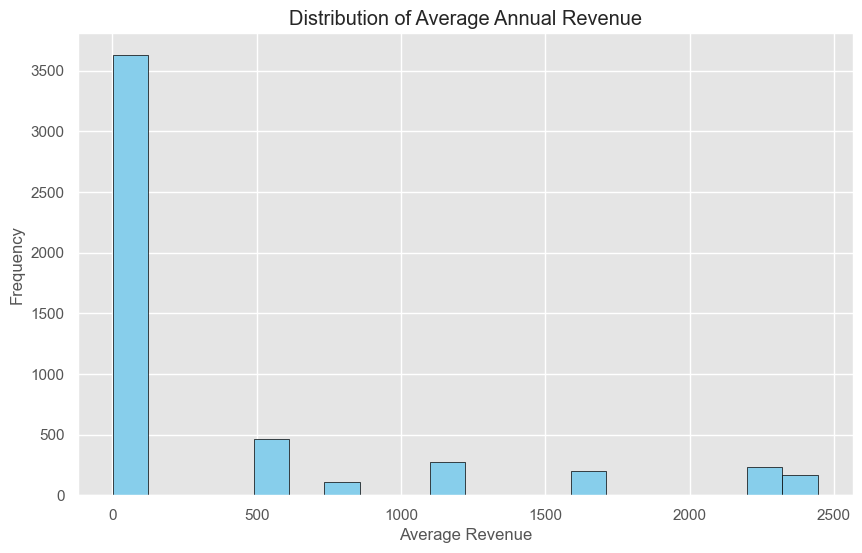

In [317]:
# Assuming avg_annual_revenue_per_customer is a DataFrame containing the column 'AverageRevenuePerYear'
plt.figure(figsize=(10, 6))

# Plot histogram with 20 bins, skyblue color, and black edge color
plt.hist(avg_annual_revenue_per_customer['AverageRevenuePerYear'], bins=20, color='skyblue', edgecolor='black')

# Set the title and labels for the axes
plt.title('Distribution of Average Annual Revenue')
plt.xlabel('Average Revenue')
plt.ylabel('Frequency')

# Display the plot
plt.show()

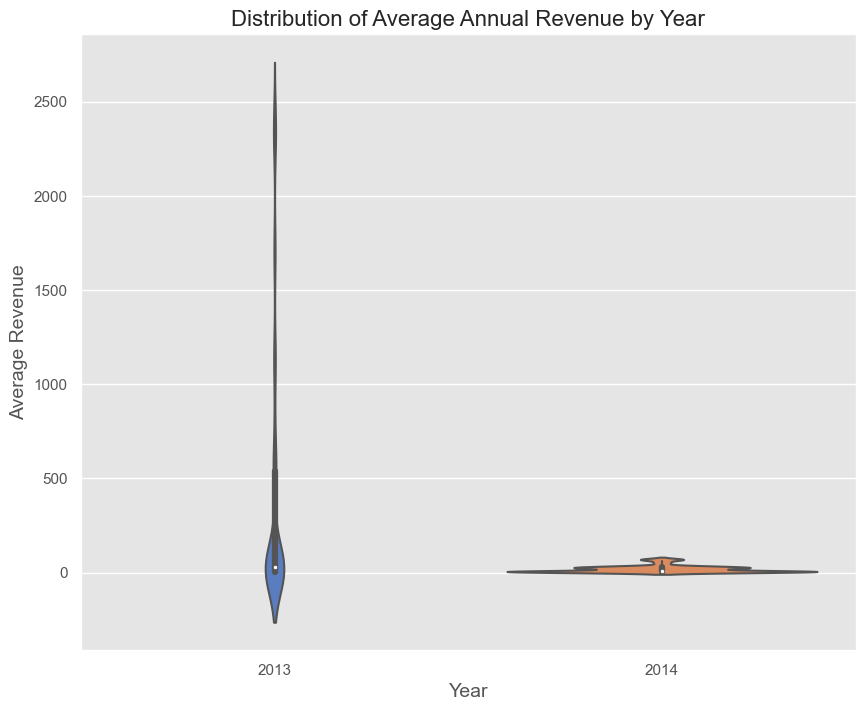

In [327]:
# The plot will display both the distribution and the density of revenues, 
# It makes it easy to see how the average revenue varies within each year and how "spread out" the revenues are.


import matplotlib.pyplot as plt
import seaborn as sns

# Create the violin plot to visualize the distribution of 'AverageRevenuePerYear'
plt.figure(figsize=(10, 8))
sns.violinplot(x='Year', y='AverageRevenuePerYear', data=avg_annual_revenue_per_customer, palette='muted')

# Add title and labels
plt.title('Distribution of Average Annual Revenue by Year', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Revenue', fontsize=14)

# Show the plot
plt.show()

In [336]:
# Calculating Average Sales per Customer: Verifying Required Columns and Aggregating Data

# Verify that the dataset includes the necessary columns: 'CustomerKey' and 'SalesAmount'
required_columns = ['CustomerKey', 'SalesAmount']
missing_columns = [col for col in required_columns if col not in not_churned_60_.columns]

if missing_columns:
    raise ValueError(f"The dataset is missing the following required columns: {', '.join(missing_columns)}")

# Group by CustomerKey and sum the SalesAmount
customer_sales = not_churned_60_.groupby('CustomerKey')['SalesAmount'].sum()

# Calculate the average sales per customer
average_sales_per_customer = customer_sales.mean()

# Print the result with a more professional format
print(f'# Calculated Customer-Specific Average Sales: ${average_sales_per_customer:,.2f}')

# Calculated Customer-Specific Average Sales: $392.13


In [338]:
# Display the total number of customers predicted to churn based on the scored dataset
print(f'Total number of customers predicted to churn in the scored dataset: {live_data_combined["ChurnFlag"].value_counts()[1]}')

Total number of customers predicted to churn in the scored dataset: 2141


In [340]:
# Calculate and display the total revenue loss based on the predicted churn data
print(f'Estimated revenue loss from predicted churn in the scored dataset is {2058 * 392.13}')

Estimated revenue loss from predicted churn in the scored dataset is 807003.54


In [346]:
churned_customers = live_data_combined[live_data_combined['ChurnFlag'] == 1]
avg_revenue_loss_per_churned_customer = churned_customers['SalesAmount'].mean()
print(f'Average Revenue Loss per Churned Customer: ${avg_revenue_loss_per_churned_customer:,.2f}')

Average Revenue Loss per Churned Customer: $0.58


In [347]:
total_revenue_churned = live_data_combined[live_data_combined['ChurnFlag'] == 1]['SalesAmount'].sum()
print(f'Estimated Revenue Impact from Churned Customers: ${total_revenue_churned:,.2f}')

Revenue Impact from Churned Customers: $1,232.41


In [341]:
# Calculate customer retention rate
retention_rate = ((len(live_data_combined) - live_data_combined['ChurnFlag'].sum()) / len(live_data_combined)) * 100

# Print the retention rate with a label
print(f'Customer Retention Rate: {retention_rate:.2f}%')

Customer Retention Rate: 57.80%


In [343]:
# calculating the customer churn rate based on the ChurnFlag in the live data

# Calculate customer churn rate
churn_rate = (live_data_combined['ChurnFlag'].sum() / len(live_data_combined)) * 100

# Print the churn rate with a label
print(f'Customer Churn Rate: {churn_rate:.2f}%')

Customer Churn Rate: 42.20%


In [348]:
cost_of_retaining_customer = 50  # Example cost
total_retention_cost = len(churned_customers) * cost_of_retaining_customer
print(f'Total Retention Cost to Prevent Churn: ${total_retention_cost:,.2f}')

Total Retention Cost to Prevent Churn: $107,050.00
